#### Author: Adam Van Etten - October 2021

# Notebook for training a YOLT model to detect VisDrone objects

In [1]:
from shapely.affinity import translate
from shapely.geometry import box
import matplotlib.pyplot as plt
from shapely.wkt import loads
import matplotlib as mpl
import geopandas as gpd
from torch import optim
from imp import reload
from tqdm import tqdm
import pandas as pd 
import numpy as np
import collections
import skimage.io
import operator
import shapely
import random
import shutil
import time
import imp
import cv2
import sys
import os
import gc
from torch import autograd
import torch
import PIL
from torchvision import transforms

# # camo src
# camo_path = '/local_data/cosmiq/src/avanetten/camouflage/'
# sys.path.append(os.path.join(camo_path, 'data_prep'))
# sys.path.append(os.path.join(camo_path, 'adversarial-yolt'))
# import cowc_yolt_prep
# import utils as camo_utils
# import prep_train as camo_prep_train
# import load_data
# import patch_config

# yolt src
yoltv4_path = '/local_data/cosmiq/src/avanetten/yoltv4/'
sys.path.append(os.path.join(yoltv4_path, 'yoltv4'))
# sys.path.append(os.path.join(yoltv4_path, 'yoltv4', 'private'))
import prep_train
import tile_ims_labels
import post_process
# import visdrone_yolt_prep
import eval as yolt_eval
import eval_errors as yolt_eval_errors

# patch data
patch_data_root = '/local_data/cosmiq/src/avanetten/camouflage/data/patches'

# set raw dataset path (gpu02)
data_root = '/local_data/cosmiq/wdata/avanetten/VisDrone/data'

# output dirs
train_root = os.path.join(data_root, 'VisDrone2019-DET-train')
val_root = os.path.join(data_root, 'VisDrone2019-DET-val')
test_root = os.path.join(data_root, 'VisDrone2019-DET-test-dev')

----
# Train

Run the following commands within a terminal in a  [YOLTv4](https://github.com/avanetten/yoltv4) docker environment.

## v1_4cat

    NV_GPU=0 nvidia-docker run -itd -v /local_data:/local_data  --ipc=host --name yoltv4_gpu0 yoltv4_image3
    docker attach yoltv4_gpu0

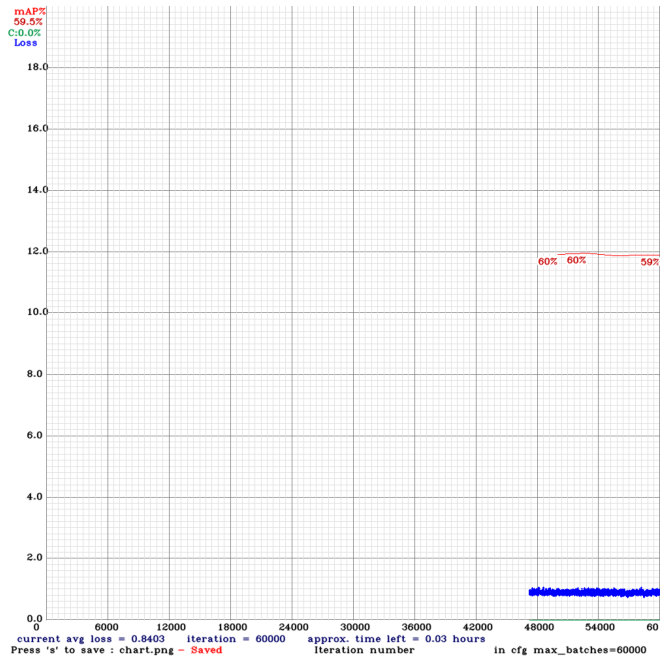

In [2]:
# view progress
name  = 'yolt2_ave_26x26_visdrone_v1_4cat'
f = os.path.join(yoltv4_path, 'darknet/chart_' + name + '.png')
fig, ax = plt.subplots(figsize=(12,12))
ax.axis('off')
_ = ax.imshow(skimage.io.imread(f))

-----------
## Test

In [3]:
# set variables
exp_name = 'v1_4cat'
outdir_txt =   os.path.join(test_root, 'yolt', exp_name, 'txt')
outfile = os.path.join(outdir_txt,  'visdrone_test_' + exp_name + '.data')
display(outfile)
!cat {outfile}

'/local_data/cosmiq/wdata/avanetten/VisDrone/data/VisDrone2019-DET-test-dev/yolt/v1_4cat/txt/visdrone_test_v1_4cat.data'

classes =  4
train = 
valid =  /local_data/cosmiq/wdata/avanetten/VisDrone/data/VisDrone2019-DET-test-dev/yolt/v1_4cat/txt/visdrone_test_list_v1_4cat.txt
names =  /local_data/cosmiq/wdata/avanetten/VisDrone/data/VisDrone2019-DET-test-dev/yolt/v1_4cat/txt/visdrone_v1_4cat.names
backup = backup/


In [2]:
# post process
reload(post_process)

exp_name = 'v1_4cat'
raw_im_dir = os.path.join(test_root, 'yolt', exp_name, 'images')
print("raw_im_dir:", raw_im_dir)

detection_threshes = [0.3]  # [0.3, 0.35, 0.45]  #
outnames = ['yolt2_ave_26x26_visdrone_v1_4cat',
           ]
slice_size = 0 # 416
sep = '__'
im_ext = '.jpg'
chip_ext = '.jpg'
edge_buffer_test=1
show_labels = False  # True
n_plots = 1600
extract_chips, chip_rescale_frac = False, 1.1
allow_nested_detections = True
truth_file_name = '' # 'rareplanes_test_ims_fine_tune.geojson'
verbose = True

for outname in outnames:
    print("outname:", outname)
    out_dir_root = os.path.join(yoltv4_path, 'darknet', 'results', outname)
    pred_dir = os.path.join(out_dir_root, 'orig_txt')
    print("pred_dir:", pred_dir)
        
    for detection_thresh in detection_threshes:
        out_csv = 'preds_refine_' + str(detection_thresh).replace('.', 'p') + '.csv'
        out_geojson_geo_dir = 'geojsons_geo_' + str(detection_thresh).replace('.', 'p')
        out_geojson_pix_dir = 'geojsons_pix_' + str(detection_thresh).replace('.', 'p')
        if extract_chips:
            out_dir_chips = 'detection_chips_' + str(detection_thresh).replace('.', 'p')
        else:
            out_dir_chips = ''
        plot_dir = 'pred_plots_' + str(detection_thresh).replace('.', 'p')
        pred_txt_prefix = outname + '_'

        if len(truth_file_name) > 0:
            truth_file = os.path.join(data_root, 'test', 'geojsons_pix_comb', truth_file_name)
        else:
            truth_file = ''
        # move raw predictions to output dir
        os.makedirs(os.path.join(out_dir_root, 'orig_txt'), exist_ok=True)
        !mv {yoltv4_path}/darknet/results/{outname}*.txt {out_dir_root}/orig_txt/

        # post_process
        post_process.execute(
            pred_dir=pred_dir,
            truth_file=truth_file,
            raw_im_dir=raw_im_dir,
            #sliced_im_dir=sliced_im_dir,
            out_dir_root=out_dir_root,
            out_csv=out_csv,
            out_geojson_geo_dir=out_geojson_geo_dir,
            out_geojson_pix_dir=out_geojson_pix_dir,
            plot_dir=plot_dir,
            out_dir_chips=out_dir_chips,
            im_ext=im_ext,
            chip_ext=chip_ext,
            chip_rescale_frac=chip_rescale_frac,
            allow_nested_detections=allow_nested_detections,
            slice_size=slice_size,
            sep=sep,
            edge_buffer_test=edge_buffer_test,
            pred_txt_prefix=pred_txt_prefix,
            n_plots=n_plots,
            show_labels=show_labels,
            detection_thresh=detection_thresh,
            verbose=verbose)

raw_im_dir: /local_data/cosmiq/wdata/avanetten/VisDrone/data/VisDrone2019-DET-test-dev/yolt/v1_4cat/images
outname: yolt2_ave_26x26_visdrone_v1_4cat
pred_dir: /local_data/cosmiq/src/avanetten/yoltv4/darknet/results/yolt2_ave_26x26_visdrone_v1_4cat/orig_txt
mv: cannot stat '/local_data/cosmiq/src/avanetten/yoltv4//darknet/results/yolt2_ave_26x26_visdrone_v1_4cat*.txt': No such file or directory
df_raw.head:                                          im_name      prob        Xmin  \
0  0000278_02351_d_0000002__x0_944_y0_0_dxdy_416  0.014563  192.601959   
1  0000278_02351_d_0000002__x0_944_y0_0_dxdy_416  0.009585    1.000000   
2  0000278_02351_d_0000002__x0_944_y0_0_dxdy_416  0.007712    1.000000   
3  0000278_02351_d_0000002__x0_944_y0_0_dxdy_416  0.004416  379.332550   
4  0000278_02351_d_0000002__x0_944_y0_0_dxdy_416  0.003086   99.151764   

         Ymin        Xmax        Ymax category  
0    2.353103  214.906158   12.796850      bus  
1  131.129929   23.646912  184.241714      bus 

/opt/conda/envs/solaris/lib/python3.7/site-packages/rasterio/__init__.py:219: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Making output plot...
3 / 11236 0000006_00159_d_0000001__x0_353_y0_349_dxdy_416
 n boxes: 8
Making output plot...
4 / 11236 0000006_00159_d_0000001__x0_706_y0_0_dxdy_416
 n boxes: 15
Making output plot...
5 / 11236 0000006_00159_d_0000001__x0_706_y0_349_dxdy_416
 n boxes: 6
Making output plot...
6 / 11236 0000006_00159_d_0000001__x0_944_y0_0_dxdy_416
 n boxes: 6
Making output plot...
7 / 11236 0000006_00611_d_0000002__x0_0_y0_0_dxdy_416
 n boxes: 2
Making output plot...
8 / 11236 0000006_00611_d_0000002__x0_0_y0_349_dxdy_416
 n boxes: 7
Making output plot...
9 / 11236 0000006_00611_d_0000002__x0_353_y0_0_dxdy_416
 n boxes: 20
Making output plot...
10 / 11236 0000006_00611_d_0000002__x0_353_y0_349_dxdy_416
 n boxes: 15
Making output plot...
11 / 11236 0000006_00611_d_0000002__x0_706_y0_0_dxdy_416
 n boxes: 19
Making output plot...
12 / 11236 0000006_00611_d_0000002__x0_706_y0_349_dxdy_416
 n boxes: 4
Making output plot...
13 / 11236 0000006_00611_d_0000002__x0_944_y0_0_dxdy_416
 n boxes

Making output plot...
96 / 11236 0000011_06000_d_0000009__x0_706_y0_349_dxdy_416
 n boxes: 1
Making output plot...
97 / 11236 0000011_06000_d_0000009__x0_944_y0_0_dxdy_416
 n boxes: 1
Making output plot...
98 / 11236 0000011_06000_d_0000009__x0_944_y0_349_dxdy_416
 n boxes: 2
Making output plot...
99 / 11236 0000011_07307_d_0000011__x0_353_y0_0_dxdy_416
Making output plot...
100 / 11236 0000011_08299_d_0000012__x0_0_y0_349_dxdy_416
 n boxes: 1
Making output plot...
101 / 11236 0000011_08299_d_0000012__x0_706_y0_349_dxdy_416
 n boxes: 1
Making output plot...
102 / 11236 0000054_00786_d_0000001__x0_0_y0_0_dxdy_416
 n boxes: 2
Making output plot...
103 / 11236 0000063_08995_d_0000010__x0_0_y0_0_dxdy_416
 n boxes: 3
Making output plot...
104 / 11236 0000063_08995_d_0000010__x0_0_y0_124_dxdy_416
 n boxes: 3
Making output plot...
105 / 11236 0000063_08995_d_0000010__x0_353_y0_0_dxdy_416
Making output plot...
106 / 11236 0000063_08995_d_0000010__x0_353_y0_124_dxdy_416
Making output plot...
10

 n boxes: 6
Making output plot...
188 / 11236 0000078_02778_d_0000008__x0_353_y0_349_dxdy_416
 n boxes: 4
Making output plot...
189 / 11236 0000078_02778_d_0000008__x0_706_y0_0_dxdy_416
 n boxes: 6
Making output plot...
190 / 11236 0000078_02778_d_0000008__x0_706_y0_349_dxdy_416
 n boxes: 8
Making output plot...
191 / 11236 0000078_02778_d_0000008__x0_944_y0_0_dxdy_416
Making output plot...
192 / 11236 0000078_02778_d_0000008__x0_944_y0_349_dxdy_416
 n boxes: 1
Making output plot...
193 / 11236 0000078_03171_d_0000009__x0_0_y0_0_dxdy_416
 n boxes: 9
Making output plot...
194 / 11236 0000078_03171_d_0000009__x0_353_y0_0_dxdy_416
 n boxes: 13
Making output plot...
195 / 11236 0000078_03171_d_0000009__x0_353_y0_349_dxdy_416
 n boxes: 3
Making output plot...
196 / 11236 0000078_03171_d_0000009__x0_706_y0_0_dxdy_416
 n boxes: 13
Making output plot...
197 / 11236 0000078_03171_d_0000009__x0_706_y0_349_dxdy_416
 n boxes: 4
Making output plot...
198 / 11236 0000078_03171_d_0000009__x0_944_y0_0

Making output plot...
278 / 11236 0000118_02327_d_0000076__x0_944_y0_349_dxdy_416
 n boxes: 3
Making output plot...
279 / 11236 0000118_02632_d_0000077__x0_0_y0_0_dxdy_416
 n boxes: 6
Making output plot...
280 / 11236 0000118_02632_d_0000077__x0_353_y0_0_dxdy_416
 n boxes: 8
Making output plot...
281 / 11236 0000118_02632_d_0000077__x0_353_y0_349_dxdy_416
 n boxes: 1
Making output plot...
282 / 11236 0000118_02632_d_0000077__x0_706_y0_0_dxdy_416
 n boxes: 22
Making output plot...
283 / 11236 0000118_02632_d_0000077__x0_706_y0_349_dxdy_416
 n boxes: 6
Making output plot...
284 / 11236 0000118_02632_d_0000077__x0_944_y0_0_dxdy_416
 n boxes: 9
Making output plot...
285 / 11236 0000118_02632_d_0000077__x0_944_y0_349_dxdy_416
 n boxes: 6
Making output plot...
286 / 11236 0000120_00559_d_0000092__x0_0_y0_0_dxdy_416
 n boxes: 3
Making output plot...
287 / 11236 0000120_00559_d_0000092__x0_0_y0_349_dxdy_416
 n boxes: 5
Making output plot...
288 / 11236 0000120_00559_d_0000092__x0_353_y0_0_dxdy

Making output plot...
368 / 11236 0000127_00265_d_0000120__x0_706_y0_664_dxdy_416
 n boxes: 5
Making output plot...
369 / 11236 0000127_01002_d_0000123__x0_0_y0_664_dxdy_416
 n boxes: 2
Making output plot...
370 / 11236 0000127_01002_d_0000123__x0_1059_y0_0_dxdy_416
 n boxes: 11
Making output plot...
371 / 11236 0000127_01002_d_0000123__x0_1059_y0_664_dxdy_416
 n boxes: 1
Making output plot...
372 / 11236 0000127_01002_d_0000123__x0_1412_y0_0_dxdy_416
 n boxes: 17
Making output plot...
373 / 11236 0000127_01002_d_0000123__x0_1412_y0_353_dxdy_416
 n boxes: 12
Making output plot...
374 / 11236 0000127_01002_d_0000123__x0_1412_y0_664_dxdy_416
 n boxes: 4
Making output plot...
375 / 11236 0000127_01002_d_0000123__x0_1504_y0_0_dxdy_416
 n boxes: 12
Making output plot...
376 / 11236 0000127_01002_d_0000123__x0_1504_y0_353_dxdy_416
 n boxes: 13
Making output plot...
377 / 11236 0000127_01002_d_0000123__x0_1504_y0_664_dxdy_416
 n boxes: 4
Making output plot...
378 / 11236 0000127_01002_d_00001

Making output plot...
459 / 11236 0000187_00024_d_0000189__x0_353_y0_0_dxdy_416
 n boxes: 21
Making output plot...
460 / 11236 0000187_00024_d_0000189__x0_353_y0_124_dxdy_416
 n boxes: 17
Making output plot...
461 / 11236 0000187_00024_d_0000189__x0_544_y0_0_dxdy_416
 n boxes: 9
Making output plot...
462 / 11236 0000187_00024_d_0000189__x0_544_y0_124_dxdy_416
 n boxes: 6
Making output plot...
463 / 11236 0000187_00444_d_0000190__x0_0_y0_0_dxdy_416
 n boxes: 1
Making output plot...
464 / 11236 0000187_00444_d_0000190__x0_0_y0_124_dxdy_416
 n boxes: 1
Making output plot...
465 / 11236 0000187_00444_d_0000190__x0_353_y0_0_dxdy_416
 n boxes: 15
Making output plot...
466 / 11236 0000187_00444_d_0000190__x0_353_y0_124_dxdy_416
 n boxes: 19
Making output plot...
467 / 11236 0000187_00444_d_0000190__x0_544_y0_0_dxdy_416
 n boxes: 2
Making output plot...
468 / 11236 0000187_00444_d_0000190__x0_544_y0_124_dxdy_416
 n boxes: 3
Making output plot...
469 / 11236 0000187_00666_d_0000191__x0_353_y0_0

Making output plot...
550 / 11236 0000259_02000_d_0000005__x0_353_y0_0_dxdy_416
 n boxes: 24
Making output plot...
551 / 11236 0000259_02000_d_0000005__x0_353_y0_349_dxdy_416
 n boxes: 5
Making output plot...
552 / 11236 0000259_02000_d_0000005__x0_706_y0_0_dxdy_416
 n boxes: 16
Making output plot...
553 / 11236 0000259_02000_d_0000005__x0_706_y0_349_dxdy_416
 n boxes: 6
Making output plot...
554 / 11236 0000259_02000_d_0000005__x0_944_y0_0_dxdy_416
 n boxes: 1
Making output plot...
555 / 11236 0000259_02000_d_0000005__x0_944_y0_349_dxdy_416
 n boxes: 2
Making output plot...
556 / 11236 0000259_02500_d_0000006__x0_0_y0_0_dxdy_416
 n boxes: 4
Making output plot...
557 / 11236 0000259_02500_d_0000006__x0_353_y0_0_dxdy_416
 n boxes: 14
Making output plot...
558 / 11236 0000259_02500_d_0000006__x0_353_y0_349_dxdy_416
 n boxes: 5
Making output plot...
559 / 11236 0000259_02500_d_0000006__x0_706_y0_0_dxdy_416
 n boxes: 5
Making output plot...
560 / 11236 0000259_02500_d_0000006__x0_706_y0_34

Making output plot...
639 / 11236 0000272_01500_d_0000004__x0_944_y0_0_dxdy_416
 n boxes: 10
Making output plot...
640 / 11236 0000272_01500_d_0000004__x0_944_y0_349_dxdy_416
 n boxes: 7
Making output plot...
641 / 11236 0000272_02000_d_0000005__x0_0_y0_0_dxdy_416
 n boxes: 17
Making output plot...
642 / 11236 0000272_02000_d_0000005__x0_0_y0_349_dxdy_416
 n boxes: 7
Making output plot...
643 / 11236 0000272_02000_d_0000005__x0_353_y0_0_dxdy_416
 n boxes: 50
Making output plot...
644 / 11236 0000272_02000_d_0000005__x0_353_y0_349_dxdy_416
 n boxes: 3
Making output plot...
645 / 11236 0000272_02000_d_0000005__x0_706_y0_0_dxdy_416
 n boxes: 18
Making output plot...
646 / 11236 0000272_02000_d_0000005__x0_706_y0_349_dxdy_416
 n boxes: 9
Making output plot...
647 / 11236 0000272_02000_d_0000005__x0_944_y0_349_dxdy_416
 n boxes: 6
Making output plot...
648 / 11236 0000272_02500_d_0000006__x0_0_y0_0_dxdy_416
 n boxes: 15
Making output plot...
649 / 11236 0000272_02500_d_0000006__x0_0_y0_349_

Making output plot...
730 / 11236 0000298_00000_d_0000070__x0_353_y0_0_dxdy_416
 n boxes: 21
Making output plot...
731 / 11236 0000298_00000_d_0000070__x0_353_y0_349_dxdy_416
 n boxes: 5
Making output plot...
732 / 11236 0000298_00000_d_0000070__x0_706_y0_0_dxdy_416
 n boxes: 15
Making output plot...
733 / 11236 0000298_00000_d_0000070__x0_706_y0_349_dxdy_416
 n boxes: 5
Making output plot...
734 / 11236 0000298_00000_d_0000070__x0_944_y0_0_dxdy_416
 n boxes: 8
Making output plot...
735 / 11236 0000298_00000_d_0000070__x0_944_y0_349_dxdy_416
 n boxes: 5
Making output plot...
736 / 11236 0000299_00000_d_0000088__x0_0_y0_0_dxdy_416
 n boxes: 17
Making output plot...
737 / 11236 0000299_00000_d_0000088__x0_0_y0_349_dxdy_416
 n boxes: 6
Making output plot...
738 / 11236 0000299_00000_d_0000088__x0_353_y0_0_dxdy_416
 n boxes: 10
Making output plot...
739 / 11236 0000299_00000_d_0000088__x0_706_y0_0_dxdy_416
 n boxes: 15
Making output plot...
740 / 11236 0000299_00000_d_0000088__x0_944_y0_0_

Making output plot...
819 / 11236 0000310_04000_d_0000126__x0_944_y0_0_dxdy_416
 n boxes: 8
Making output plot...
820 / 11236 0000310_05822_d_0000130__x0_0_y0_0_dxdy_416
 n boxes: 4
Making output plot...
821 / 11236 0000310_05822_d_0000130__x0_353_y0_0_dxdy_416
 n boxes: 7
Making output plot...
822 / 11236 0000310_05822_d_0000130__x0_353_y0_349_dxdy_416
 n boxes: 1
Making output plot...
823 / 11236 0000310_05822_d_0000130__x0_706_y0_0_dxdy_416
 n boxes: 13
Making output plot...
824 / 11236 0000310_05822_d_0000130__x0_706_y0_349_dxdy_416
 n boxes: 4
Making output plot...
825 / 11236 0000310_05822_d_0000130__x0_944_y0_0_dxdy_416
 n boxes: 6
Making output plot...
826 / 11236 0000310_05822_d_0000130__x0_944_y0_349_dxdy_416
 n boxes: 2
Making output plot...
827 / 11236 0000314_00000_d_0000142__x0_0_y0_0_dxdy_416
 n boxes: 5
Making output plot...
828 / 11236 0000314_00000_d_0000142__x0_0_y0_349_dxdy_416
 n boxes: 2
Making output plot...
829 / 11236 0000314_00000_d_0000142__x0_353_y0_0_dxdy_4

Making output plot...
910 / 11236 0000320_04200_d_0000013__x0_944_y0_0_dxdy_416
 n boxes: 5
Making output plot...
911 / 11236 0000320_04200_d_0000013__x0_944_y0_349_dxdy_416
 n boxes: 1
Making output plot...
912 / 11236 0000320_04375_d_0000014__x0_0_y0_0_dxdy_416
 n boxes: 5
Making output plot...
913 / 11236 0000320_04375_d_0000014__x0_353_y0_0_dxdy_416
 n boxes: 12
Making output plot...
914 / 11236 0000320_04375_d_0000014__x0_706_y0_0_dxdy_416
 n boxes: 14
Making output plot...
915 / 11236 0000320_04375_d_0000014__x0_706_y0_349_dxdy_416
 n boxes: 2
Making output plot...
916 / 11236 0000320_04375_d_0000014__x0_944_y0_0_dxdy_416
 n boxes: 11
Making output plot...
917 / 11236 0000320_04375_d_0000014__x0_944_y0_349_dxdy_416
 n boxes: 1
Making output plot...
918 / 11236 0000321_00000_d_0000015__x0_0_y0_0_dxdy_416
 n boxes: 3
Making output plot...
919 / 11236 0000321_00000_d_0000015__x0_0_y0_349_dxdy_416
 n boxes: 10
Making output plot...
920 / 11236 0000321_00000_d_0000015__x0_353_y0_0_dxd

1000 / 11236 0000337_03500_d_0000043__x0_706_y0_349_dxdy_416
 n boxes: 3
Making output plot...
1001 / 11236 0000337_03500_d_0000043__x0_944_y0_0_dxdy_416
 n boxes: 3
Making output plot...
1002 / 11236 0000337_03500_d_0000043__x0_944_y0_349_dxdy_416
 n boxes: 3
Making output plot...
1003 / 11236 0000337_04000_d_0000044__x0_0_y0_0_dxdy_416
 n boxes: 3
Making output plot...
1004 / 11236 0000337_04000_d_0000044__x0_353_y0_0_dxdy_416
 n boxes: 5
Making output plot...
1005 / 11236 0000337_04000_d_0000044__x0_353_y0_349_dxdy_416
 n boxes: 4
Making output plot...
1006 / 11236 0000337_04000_d_0000044__x0_706_y0_0_dxdy_416
 n boxes: 2
Making output plot...
1007 / 11236 0000337_04000_d_0000044__x0_706_y0_349_dxdy_416
 n boxes: 3
Making output plot...
1008 / 11236 0000337_04000_d_0000044__x0_944_y0_0_dxdy_416
 n boxes: 2
Making output plot...
1009 / 11236 0000337_04000_d_0000044__x0_944_y0_349_dxdy_416
 n boxes: 2
Making output plot...
1010 / 11236 0000337_04362_d_0000045__x0_0_y0_349_dxdy_416
 n 

Making output plot...
1091 / 11236 0000353_02000_d_0000192__x0_353_y0_0_dxdy_416
 n boxes: 7
Making output plot...
1092 / 11236 0000353_02000_d_0000192__x0_353_y0_349_dxdy_416
 n boxes: 1
Making output plot...
1093 / 11236 0000353_02000_d_0000192__x0_706_y0_0_dxdy_416
 n boxes: 9
Making output plot...
1094 / 11236 0000353_02000_d_0000192__x0_706_y0_349_dxdy_416
 n boxes: 1
Making output plot...
1095 / 11236 0000353_02000_d_0000192__x0_944_y0_0_dxdy_416
 n boxes: 4
Making output plot...
1096 / 11236 0000353_02500_d_0000193__x0_0_y0_0_dxdy_416
 n boxes: 3
Making output plot...
1097 / 11236 0000353_02500_d_0000193__x0_0_y0_349_dxdy_416
 n boxes: 2
Making output plot...
1098 / 11236 0000353_02500_d_0000193__x0_353_y0_0_dxdy_416
 n boxes: 10
Making output plot...
1099 / 11236 0000353_02500_d_0000193__x0_353_y0_349_dxdy_416
 n boxes: 1
Making output plot...
1100 / 11236 0000353_02500_d_0000193__x0_706_y0_0_dxdy_416
 n boxes: 7
Making output plot...
1101 / 11236 0000353_02500_d_0000193__x0_70

Making output plot...
1184 / 11236 9999938_00000_d_0000001__x0_0_y0_353_dxdy_416
Making output plot...
1185 / 11236 9999938_00000_d_0000001__x0_0_y0_372_dxdy_416
 n boxes: 1
Making output plot...
1186 / 11236 9999938_00000_d_0000001__x0_353_y0_0_dxdy_416
 n boxes: 3
Making output plot...
1187 / 11236 9999938_00000_d_0000001__x0_706_y0_0_dxdy_416
 n boxes: 1
Making output plot...
1188 / 11236 9999938_00000_d_0000001__x0_984_y0_0_dxdy_416
 n boxes: 1
Making output plot...
1189 / 11236 9999938_00000_d_0000001__x0_984_y0_353_dxdy_416
 n boxes: 4
Making output plot...
1190 / 11236 9999938_00000_d_0000001__x0_984_y0_372_dxdy_416
 n boxes: 5
Making output plot...
1191 / 11236 9999938_00000_d_0000002__x0_0_y0_353_dxdy_416
 n boxes: 3
Making output plot...
1192 / 11236 9999938_00000_d_0000002__x0_0_y0_372_dxdy_416
 n boxes: 4
Making output plot...
1193 / 11236 9999938_00000_d_0000002__x0_353_y0_353_dxdy_416
 n boxes: 4
Making output plot...
1194 / 11236 9999938_00000_d_0000002__x0_353_y0_372_dx

 n boxes: 4
Making output plot...
1274 / 11236 9999938_00000_d_0000012__x0_353_y0_0_dxdy_416
 n boxes: 12
Making output plot...
1275 / 11236 9999938_00000_d_0000012__x0_353_y0_353_dxdy_416
 n boxes: 12
Making output plot...
1276 / 11236 9999938_00000_d_0000012__x0_353_y0_372_dxdy_416
 n boxes: 10
Making output plot...
1277 / 11236 9999938_00000_d_0000012__x0_706_y0_0_dxdy_416
 n boxes: 9
Making output plot...
1278 / 11236 9999938_00000_d_0000012__x0_706_y0_353_dxdy_416
 n boxes: 16
Making output plot...
1279 / 11236 9999938_00000_d_0000012__x0_706_y0_372_dxdy_416
 n boxes: 14
Making output plot...
1280 / 11236 9999938_00000_d_0000012__x0_984_y0_0_dxdy_416
 n boxes: 3
Making output plot...
1281 / 11236 9999938_00000_d_0000013__x0_0_y0_0_dxdy_416
 n boxes: 6
Making output plot...
1282 / 11236 9999938_00000_d_0000013__x0_0_y0_353_dxdy_416
Making output plot...
1283 / 11236 9999938_00000_d_0000013__x0_353_y0_0_dxdy_416
 n boxes: 7
Making output plot...
1284 / 11236 9999938_00000_d_0000013_

1362 / 11236 9999938_00000_d_0000020__x0_984_y0_0_dxdy_416
 n boxes: 17
Making output plot...
1363 / 11236 9999938_00000_d_0000020__x0_984_y0_353_dxdy_416
 n boxes: 11
Making output plot...
1364 / 11236 9999938_00000_d_0000020__x0_984_y0_372_dxdy_416
 n boxes: 10
Making output plot...
1365 / 11236 9999938_00000_d_0000021__x0_353_y0_0_dxdy_416
 n boxes: 11
Making output plot...
1366 / 11236 9999938_00000_d_0000021__x0_706_y0_0_dxdy_416
 n boxes: 2
Making output plot...
1367 / 11236 9999938_00000_d_0000021__x0_706_y0_353_dxdy_416
 n boxes: 6
Making output plot...
1368 / 11236 9999938_00000_d_0000021__x0_706_y0_372_dxdy_416
 n boxes: 6
Making output plot...
1369 / 11236 9999938_00000_d_0000022__x0_353_y0_0_dxdy_416
 n boxes: 4
Making output plot...
1370 / 11236 9999938_00000_d_0000022__x0_353_y0_353_dxdy_416
 n boxes: 8
Making output plot...
1371 / 11236 9999938_00000_d_0000022__x0_353_y0_372_dxdy_416
 n boxes: 8
Making output plot...
1372 / 11236 9999938_00000_d_0000022__x0_984_y0_353_dx

1450 / 11236 9999938_00000_d_0000032__x0_353_y0_353_dxdy_416
 n boxes: 4
Making output plot...
1451 / 11236 9999938_00000_d_0000032__x0_353_y0_372_dxdy_416
 n boxes: 5
Making output plot...
1452 / 11236 9999938_00000_d_0000032__x0_706_y0_0_dxdy_416
 n boxes: 3
Making output plot...
1453 / 11236 9999938_00000_d_0000032__x0_706_y0_353_dxdy_416
 n boxes: 5
Making output plot...
1454 / 11236 9999938_00000_d_0000032__x0_706_y0_372_dxdy_416
 n boxes: 5
Making output plot...
1455 / 11236 9999938_00000_d_0000033__x0_0_y0_0_dxdy_416
 n boxes: 6
Making output plot...
1456 / 11236 9999938_00000_d_0000033__x0_353_y0_0_dxdy_416
 n boxes: 11
Making output plot...
1457 / 11236 9999938_00000_d_0000033__x0_353_y0_353_dxdy_416
 n boxes: 6
Making output plot...
1458 / 11236 9999938_00000_d_0000033__x0_353_y0_372_dxdy_416
 n boxes: 5
Making output plot...
1459 / 11236 9999938_00000_d_0000033__x0_706_y0_0_dxdy_416
 n boxes: 4
Making output plot...
1460 / 11236 9999938_00000_d_0000033__x0_706_y0_353_dxdy_41

 n boxes: 4
Making output plot...
1540 / 11236 9999938_00000_d_0000043__x0_353_y0_372_dxdy_416
 n boxes: 4
Making output plot...
1541 / 11236 9999938_00000_d_0000043__x0_706_y0_0_dxdy_416
 n boxes: 5
Making output plot...
1542 / 11236 9999938_00000_d_0000043__x0_706_y0_353_dxdy_416
 n boxes: 6
Making output plot...
1543 / 11236 9999938_00000_d_0000043__x0_706_y0_372_dxdy_416
 n boxes: 5
Making output plot...
1544 / 11236 9999938_00000_d_0000043__x0_984_y0_353_dxdy_416
 n boxes: 1
Making output plot...
1545 / 11236 9999938_00000_d_0000043__x0_984_y0_372_dxdy_416
 n boxes: 2
Making output plot...
1546 / 11236 9999938_00000_d_0000044__x0_0_y0_353_dxdy_416
 n boxes: 1
Making output plot...
1547 / 11236 9999938_00000_d_0000044__x0_0_y0_372_dxdy_416
 n boxes: 1
Making output plot...
1548 / 11236 9999938_00000_d_0000044__x0_353_y0_0_dxdy_416
 n boxes: 4
Making output plot...
1549 / 11236 9999938_00000_d_0000044__x0_353_y0_353_dxdy_416
 n boxes: 1
Making output plot...
1550 / 11236 9999938_000

1635 / 11236 9999938_00000_d_0000054__x0_984_y0_0_dxdy_416
 n boxes: 1
1636 / 11236 9999938_00000_d_0000054__x0_984_y0_353_dxdy_416
 n boxes: 8
1637 / 11236 9999938_00000_d_0000054__x0_984_y0_372_dxdy_416
 n boxes: 9
1638 / 11236 9999938_00000_d_0000055__x0_0_y0_0_dxdy_416
 n boxes: 4
1639 / 11236 9999938_00000_d_0000055__x0_0_y0_353_dxdy_416
 n boxes: 4
1640 / 11236 9999938_00000_d_0000055__x0_0_y0_372_dxdy_416
 n boxes: 4
1641 / 11236 9999938_00000_d_0000055__x0_353_y0_353_dxdy_416
 n boxes: 6
1642 / 11236 9999938_00000_d_0000055__x0_353_y0_372_dxdy_416
 n boxes: 8
1643 / 11236 9999938_00000_d_0000055__x0_706_y0_0_dxdy_416
 n boxes: 10
1644 / 11236 9999938_00000_d_0000055__x0_706_y0_353_dxdy_416
 n boxes: 5
1645 / 11236 9999938_00000_d_0000055__x0_706_y0_372_dxdy_416
 n boxes: 6
1646 / 11236 9999938_00000_d_0000055__x0_984_y0_0_dxdy_416
 n boxes: 9
1647 / 11236 9999938_00000_d_0000056__x0_0_y0_353_dxdy_416
 n boxes: 2
1648 / 11236 9999938_00000_d_0000056__x0_0_y0_372_dxdy_416
 n boxe

 n boxes: 1
1752 / 11236 9999938_00000_d_0000072__x0_353_y0_0_dxdy_416
 n boxes: 6
1753 / 11236 9999938_00000_d_0000072__x0_353_y0_353_dxdy_416
 n boxes: 2
1754 / 11236 9999938_00000_d_0000072__x0_353_y0_372_dxdy_416
 n boxes: 2
1755 / 11236 9999938_00000_d_0000072__x0_706_y0_0_dxdy_416
 n boxes: 6
1756 / 11236 9999938_00000_d_0000072__x0_706_y0_353_dxdy_416
 n boxes: 5
1757 / 11236 9999938_00000_d_0000072__x0_706_y0_372_dxdy_416
 n boxes: 5
1758 / 11236 9999938_00000_d_0000072__x0_984_y0_353_dxdy_416
 n boxes: 2
1759 / 11236 9999938_00000_d_0000072__x0_984_y0_372_dxdy_416
 n boxes: 2
1760 / 11236 9999938_00000_d_0000073__x0_353_y0_0_dxdy_416
 n boxes: 8
1761 / 11236 9999938_00000_d_0000073__x0_353_y0_353_dxdy_416
 n boxes: 2
1762 / 11236 9999938_00000_d_0000073__x0_353_y0_372_dxdy_416
 n boxes: 2
1763 / 11236 9999938_00000_d_0000073__x0_706_y0_353_dxdy_416
1764 / 11236 9999938_00000_d_0000073__x0_706_y0_372_dxdy_416
 n boxes: 1
1765 / 11236 9999938_00000_d_0000074__x0_0_y0_353_dxdy_41

1868 / 11236 9999938_00000_d_0000093__x0_353_y0_0_dxdy_416
 n boxes: 6
1869 / 11236 9999938_00000_d_0000093__x0_353_y0_353_dxdy_416
 n boxes: 3
1870 / 11236 9999938_00000_d_0000093__x0_353_y0_372_dxdy_416
 n boxes: 3
1871 / 11236 9999938_00000_d_0000093__x0_706_y0_0_dxdy_416
 n boxes: 7
1872 / 11236 9999938_00000_d_0000093__x0_706_y0_353_dxdy_416
 n boxes: 3
1873 / 11236 9999938_00000_d_0000093__x0_706_y0_372_dxdy_416
 n boxes: 3
1874 / 11236 9999938_00000_d_0000093__x0_984_y0_0_dxdy_416
 n boxes: 1
1875 / 11236 9999938_00000_d_0000094__x0_0_y0_0_dxdy_416
 n boxes: 2
1876 / 11236 9999938_00000_d_0000094__x0_353_y0_0_dxdy_416
 n boxes: 12
1877 / 11236 9999938_00000_d_0000094__x0_353_y0_353_dxdy_416
 n boxes: 4
1878 / 11236 9999938_00000_d_0000094__x0_353_y0_372_dxdy_416
 n boxes: 4
1879 / 11236 9999938_00000_d_0000094__x0_706_y0_0_dxdy_416
 n boxes: 8
1880 / 11236 9999938_00000_d_0000094__x0_706_y0_353_dxdy_416
 n boxes: 2
1881 / 11236 9999938_00000_d_0000094__x0_706_y0_372_dxdy_416
 n 

1984 / 11236 9999938_00000_d_0000114__x0_984_y0_372_dxdy_416
 n boxes: 2
1985 / 11236 9999938_00000_d_0000115__x0_353_y0_0_dxdy_416
 n boxes: 3
1986 / 11236 9999938_00000_d_0000115__x0_353_y0_353_dxdy_416
 n boxes: 2
1987 / 11236 9999938_00000_d_0000115__x0_353_y0_372_dxdy_416
 n boxes: 1
1988 / 11236 9999938_00000_d_0000115__x0_706_y0_0_dxdy_416
 n boxes: 6
1989 / 11236 9999938_00000_d_0000115__x0_706_y0_353_dxdy_416
 n boxes: 4
1990 / 11236 9999938_00000_d_0000115__x0_706_y0_372_dxdy_416
 n boxes: 4
1991 / 11236 9999938_00000_d_0000115__x0_984_y0_353_dxdy_416
 n boxes: 3
1992 / 11236 9999938_00000_d_0000115__x0_984_y0_372_dxdy_416
 n boxes: 2
1993 / 11236 9999938_00000_d_0000117__x0_353_y0_353_dxdy_416
 n boxes: 1
1994 / 11236 9999938_00000_d_0000117__x0_353_y0_372_dxdy_416
 n boxes: 1
1995 / 11236 9999938_00000_d_0000118__x0_706_y0_0_dxdy_416
 n boxes: 1
1996 / 11236 9999938_00000_d_0000118__x0_984_y0_0_dxdy_416
1997 / 11236 9999938_00000_d_0000119__x0_0_y0_353_dxdy_416
 n boxes: 2


 n boxes: 1
2104 / 11236 9999938_00000_d_0000139__x0_353_y0_0_dxdy_416
 n boxes: 3
2105 / 11236 9999938_00000_d_0000139__x0_353_y0_353_dxdy_416
 n boxes: 3
2106 / 11236 9999938_00000_d_0000139__x0_353_y0_372_dxdy_416
 n boxes: 3
2107 / 11236 9999938_00000_d_0000139__x0_706_y0_0_dxdy_416
 n boxes: 1
2108 / 11236 9999938_00000_d_0000139__x0_706_y0_353_dxdy_416
 n boxes: 3
2109 / 11236 9999938_00000_d_0000139__x0_706_y0_372_dxdy_416
 n boxes: 3
2110 / 11236 9999938_00000_d_0000139__x0_984_y0_0_dxdy_416
 n boxes: 2
2111 / 11236 9999938_00000_d_0000140__x0_0_y0_0_dxdy_416
 n boxes: 2
2112 / 11236 9999938_00000_d_0000140__x0_0_y0_353_dxdy_416
 n boxes: 2
2113 / 11236 9999938_00000_d_0000140__x0_0_y0_372_dxdy_416
 n boxes: 1
2114 / 11236 9999938_00000_d_0000140__x0_353_y0_0_dxdy_416
 n boxes: 4
2115 / 11236 9999938_00000_d_0000140__x0_353_y0_353_dxdy_416
 n boxes: 1
2116 / 11236 9999938_00000_d_0000140__x0_353_y0_372_dxdy_416
 n boxes: 1
2117 / 11236 9999938_00000_d_0000140__x0_706_y0_0_dxdy_

2222 / 11236 9999938_00000_d_0000157__x0_0_y0_0_dxdy_416
 n boxes: 2
2223 / 11236 9999938_00000_d_0000157__x0_0_y0_353_dxdy_416
 n boxes: 2
2224 / 11236 9999938_00000_d_0000157__x0_0_y0_372_dxdy_416
 n boxes: 2
2225 / 11236 9999938_00000_d_0000157__x0_353_y0_353_dxdy_416
 n boxes: 2
2226 / 11236 9999938_00000_d_0000157__x0_353_y0_372_dxdy_416
 n boxes: 2
2227 / 11236 9999938_00000_d_0000157__x0_706_y0_0_dxdy_416
 n boxes: 2
2228 / 11236 9999938_00000_d_0000157__x0_706_y0_353_dxdy_416
 n boxes: 3
2229 / 11236 9999938_00000_d_0000157__x0_706_y0_372_dxdy_416
 n boxes: 2
2230 / 11236 9999938_00000_d_0000157__x0_984_y0_0_dxdy_416
 n boxes: 2
2231 / 11236 9999938_00000_d_0000157__x0_984_y0_353_dxdy_416
 n boxes: 3
2232 / 11236 9999938_00000_d_0000157__x0_984_y0_372_dxdy_416
 n boxes: 3
2233 / 11236 9999938_00000_d_0000158__x0_353_y0_0_dxdy_416
 n boxes: 1
2234 / 11236 9999938_00000_d_0000158__x0_353_y0_372_dxdy_416
 n boxes: 2
2235 / 11236 9999938_00000_d_0000158__x0_984_y0_0_dxdy_416
 n box

2338 / 11236 9999938_00000_d_0000173__x0_353_y0_0_dxdy_416
 n boxes: 16
2339 / 11236 9999938_00000_d_0000173__x0_353_y0_353_dxdy_416
 n boxes: 7
2340 / 11236 9999938_00000_d_0000173__x0_353_y0_372_dxdy_416
 n boxes: 6
2341 / 11236 9999938_00000_d_0000174__x0_0_y0_0_dxdy_416
 n boxes: 4
2342 / 11236 9999938_00000_d_0000174__x0_0_y0_353_dxdy_416
 n boxes: 1
2343 / 11236 9999938_00000_d_0000174__x0_0_y0_372_dxdy_416
 n boxes: 1
2344 / 11236 9999938_00000_d_0000174__x0_353_y0_0_dxdy_416
 n boxes: 33
2345 / 11236 9999938_00000_d_0000174__x0_353_y0_353_dxdy_416
 n boxes: 11
2346 / 11236 9999938_00000_d_0000174__x0_353_y0_372_dxdy_416
 n boxes: 10
2347 / 11236 9999938_00000_d_0000174__x0_706_y0_0_dxdy_416
 n boxes: 9
2348 / 11236 9999938_00000_d_0000174__x0_984_y0_0_dxdy_416
 n boxes: 2
2349 / 11236 9999938_00000_d_0000175__x0_0_y0_0_dxdy_416
 n boxes: 6
2350 / 11236 9999938_00000_d_0000175__x0_0_y0_353_dxdy_416
 n boxes: 2
2351 / 11236 9999938_00000_d_0000175__x0_0_y0_372_dxdy_416
 n boxes: 

 n boxes: 11
2454 / 11236 9999938_00000_d_0000187__x0_353_y0_353_dxdy_416
 n boxes: 5
2455 / 11236 9999938_00000_d_0000187__x0_353_y0_372_dxdy_416
 n boxes: 5
2456 / 11236 9999938_00000_d_0000187__x0_706_y0_0_dxdy_416
 n boxes: 5
2457 / 11236 9999938_00000_d_0000187__x0_984_y0_0_dxdy_416
 n boxes: 1
2458 / 11236 9999938_00000_d_0000188__x0_353_y0_0_dxdy_416
 n boxes: 22
2459 / 11236 9999938_00000_d_0000188__x0_353_y0_353_dxdy_416
 n boxes: 11
2460 / 11236 9999938_00000_d_0000188__x0_353_y0_372_dxdy_416
 n boxes: 11
2461 / 11236 9999938_00000_d_0000188__x0_706_y0_0_dxdy_416
 n boxes: 9
2462 / 11236 9999938_00000_d_0000188__x0_706_y0_353_dxdy_416
 n boxes: 8
2463 / 11236 9999938_00000_d_0000188__x0_706_y0_372_dxdy_416
 n boxes: 7
2464 / 11236 9999938_00000_d_0000188__x0_984_y0_353_dxdy_416
 n boxes: 4
2465 / 11236 9999938_00000_d_0000188__x0_984_y0_372_dxdy_416
 n boxes: 3
2466 / 11236 9999938_00000_d_0000189__x0_353_y0_0_dxdy_416
 n boxes: 2
2467 / 11236 9999938_00000_d_0000189__x0_353_

2569 / 11236 9999938_00000_d_0000200__x0_706_y0_353_dxdy_416
 n boxes: 7
2570 / 11236 9999938_00000_d_0000200__x0_706_y0_372_dxdy_416
 n boxes: 5
2571 / 11236 9999938_00000_d_0000200__x0_984_y0_0_dxdy_416
 n boxes: 14
2572 / 11236 9999938_00000_d_0000201__x0_353_y0_0_dxdy_416
 n boxes: 6
2573 / 11236 9999938_00000_d_0000201__x0_353_y0_353_dxdy_416
 n boxes: 5
2574 / 11236 9999938_00000_d_0000201__x0_353_y0_372_dxdy_416
 n boxes: 5
2575 / 11236 9999938_00000_d_0000201__x0_706_y0_0_dxdy_416
 n boxes: 8
2576 / 11236 9999938_00000_d_0000201__x0_706_y0_353_dxdy_416
 n boxes: 4
2577 / 11236 9999938_00000_d_0000201__x0_706_y0_372_dxdy_416
 n boxes: 4
2578 / 11236 9999938_00000_d_0000202__x0_0_y0_353_dxdy_416
 n boxes: 4
2579 / 11236 9999938_00000_d_0000202__x0_0_y0_372_dxdy_416
 n boxes: 3
2580 / 11236 9999938_00000_d_0000202__x0_353_y0_0_dxdy_416
 n boxes: 3
2581 / 11236 9999938_00000_d_0000202__x0_353_y0_353_dxdy_416
 n boxes: 2
2582 / 11236 9999938_00000_d_0000202__x0_353_y0_372_dxdy_416
 

2685 / 11236 9999938_00000_d_0000214__x0_984_y0_372_dxdy_416
 n boxes: 21
2686 / 11236 9999938_00000_d_0000215__x0_0_y0_0_dxdy_416
 n boxes: 7
2687 / 11236 9999938_00000_d_0000215__x0_353_y0_0_dxdy_416
 n boxes: 7
2688 / 11236 9999938_00000_d_0000215__x0_353_y0_353_dxdy_416
 n boxes: 11
2689 / 11236 9999938_00000_d_0000215__x0_353_y0_372_dxdy_416
 n boxes: 10
2690 / 11236 9999938_00000_d_0000215__x0_706_y0_0_dxdy_416
 n boxes: 12
2691 / 11236 9999938_00000_d_0000215__x0_706_y0_353_dxdy_416
 n boxes: 25
2692 / 11236 9999938_00000_d_0000215__x0_706_y0_372_dxdy_416
 n boxes: 25
2693 / 11236 9999938_00000_d_0000215__x0_984_y0_0_dxdy_416
 n boxes: 17
2694 / 11236 9999938_00000_d_0000215__x0_984_y0_353_dxdy_416
 n boxes: 17
2695 / 11236 9999938_00000_d_0000215__x0_984_y0_372_dxdy_416
 n boxes: 16
2696 / 11236 9999938_00000_d_0000216__x0_0_y0_0_dxdy_416
 n boxes: 10
2697 / 11236 9999938_00000_d_0000216__x0_0_y0_353_dxdy_416
 n boxes: 24
2698 / 11236 9999938_00000_d_0000216__x0_0_y0_372_dxdy_4

2801 / 11236 9999938_00000_d_0000227__x0_706_y0_0_dxdy_416
 n boxes: 34
2802 / 11236 9999938_00000_d_0000227__x0_706_y0_353_dxdy_416
 n boxes: 5
2803 / 11236 9999938_00000_d_0000227__x0_706_y0_372_dxdy_416
 n boxes: 4
2804 / 11236 9999938_00000_d_0000227__x0_984_y0_0_dxdy_416
 n boxes: 14
2805 / 11236 9999938_00000_d_0000228__x0_353_y0_0_dxdy_416
 n boxes: 6
2806 / 11236 9999938_00000_d_0000228__x0_353_y0_353_dxdy_416
 n boxes: 17
2807 / 11236 9999938_00000_d_0000228__x0_353_y0_372_dxdy_416
 n boxes: 17
2808 / 11236 9999938_00000_d_0000228__x0_706_y0_0_dxdy_416
 n boxes: 15
2809 / 11236 9999938_00000_d_0000228__x0_706_y0_353_dxdy_416
 n boxes: 38
2810 / 11236 9999938_00000_d_0000228__x0_706_y0_372_dxdy_416
 n boxes: 39
2811 / 11236 9999938_00000_d_0000228__x0_984_y0_353_dxdy_416
 n boxes: 16
2812 / 11236 9999938_00000_d_0000228__x0_984_y0_372_dxdy_416
 n boxes: 16
2813 / 11236 9999938_00000_d_0000229__x0_353_y0_0_dxdy_416
 n boxes: 2
2814 / 11236 9999938_00000_d_0000229__x0_353_y0_353_

 n boxes: 4
2916 / 11236 9999938_00000_d_0000240__x0_706_y0_372_dxdy_416
 n boxes: 5
2917 / 11236 9999938_00000_d_0000240__x0_984_y0_0_dxdy_416
 n boxes: 1
2918 / 11236 9999938_00000_d_0000240__x0_984_y0_353_dxdy_416
 n boxes: 1
2919 / 11236 9999938_00000_d_0000240__x0_984_y0_372_dxdy_416
 n boxes: 1
2920 / 11236 9999938_00000_d_0000241__x0_353_y0_353_dxdy_416
 n boxes: 4
2921 / 11236 9999938_00000_d_0000241__x0_353_y0_372_dxdy_416
 n boxes: 4
2922 / 11236 9999938_00000_d_0000241__x0_706_y0_0_dxdy_416
 n boxes: 1
2923 / 11236 9999938_00000_d_0000241__x0_706_y0_353_dxdy_416
 n boxes: 9
2924 / 11236 9999938_00000_d_0000241__x0_706_y0_372_dxdy_416
 n boxes: 7
2925 / 11236 9999938_00000_d_0000241__x0_984_y0_0_dxdy_416
 n boxes: 2
2926 / 11236 9999938_00000_d_0000241__x0_984_y0_353_dxdy_416
 n boxes: 7
2927 / 11236 9999938_00000_d_0000241__x0_984_y0_372_dxdy_416
 n boxes: 9
2928 / 11236 9999938_00000_d_0000242__x0_0_y0_0_dxdy_416
 n boxes: 14
2929 / 11236 9999938_00000_d_0000242__x0_0_y0_35

3034 / 11236 9999938_00000_d_0000253__x0_984_y0_372_dxdy_416
 n boxes: 9
3035 / 11236 9999938_00000_d_0000255__x0_0_y0_353_dxdy_416
 n boxes: 1
3036 / 11236 9999938_00000_d_0000255__x0_0_y0_372_dxdy_416
 n boxes: 1
3037 / 11236 9999938_00000_d_0000255__x0_353_y0_353_dxdy_416
 n boxes: 5
3038 / 11236 9999938_00000_d_0000255__x0_353_y0_372_dxdy_416
 n boxes: 4
3039 / 11236 9999938_00000_d_0000255__x0_706_y0_353_dxdy_416
 n boxes: 1
3040 / 11236 9999938_00000_d_0000255__x0_706_y0_372_dxdy_416
 n boxes: 1
3041 / 11236 9999938_00000_d_0000256__x0_984_y0_0_dxdy_416
 n boxes: 6
3042 / 11236 9999938_00000_d_0000256__x0_984_y0_353_dxdy_416
 n boxes: 2
3043 / 11236 9999938_00000_d_0000256__x0_984_y0_372_dxdy_416
 n boxes: 2
3044 / 11236 9999938_00000_d_0000257__x0_0_y0_0_dxdy_416
 n boxes: 10
3045 / 11236 9999938_00000_d_0000257__x0_353_y0_0_dxdy_416
 n boxes: 8
3046 / 11236 9999938_00000_d_0000257__x0_353_y0_353_dxdy_416
 n boxes: 2
3047 / 11236 9999938_00000_d_0000257__x0_353_y0_372_dxdy_416
 

3148 / 11236 9999938_00000_d_0000270__x0_353_y0_372_dxdy_416
 n boxes: 9
3149 / 11236 9999938_00000_d_0000270__x0_706_y0_0_dxdy_416
 n boxes: 13
3150 / 11236 9999938_00000_d_0000270__x0_706_y0_353_dxdy_416
 n boxes: 1
3151 / 11236 9999938_00000_d_0000270__x0_706_y0_372_dxdy_416
 n boxes: 1
3152 / 11236 9999938_00000_d_0000270__x0_984_y0_0_dxdy_416
 n boxes: 2
3153 / 11236 9999938_00000_d_0000271__x0_353_y0_0_dxdy_416
 n boxes: 13
3154 / 11236 9999938_00000_d_0000271__x0_353_y0_353_dxdy_416
 n boxes: 10
3155 / 11236 9999938_00000_d_0000271__x0_353_y0_372_dxdy_416
 n boxes: 10
3156 / 11236 9999938_00000_d_0000271__x0_706_y0_0_dxdy_416
 n boxes: 14
3157 / 11236 9999938_00000_d_0000271__x0_706_y0_353_dxdy_416
 n boxes: 14
3158 / 11236 9999938_00000_d_0000271__x0_706_y0_372_dxdy_416
 n boxes: 14
3159 / 11236 9999938_00000_d_0000271__x0_984_y0_353_dxdy_416
 n boxes: 5
3160 / 11236 9999938_00000_d_0000271__x0_984_y0_372_dxdy_416
 n boxes: 6
3161 / 11236 9999938_00000_d_0000272__x0_353_y0_0_dx

3262 / 11236 9999938_00000_d_0000282__x0_984_y0_372_dxdy_416
 n boxes: 2
3263 / 11236 9999938_00000_d_0000283__x0_0_y0_0_dxdy_416
 n boxes: 8
3264 / 11236 9999938_00000_d_0000283__x0_0_y0_353_dxdy_416
 n boxes: 2
3265 / 11236 9999938_00000_d_0000283__x0_0_y0_372_dxdy_416
 n boxes: 1
3266 / 11236 9999938_00000_d_0000283__x0_353_y0_0_dxdy_416
 n boxes: 13
3267 / 11236 9999938_00000_d_0000283__x0_353_y0_353_dxdy_416
 n boxes: 15
3268 / 11236 9999938_00000_d_0000283__x0_353_y0_372_dxdy_416
 n boxes: 16
3269 / 11236 9999938_00000_d_0000283__x0_706_y0_0_dxdy_416
 n boxes: 2
3270 / 11236 9999938_00000_d_0000283__x0_706_y0_353_dxdy_416
 n boxes: 9
3271 / 11236 9999938_00000_d_0000283__x0_706_y0_372_dxdy_416
 n boxes: 10
3272 / 11236 9999938_00000_d_0000284__x0_0_y0_0_dxdy_416
 n boxes: 1
3273 / 11236 9999938_00000_d_0000284__x0_353_y0_0_dxdy_416
 n boxes: 19
3274 / 11236 9999938_00000_d_0000284__x0_353_y0_353_dxdy_416
 n boxes: 7
3275 / 11236 9999938_00000_d_0000284__x0_353_y0_372_dxdy_416
 n 

3376 / 11236 9999938_00000_d_0000295__x0_706_y0_372_dxdy_416
 n boxes: 3
3377 / 11236 9999938_00000_d_0000296__x0_0_y0_0_dxdy_416
 n boxes: 3
3378 / 11236 9999938_00000_d_0000296__x0_353_y0_0_dxdy_416
 n boxes: 2
3379 / 11236 9999938_00000_d_0000296__x0_706_y0_0_dxdy_416
 n boxes: 9
3380 / 11236 9999938_00000_d_0000296__x0_706_y0_353_dxdy_416
 n boxes: 3
3381 / 11236 9999938_00000_d_0000296__x0_706_y0_372_dxdy_416
 n boxes: 2
3382 / 11236 9999938_00000_d_0000296__x0_984_y0_0_dxdy_416
 n boxes: 3
3383 / 11236 9999938_00000_d_0000296__x0_984_y0_353_dxdy_416
 n boxes: 5
3384 / 11236 9999938_00000_d_0000296__x0_984_y0_372_dxdy_416
 n boxes: 4
3385 / 11236 9999938_00000_d_0000297__x0_0_y0_0_dxdy_416
 n boxes: 5
3386 / 11236 9999938_00000_d_0000297__x0_0_y0_353_dxdy_416
 n boxes: 4
3387 / 11236 9999938_00000_d_0000297__x0_0_y0_372_dxdy_416
 n boxes: 3
3388 / 11236 9999938_00000_d_0000297__x0_706_y0_0_dxdy_416
 n boxes: 6
3389 / 11236 9999938_00000_d_0000297__x0_706_y0_353_dxdy_416
 n boxes: 

 n boxes: 3
3493 / 11236 9999938_00000_d_0000310__x0_353_y0_0_dxdy_416
 n boxes: 3
3494 / 11236 9999938_00000_d_0000310__x0_353_y0_353_dxdy_416
 n boxes: 1
3495 / 11236 9999938_00000_d_0000310__x0_353_y0_372_dxdy_416
 n boxes: 1
3496 / 11236 9999938_00000_d_0000310__x0_706_y0_0_dxdy_416
 n boxes: 6
3497 / 11236 9999938_00000_d_0000310__x0_706_y0_353_dxdy_416
 n boxes: 3
3498 / 11236 9999938_00000_d_0000310__x0_706_y0_372_dxdy_416
 n boxes: 3
3499 / 11236 9999938_00000_d_0000310__x0_984_y0_0_dxdy_416
 n boxes: 15
3500 / 11236 9999938_00000_d_0000310__x0_984_y0_353_dxdy_416
 n boxes: 7
3501 / 11236 9999938_00000_d_0000310__x0_984_y0_372_dxdy_416
 n boxes: 7
3502 / 11236 9999938_00000_d_0000311__x0_0_y0_0_dxdy_416
 n boxes: 16
3503 / 11236 9999938_00000_d_0000311__x0_353_y0_0_dxdy_416
 n boxes: 16
3504 / 11236 9999938_00000_d_0000311__x0_353_y0_353_dxdy_416
 n boxes: 4
3505 / 11236 9999938_00000_d_0000311__x0_353_y0_372_dxdy_416
 n boxes: 5
3506 / 11236 9999938_00000_d_0000311__x0_706_y0_

3608 / 11236 9999938_00000_d_0000324__x0_706_y0_372_dxdy_416
 n boxes: 3
3609 / 11236 9999938_00000_d_0000324__x0_984_y0_0_dxdy_416
 n boxes: 2
3610 / 11236 9999938_00000_d_0000325__x0_0_y0_0_dxdy_416
 n boxes: 8
3611 / 11236 9999938_00000_d_0000325__x0_0_y0_353_dxdy_416
 n boxes: 14
3612 / 11236 9999938_00000_d_0000325__x0_0_y0_372_dxdy_416
 n boxes: 12
3613 / 11236 9999938_00000_d_0000325__x0_353_y0_0_dxdy_416
 n boxes: 8
3614 / 11236 9999938_00000_d_0000325__x0_353_y0_353_dxdy_416
 n boxes: 3
3615 / 11236 9999938_00000_d_0000325__x0_353_y0_372_dxdy_416
 n boxes: 3
3616 / 11236 9999938_00000_d_0000325__x0_706_y0_0_dxdy_416
 n boxes: 5
3617 / 11236 9999938_00000_d_0000325__x0_706_y0_353_dxdy_416
 n boxes: 7
3618 / 11236 9999938_00000_d_0000325__x0_706_y0_372_dxdy_416
 n boxes: 6
3619 / 11236 9999938_00000_d_0000325__x0_984_y0_353_dxdy_416
 n boxes: 2
3620 / 11236 9999938_00000_d_0000325__x0_984_y0_372_dxdy_416
 n boxes: 1
3621 / 11236 9999938_00000_d_0000326__x0_0_y0_0_dxdy_416
 n box

3727 / 11236 9999938_00000_d_0000339__x0_706_y0_353_dxdy_416
 n boxes: 6
3728 / 11236 9999938_00000_d_0000339__x0_706_y0_372_dxdy_416
 n boxes: 4
3729 / 11236 9999938_00000_d_0000339__x0_984_y0_0_dxdy_416
 n boxes: 1
3730 / 11236 9999938_00000_d_0000339__x0_984_y0_353_dxdy_416
 n boxes: 2
3731 / 11236 9999938_00000_d_0000339__x0_984_y0_372_dxdy_416
 n boxes: 2
3732 / 11236 9999938_00000_d_0000340__x0_0_y0_0_dxdy_416
 n boxes: 5
3733 / 11236 9999938_00000_d_0000340__x0_353_y0_0_dxdy_416
 n boxes: 2
3734 / 11236 9999938_00000_d_0000340__x0_353_y0_353_dxdy_416
 n boxes: 2
3735 / 11236 9999938_00000_d_0000340__x0_353_y0_372_dxdy_416
 n boxes: 2
3736 / 11236 9999938_00000_d_0000340__x0_706_y0_0_dxdy_416
 n boxes: 3
3737 / 11236 9999938_00000_d_0000340__x0_706_y0_353_dxdy_416
 n boxes: 3
3738 / 11236 9999938_00000_d_0000340__x0_706_y0_372_dxdy_416
 n boxes: 5
3739 / 11236 9999938_00000_d_0000340__x0_984_y0_0_dxdy_416
 n boxes: 3
3740 / 11236 9999938_00000_d_0000340__x0_984_y0_353_dxdy_416
 n

3842 / 11236 9999938_00000_d_0000353__x0_353_y0_0_dxdy_416
 n boxes: 8
3843 / 11236 9999938_00000_d_0000353__x0_353_y0_353_dxdy_416
 n boxes: 4
3844 / 11236 9999938_00000_d_0000353__x0_353_y0_372_dxdy_416
 n boxes: 5
3845 / 11236 9999938_00000_d_0000353__x0_706_y0_0_dxdy_416
 n boxes: 13
3846 / 11236 9999938_00000_d_0000353__x0_706_y0_353_dxdy_416
 n boxes: 3
3847 / 11236 9999938_00000_d_0000353__x0_706_y0_372_dxdy_416
 n boxes: 3
3848 / 11236 9999938_00000_d_0000353__x0_984_y0_353_dxdy_416
3849 / 11236 9999938_00000_d_0000353__x0_984_y0_372_dxdy_416
3850 / 11236 9999938_00000_d_0000354__x0_0_y0_0_dxdy_416
 n boxes: 12
3851 / 11236 9999938_00000_d_0000354__x0_0_y0_353_dxdy_416
 n boxes: 4
3852 / 11236 9999938_00000_d_0000354__x0_0_y0_372_dxdy_416
 n boxes: 3
3853 / 11236 9999938_00000_d_0000354__x0_353_y0_0_dxdy_416
 n boxes: 4
3854 / 11236 9999938_00000_d_0000354__x0_353_y0_353_dxdy_416
 n boxes: 4
3855 / 11236 9999938_00000_d_0000354__x0_353_y0_372_dxdy_416
 n boxes: 3
3856 / 11236 9

 n boxes: 4
3957 / 11236 9999938_00000_d_0000365__x0_706_y0_0_dxdy_416
 n boxes: 9
3958 / 11236 9999938_00000_d_0000365__x0_984_y0_0_dxdy_416
 n boxes: 4
3959 / 11236 9999938_00000_d_0000366__x0_353_y0_0_dxdy_416
 n boxes: 7
3960 / 11236 9999938_00000_d_0000366__x0_353_y0_353_dxdy_416
 n boxes: 3
3961 / 11236 9999938_00000_d_0000366__x0_353_y0_372_dxdy_416
 n boxes: 2
3962 / 11236 9999938_00000_d_0000366__x0_706_y0_0_dxdy_416
 n boxes: 5
3963 / 11236 9999938_00000_d_0000366__x0_706_y0_353_dxdy_416
 n boxes: 1
3964 / 11236 9999938_00000_d_0000366__x0_706_y0_372_dxdy_416
 n boxes: 3
3965 / 11236 9999938_00000_d_0000367__x0_0_y0_0_dxdy_416
 n boxes: 6
3966 / 11236 9999938_00000_d_0000367__x0_353_y0_0_dxdy_416
 n boxes: 7
3967 / 11236 9999938_00000_d_0000367__x0_353_y0_353_dxdy_416
 n boxes: 3
3968 / 11236 9999938_00000_d_0000367__x0_353_y0_372_dxdy_416
 n boxes: 1
3969 / 11236 9999938_00000_d_0000367__x0_706_y0_0_dxdy_416
 n boxes: 3
3970 / 11236 9999938_00000_d_0000367__x0_706_y0_353_dxd

 n boxes: 5
4077 / 11236 9999938_00000_d_0000378__x0_353_y0_0_dxdy_416
 n boxes: 16
4078 / 11236 9999938_00000_d_0000378__x0_353_y0_353_dxdy_416
 n boxes: 16
4079 / 11236 9999938_00000_d_0000378__x0_353_y0_372_dxdy_416
 n boxes: 10
4080 / 11236 9999938_00000_d_0000378__x0_706_y0_0_dxdy_416
 n boxes: 12
4081 / 11236 9999938_00000_d_0000378__x0_706_y0_353_dxdy_416
 n boxes: 8
4082 / 11236 9999938_00000_d_0000378__x0_706_y0_372_dxdy_416
 n boxes: 8
4083 / 11236 9999938_00000_d_0000378__x0_984_y0_0_dxdy_416
 n boxes: 8
4084 / 11236 9999938_00000_d_0000378__x0_984_y0_353_dxdy_416
 n boxes: 8
4085 / 11236 9999938_00000_d_0000378__x0_984_y0_372_dxdy_416
 n boxes: 10
4086 / 11236 9999938_00000_d_0000379__x0_0_y0_0_dxdy_416
 n boxes: 11
4087 / 11236 9999938_00000_d_0000379__x0_0_y0_353_dxdy_416
 n boxes: 7
4088 / 11236 9999938_00000_d_0000379__x0_0_y0_372_dxdy_416
 n boxes: 6
4089 / 11236 9999938_00000_d_0000379__x0_353_y0_0_dxdy_416
 n boxes: 15
4090 / 11236 9999938_00000_d_0000379__x0_353_y0_

4192 / 11236 9999938_00000_d_0000390__x0_706_y0_0_dxdy_416
 n boxes: 12
4193 / 11236 9999938_00000_d_0000390__x0_706_y0_353_dxdy_416
 n boxes: 20
4194 / 11236 9999938_00000_d_0000390__x0_706_y0_372_dxdy_416
 n boxes: 17
4195 / 11236 9999938_00000_d_0000391__x0_0_y0_353_dxdy_416
 n boxes: 10
4196 / 11236 9999938_00000_d_0000391__x0_0_y0_372_dxdy_416
 n boxes: 10
4197 / 11236 9999938_00000_d_0000391__x0_353_y0_0_dxdy_416
 n boxes: 12
4198 / 11236 9999938_00000_d_0000391__x0_353_y0_353_dxdy_416
 n boxes: 14
4199 / 11236 9999938_00000_d_0000391__x0_353_y0_372_dxdy_416
 n boxes: 15
4200 / 11236 9999938_00000_d_0000391__x0_706_y0_0_dxdy_416
 n boxes: 8
4201 / 11236 9999938_00000_d_0000392__x0_0_y0_353_dxdy_416
 n boxes: 3
4202 / 11236 9999938_00000_d_0000392__x0_0_y0_372_dxdy_416
 n boxes: 3
4203 / 11236 9999938_00000_d_0000392__x0_353_y0_0_dxdy_416
 n boxes: 15
4204 / 11236 9999938_00000_d_0000392__x0_353_y0_353_dxdy_416
 n boxes: 13
4205 / 11236 9999938_00000_d_0000392__x0_353_y0_372_dxdy_

4310 / 11236 9999938_00000_d_0000403__x0_353_y0_372_dxdy_416
 n boxes: 11
4311 / 11236 9999938_00000_d_0000403__x0_706_y0_0_dxdy_416
 n boxes: 2
4312 / 11236 9999938_00000_d_0000403__x0_706_y0_353_dxdy_416
 n boxes: 4
4313 / 11236 9999938_00000_d_0000403__x0_706_y0_372_dxdy_416
 n boxes: 3
4314 / 11236 9999938_00000_d_0000404__x0_0_y0_353_dxdy_416
 n boxes: 7
4315 / 11236 9999938_00000_d_0000404__x0_0_y0_372_dxdy_416
 n boxes: 7
4316 / 11236 9999938_00000_d_0000404__x0_353_y0_0_dxdy_416
 n boxes: 11
4317 / 11236 9999938_00000_d_0000404__x0_353_y0_353_dxdy_416
 n boxes: 14
4318 / 11236 9999938_00000_d_0000404__x0_353_y0_372_dxdy_416
 n boxes: 12
4319 / 11236 9999938_00000_d_0000404__x0_706_y0_0_dxdy_416
 n boxes: 5
4320 / 11236 9999938_00000_d_0000404__x0_706_y0_353_dxdy_416
 n boxes: 2
4321 / 11236 9999938_00000_d_0000404__x0_706_y0_372_dxdy_416
4322 / 11236 9999938_00000_d_0000404__x0_984_y0_0_dxdy_416
 n boxes: 13
4323 / 11236 9999938_00000_d_0000405__x0_0_y0_0_dxdy_416
 n boxes: 4
4

4425 / 11236 9999938_00000_d_0000415__x0_353_y0_372_dxdy_416
 n boxes: 8
4426 / 11236 9999938_00000_d_0000415__x0_706_y0_0_dxdy_416
 n boxes: 4
4427 / 11236 9999938_00000_d_0000415__x0_706_y0_353_dxdy_416
 n boxes: 7
4428 / 11236 9999938_00000_d_0000415__x0_706_y0_372_dxdy_416
 n boxes: 9
4429 / 11236 9999938_00000_d_0000415__x0_984_y0_353_dxdy_416
 n boxes: 9
4430 / 11236 9999938_00000_d_0000415__x0_984_y0_372_dxdy_416
 n boxes: 9
4431 / 11236 9999938_00000_d_0000416__x0_353_y0_0_dxdy_416
 n boxes: 3
4432 / 11236 9999938_00000_d_0000416__x0_353_y0_353_dxdy_416
 n boxes: 5
4433 / 11236 9999938_00000_d_0000416__x0_353_y0_372_dxdy_416
 n boxes: 6
4434 / 11236 9999938_00000_d_0000416__x0_706_y0_0_dxdy_416
 n boxes: 1
4435 / 11236 9999938_00000_d_0000416__x0_706_y0_353_dxdy_416
 n boxes: 1
4436 / 11236 9999938_00000_d_0000416__x0_706_y0_372_dxdy_416
 n boxes: 1
4437 / 11236 9999938_00000_d_0000416__x0_984_y0_0_dxdy_416
 n boxes: 1
4438 / 11236 9999938_00000_d_0000417__x0_0_y0_353_dxdy_416


4540 / 11236 9999938_00000_d_0000428__x0_353_y0_372_dxdy_416
 n boxes: 4
4541 / 11236 9999938_00000_d_0000428__x0_706_y0_0_dxdy_416
 n boxes: 2
4542 / 11236 9999938_00000_d_0000428__x0_706_y0_353_dxdy_416
 n boxes: 3
4543 / 11236 9999938_00000_d_0000428__x0_706_y0_372_dxdy_416
 n boxes: 5
4544 / 11236 9999938_00000_d_0000428__x0_984_y0_0_dxdy_416
 n boxes: 2
4545 / 11236 9999938_00000_d_0000428__x0_984_y0_353_dxdy_416
 n boxes: 11
4546 / 11236 9999938_00000_d_0000428__x0_984_y0_372_dxdy_416
 n boxes: 10
4547 / 11236 9999938_00000_d_0000429__x0_0_y0_0_dxdy_416
 n boxes: 11
4548 / 11236 9999938_00000_d_0000429__x0_0_y0_353_dxdy_416
 n boxes: 2
4549 / 11236 9999938_00000_d_0000429__x0_0_y0_372_dxdy_416
 n boxes: 1
4550 / 11236 9999938_00000_d_0000429__x0_353_y0_0_dxdy_416
 n boxes: 3
4551 / 11236 9999938_00000_d_0000429__x0_353_y0_353_dxdy_416
 n boxes: 2
4552 / 11236 9999938_00000_d_0000429__x0_353_y0_372_dxdy_416
 n boxes: 4
4553 / 11236 9999938_00000_d_0000429__x0_706_y0_353_dxdy_416
4

4656 / 11236 9999938_00000_d_0000441__x0_706_y0_372_dxdy_416
 n boxes: 1
4657 / 11236 9999938_00000_d_0000442__x0_353_y0_0_dxdy_416
 n boxes: 2
4658 / 11236 9999938_00000_d_0000442__x0_353_y0_353_dxdy_416
 n boxes: 3
4659 / 11236 9999938_00000_d_0000442__x0_353_y0_372_dxdy_416
 n boxes: 1
4660 / 11236 9999938_00000_d_0000442__x0_706_y0_353_dxdy_416
 n boxes: 1
4661 / 11236 9999938_00000_d_0000442__x0_706_y0_372_dxdy_416
 n boxes: 2
4662 / 11236 9999938_00000_d_0000442__x0_984_y0_0_dxdy_416
 n boxes: 1
4663 / 11236 9999938_00000_d_0000443__x0_0_y0_0_dxdy_416
 n boxes: 2
4664 / 11236 9999938_00000_d_0000443__x0_353_y0_0_dxdy_416
 n boxes: 11
4665 / 11236 9999938_00000_d_0000443__x0_353_y0_353_dxdy_416
 n boxes: 3
4666 / 11236 9999938_00000_d_0000443__x0_353_y0_372_dxdy_416
 n boxes: 3
4667 / 11236 9999938_00000_d_0000443__x0_706_y0_0_dxdy_416
 n boxes: 5
4668 / 11236 9999938_00000_d_0000443__x0_706_y0_353_dxdy_416
 n boxes: 1
4669 / 11236 9999938_00000_d_0000443__x0_706_y0_372_dxdy_416
 

 n boxes: 2
4775 / 11236 9999938_00000_d_0000458__x0_353_y0_0_dxdy_416
 n boxes: 3
4776 / 11236 9999938_00000_d_0000458__x0_706_y0_0_dxdy_416
 n boxes: 6
4777 / 11236 9999938_00000_d_0000458__x0_706_y0_353_dxdy_416
 n boxes: 3
4778 / 11236 9999938_00000_d_0000458__x0_706_y0_372_dxdy_416
 n boxes: 4
4779 / 11236 9999938_00000_d_0000458__x0_984_y0_0_dxdy_416
 n boxes: 3
4780 / 11236 9999938_00000_d_0000458__x0_984_y0_353_dxdy_416
 n boxes: 1
4781 / 11236 9999938_00000_d_0000458__x0_984_y0_372_dxdy_416
 n boxes: 1
4782 / 11236 9999938_00000_d_0000459__x0_0_y0_0_dxdy_416
 n boxes: 1
4783 / 11236 9999938_00000_d_0000459__x0_353_y0_0_dxdy_416
 n boxes: 5
4784 / 11236 9999938_00000_d_0000459__x0_353_y0_353_dxdy_416
 n boxes: 1
4785 / 11236 9999938_00000_d_0000459__x0_353_y0_372_dxdy_416
 n boxes: 1
4786 / 11236 9999938_00000_d_0000459__x0_706_y0_0_dxdy_416
 n boxes: 10
4787 / 11236 9999938_00000_d_0000459__x0_706_y0_353_dxdy_416
 n boxes: 5
4788 / 11236 9999938_00000_d_0000459__x0_706_y0_372_

 n boxes: 12
4894 / 11236 9999938_00000_d_0000471__x0_353_y0_353_dxdy_416
 n boxes: 7
4895 / 11236 9999938_00000_d_0000471__x0_353_y0_372_dxdy_416
 n boxes: 7
4896 / 11236 9999938_00000_d_0000471__x0_706_y0_0_dxdy_416
 n boxes: 7
4897 / 11236 9999938_00000_d_0000471__x0_706_y0_353_dxdy_416
 n boxes: 5
4898 / 11236 9999938_00000_d_0000471__x0_706_y0_372_dxdy_416
 n boxes: 5
4899 / 11236 9999938_00000_d_0000472__x0_353_y0_0_dxdy_416
 n boxes: 17
4900 / 11236 9999938_00000_d_0000472__x0_353_y0_353_dxdy_416
 n boxes: 9
4901 / 11236 9999938_00000_d_0000472__x0_353_y0_372_dxdy_416
 n boxes: 8
4902 / 11236 9999938_00000_d_0000472__x0_706_y0_0_dxdy_416
 n boxes: 9
4903 / 11236 9999938_00000_d_0000472__x0_706_y0_353_dxdy_416
 n boxes: 5
4904 / 11236 9999938_00000_d_0000472__x0_706_y0_372_dxdy_416
 n boxes: 6
4905 / 11236 9999938_00000_d_0000473__x0_0_y0_353_dxdy_416
 n boxes: 1
4906 / 11236 9999938_00000_d_0000473__x0_0_y0_372_dxdy_416
 n boxes: 2
4907 / 11236 9999938_00000_d_0000473__x0_353_y0

5009 / 11236 9999938_00000_d_0000486__x0_706_y0_0_dxdy_416
 n boxes: 4
5010 / 11236 9999938_00000_d_0000486__x0_706_y0_353_dxdy_416
 n boxes: 1
5011 / 11236 9999938_00000_d_0000487__x0_0_y0_0_dxdy_416
 n boxes: 4
5012 / 11236 9999938_00000_d_0000487__x0_0_y0_353_dxdy_416
 n boxes: 1
5013 / 11236 9999938_00000_d_0000487__x0_353_y0_0_dxdy_416
 n boxes: 12
5014 / 11236 9999938_00000_d_0000487__x0_353_y0_353_dxdy_416
 n boxes: 3
5015 / 11236 9999938_00000_d_0000487__x0_353_y0_372_dxdy_416
 n boxes: 3
5016 / 11236 9999938_00000_d_0000487__x0_706_y0_0_dxdy_416
 n boxes: 4
5017 / 11236 9999938_00000_d_0000487__x0_984_y0_353_dxdy_416
 n boxes: 1
5018 / 11236 9999938_00000_d_0000487__x0_984_y0_372_dxdy_416
 n boxes: 1
5019 / 11236 9999938_00000_d_0000488__x0_353_y0_0_dxdy_416
 n boxes: 5
5020 / 11236 9999938_00000_d_0000488__x0_353_y0_353_dxdy_416
 n boxes: 7
5021 / 11236 9999938_00000_d_0000488__x0_353_y0_372_dxdy_416
 n boxes: 6
5022 / 11236 9999938_00000_d_0000488__x0_706_y0_0_dxdy_416
 n bo

 n boxes: 3
5124 / 11236 9999938_00000_d_0000500__x0_0_y0_372_dxdy_416
 n boxes: 2
5125 / 11236 9999938_00000_d_0000500__x0_353_y0_0_dxdy_416
 n boxes: 5
5126 / 11236 9999938_00000_d_0000500__x0_353_y0_353_dxdy_416
 n boxes: 5
5127 / 11236 9999938_00000_d_0000500__x0_353_y0_372_dxdy_416
 n boxes: 4
5128 / 11236 9999938_00000_d_0000500__x0_706_y0_0_dxdy_416
 n boxes: 8
5129 / 11236 9999938_00000_d_0000500__x0_706_y0_353_dxdy_416
 n boxes: 8
5130 / 11236 9999938_00000_d_0000500__x0_706_y0_372_dxdy_416
 n boxes: 8
5131 / 11236 9999938_00000_d_0000500__x0_984_y0_353_dxdy_416
 n boxes: 2
5132 / 11236 9999938_00000_d_0000500__x0_984_y0_372_dxdy_416
 n boxes: 3
5133 / 11236 9999938_00000_d_0000501__x0_353_y0_0_dxdy_416
 n boxes: 2
5134 / 11236 9999938_00000_d_0000501__x0_353_y0_353_dxdy_416
 n boxes: 2
5135 / 11236 9999938_00000_d_0000501__x0_353_y0_372_dxdy_416
 n boxes: 2
5136 / 11236 9999938_00000_d_0000501__x0_706_y0_0_dxdy_416
 n boxes: 6
5137 / 11236 9999938_00000_d_0000501__x0_706_y0_3

5242 / 11236 9999938_00000_d_0000515__x0_353_y0_372_dxdy_416
 n boxes: 2
5243 / 11236 9999938_00000_d_0000515__x0_706_y0_0_dxdy_416
 n boxes: 2
5244 / 11236 9999938_00000_d_0000515__x0_984_y0_0_dxdy_416
 n boxes: 1
5245 / 11236 9999938_00000_d_0000516__x0_0_y0_0_dxdy_416
 n boxes: 1
5246 / 11236 9999938_00000_d_0000516__x0_353_y0_0_dxdy_416
 n boxes: 3
5247 / 11236 9999938_00000_d_0000516__x0_353_y0_353_dxdy_416
 n boxes: 2
5248 / 11236 9999938_00000_d_0000516__x0_353_y0_372_dxdy_416
 n boxes: 2
5249 / 11236 9999938_00000_d_0000516__x0_984_y0_353_dxdy_416
 n boxes: 1
5250 / 11236 9999938_00000_d_0000516__x0_984_y0_372_dxdy_416
 n boxes: 1
5251 / 11236 9999941_00000_d_0000001__x0_0_y0_0_dxdy_416
 n boxes: 5
5252 / 11236 9999941_00000_d_0000001__x0_0_y0_353_dxdy_416
 n boxes: 5
5253 / 11236 9999941_00000_d_0000001__x0_0_y0_372_dxdy_416
 n boxes: 3
5254 / 11236 9999941_00000_d_0000001__x0_353_y0_0_dxdy_416
 n boxes: 7
5255 / 11236 9999941_00000_d_0000001__x0_706_y0_0_dxdy_416
 n boxes: 12

5361 / 11236 9999941_00000_d_0000015__x0_0_y0_0_dxdy_416
 n boxes: 5
5362 / 11236 9999941_00000_d_0000015__x0_0_y0_353_dxdy_416
 n boxes: 1
5363 / 11236 9999941_00000_d_0000015__x0_0_y0_372_dxdy_416
 n boxes: 1
5364 / 11236 9999941_00000_d_0000015__x0_353_y0_353_dxdy_416
 n boxes: 5
5365 / 11236 9999941_00000_d_0000015__x0_353_y0_372_dxdy_416
 n boxes: 3
5366 / 11236 9999941_00000_d_0000015__x0_984_y0_353_dxdy_416
 n boxes: 2
5367 / 11236 9999941_00000_d_0000015__x0_984_y0_372_dxdy_416
 n boxes: 2
5368 / 11236 9999941_00000_d_0000017__x0_0_y0_353_dxdy_416
 n boxes: 2
5369 / 11236 9999941_00000_d_0000017__x0_0_y0_372_dxdy_416
 n boxes: 3
5370 / 11236 9999941_00000_d_0000018__x0_0_y0_372_dxdy_416
 n boxes: 3
5371 / 11236 9999941_00000_d_0000018__x0_353_y0_0_dxdy_416
 n boxes: 3
5372 / 11236 9999941_00000_d_0000018__x0_706_y0_353_dxdy_416
 n boxes: 1
5373 / 11236 9999941_00000_d_0000018__x0_706_y0_372_dxdy_416
 n boxes: 1
5374 / 11236 9999941_00000_d_0000019__x0_0_y0_0_dxdy_416
 n boxes: 

5481 / 11236 9999941_00000_d_0000034__x0_706_y0_0_dxdy_416
 n boxes: 3
5482 / 11236 9999941_00000_d_0000034__x0_706_y0_353_dxdy_416
 n boxes: 4
5483 / 11236 9999941_00000_d_0000034__x0_706_y0_372_dxdy_416
 n boxes: 4
5484 / 11236 9999941_00000_d_0000034__x0_984_y0_353_dxdy_416
 n boxes: 3
5485 / 11236 9999941_00000_d_0000034__x0_984_y0_372_dxdy_416
 n boxes: 3
5486 / 11236 9999941_00000_d_0000035__x0_0_y0_0_dxdy_416
 n boxes: 7
5487 / 11236 9999941_00000_d_0000035__x0_0_y0_353_dxdy_416
 n boxes: 3
5488 / 11236 9999941_00000_d_0000035__x0_0_y0_372_dxdy_416
 n boxes: 4
5489 / 11236 9999941_00000_d_0000035__x0_353_y0_0_dxdy_416
 n boxes: 6
5490 / 11236 9999941_00000_d_0000035__x0_353_y0_353_dxdy_416
 n boxes: 6
5491 / 11236 9999941_00000_d_0000035__x0_353_y0_372_dxdy_416
 n boxes: 6
5492 / 11236 9999941_00000_d_0000035__x0_706_y0_353_dxdy_416
 n boxes: 5
5493 / 11236 9999941_00000_d_0000035__x0_706_y0_372_dxdy_416
 n boxes: 5
5494 / 11236 9999941_00000_d_0000035__x0_984_y0_0_dxdy_416
 n b

5595 / 11236 9999947_00000_d_0000015__x0_706_y0_353_dxdy_416
 n boxes: 2
5596 / 11236 9999947_00000_d_0000015__x0_984_y0_0_dxdy_416
 n boxes: 7
5597 / 11236 9999947_00000_d_0000015__x0_984_y0_353_dxdy_416
 n boxes: 3
5598 / 11236 9999947_00000_d_0000015__x0_984_y0_634_dxdy_416
 n boxes: 4
5599 / 11236 9999947_00000_d_0000016__x0_0_y0_0_dxdy_416
 n boxes: 13
5600 / 11236 9999947_00000_d_0000016__x0_0_y0_353_dxdy_416
 n boxes: 7
5601 / 11236 9999947_00000_d_0000016__x0_353_y0_0_dxdy_416
 n boxes: 7
5602 / 11236 9999947_00000_d_0000016__x0_353_y0_353_dxdy_416
 n boxes: 10
5603 / 11236 9999947_00000_d_0000016__x0_353_y0_634_dxdy_416
 n boxes: 2
5604 / 11236 9999947_00000_d_0000016__x0_706_y0_0_dxdy_416
 n boxes: 23
5605 / 11236 9999947_00000_d_0000016__x0_706_y0_353_dxdy_416
 n boxes: 5
5606 / 11236 9999947_00000_d_0000016__x0_984_y0_353_dxdy_416
 n boxes: 4
5607 / 11236 9999947_00000_d_0000016__x0_984_y0_634_dxdy_416
 n boxes: 5
5608 / 11236 9999947_00000_d_0000017__x0_706_y0_0_dxdy_416
 

5714 / 11236 9999952_00000_d_0000005__x0_706_y0_0_dxdy_416
 n boxes: 2
5715 / 11236 9999952_00000_d_0000005__x0_984_y0_0_dxdy_416
 n boxes: 5
5716 / 11236 9999952_00000_d_0000005__x0_984_y0_353_dxdy_416
 n boxes: 3
5717 / 11236 9999952_00000_d_0000005__x0_984_y0_372_dxdy_416
 n boxes: 2
5718 / 11236 9999952_00000_d_0000006__x0_0_y0_0_dxdy_416
 n boxes: 5
5719 / 11236 9999952_00000_d_0000006__x0_353_y0_0_dxdy_416
 n boxes: 1
5720 / 11236 9999952_00000_d_0000006__x0_353_y0_353_dxdy_416
 n boxes: 2
5721 / 11236 9999952_00000_d_0000006__x0_353_y0_372_dxdy_416
 n boxes: 2
5722 / 11236 9999952_00000_d_0000006__x0_706_y0_353_dxdy_416
 n boxes: 1
5723 / 11236 9999952_00000_d_0000006__x0_706_y0_372_dxdy_416
 n boxes: 1
5724 / 11236 9999952_00000_d_0000007__x0_0_y0_0_dxdy_416
 n boxes: 4
5725 / 11236 9999952_00000_d_0000007__x0_0_y0_353_dxdy_416
 n boxes: 7
5726 / 11236 9999952_00000_d_0000007__x0_0_y0_372_dxdy_416
 n boxes: 9
5727 / 11236 9999952_00000_d_0000007__x0_353_y0_0_dxdy_416
 n boxes: 

5829 / 11236 9999952_00000_d_0000022__x0_353_y0_372_dxdy_416
 n boxes: 1
5830 / 11236 9999952_00000_d_0000022__x0_706_y0_353_dxdy_416
 n boxes: 5
5831 / 11236 9999952_00000_d_0000022__x0_706_y0_372_dxdy_416
 n boxes: 5
5832 / 11236 9999952_00000_d_0000022__x0_984_y0_353_dxdy_416
 n boxes: 6
5833 / 11236 9999952_00000_d_0000022__x0_984_y0_372_dxdy_416
 n boxes: 6
5834 / 11236 9999952_00000_d_0000023__x0_706_y0_0_dxdy_416
 n boxes: 5
5835 / 11236 9999952_00000_d_0000023__x0_706_y0_353_dxdy_416
 n boxes: 7
5836 / 11236 9999952_00000_d_0000023__x0_706_y0_372_dxdy_416
 n boxes: 7
5837 / 11236 9999952_00000_d_0000023__x0_984_y0_353_dxdy_416
 n boxes: 4
5838 / 11236 9999952_00000_d_0000023__x0_984_y0_372_dxdy_416
 n boxes: 4
5839 / 11236 9999952_00000_d_0000024__x0_706_y0_0_dxdy_416
 n boxes: 3
5840 / 11236 9999952_00000_d_0000024__x0_706_y0_353_dxdy_416
 n boxes: 4
5841 / 11236 9999952_00000_d_0000024__x0_706_y0_372_dxdy_416
 n boxes: 3
5842 / 11236 9999952_00000_d_0000024__x0_984_y0_0_dxdy_

5945 / 11236 9999952_00000_d_0000040__x0_984_y0_353_dxdy_416
 n boxes: 4
5946 / 11236 9999952_00000_d_0000040__x0_984_y0_372_dxdy_416
 n boxes: 2
5947 / 11236 9999952_00000_d_0000041__x0_0_y0_0_dxdy_416
 n boxes: 6
5948 / 11236 9999952_00000_d_0000041__x0_0_y0_353_dxdy_416
 n boxes: 3
5949 / 11236 9999952_00000_d_0000041__x0_0_y0_372_dxdy_416
 n boxes: 2
5950 / 11236 9999952_00000_d_0000041__x0_353_y0_0_dxdy_416
 n boxes: 8
5951 / 11236 9999952_00000_d_0000041__x0_353_y0_353_dxdy_416
 n boxes: 2
5952 / 11236 9999952_00000_d_0000041__x0_353_y0_372_dxdy_416
 n boxes: 3
5953 / 11236 9999952_00000_d_0000041__x0_706_y0_0_dxdy_416
 n boxes: 6
5954 / 11236 9999952_00000_d_0000041__x0_706_y0_353_dxdy_416
 n boxes: 4
5955 / 11236 9999952_00000_d_0000041__x0_706_y0_372_dxdy_416
 n boxes: 4
5956 / 11236 9999952_00000_d_0000042__x0_0_y0_0_dxdy_416
 n boxes: 8
5957 / 11236 9999952_00000_d_0000042__x0_0_y0_353_dxdy_416
 n boxes: 3
5958 / 11236 9999952_00000_d_0000042__x0_0_y0_372_dxdy_416
 n boxes: 

 n boxes: 11
6060 / 11236 9999952_00000_d_0000052__x0_984_y0_372_dxdy_416
 n boxes: 12
6061 / 11236 9999952_00000_d_0000053__x0_0_y0_0_dxdy_416
 n boxes: 1
6062 / 11236 9999952_00000_d_0000053__x0_0_y0_353_dxdy_416
 n boxes: 1
6063 / 11236 9999952_00000_d_0000053__x0_0_y0_372_dxdy_416
 n boxes: 1
6064 / 11236 9999952_00000_d_0000053__x0_353_y0_0_dxdy_416
 n boxes: 3
6065 / 11236 9999952_00000_d_0000053__x0_706_y0_0_dxdy_416
 n boxes: 2
6066 / 11236 9999952_00000_d_0000053__x0_984_y0_353_dxdy_416
 n boxes: 1
6067 / 11236 9999952_00000_d_0000053__x0_984_y0_372_dxdy_416
 n boxes: 1
6068 / 11236 9999952_00000_d_0000054__x0_353_y0_353_dxdy_416
 n boxes: 3
6069 / 11236 9999952_00000_d_0000054__x0_353_y0_372_dxdy_416
 n boxes: 3
6070 / 11236 9999952_00000_d_0000054__x0_706_y0_0_dxdy_416
 n boxes: 2
6071 / 11236 9999952_00000_d_0000054__x0_706_y0_353_dxdy_416
 n boxes: 1
6072 / 11236 9999952_00000_d_0000054__x0_706_y0_372_dxdy_416
 n boxes: 1
6073 / 11236 9999952_00000_d_0000054__x0_984_y0_0_d

6179 / 11236 9999952_00000_d_0000070__x0_984_y0_353_dxdy_416
6180 / 11236 9999952_00000_d_0000070__x0_984_y0_372_dxdy_416
6181 / 11236 9999952_00000_d_0000071__x0_0_y0_0_dxdy_416
 n boxes: 2
6182 / 11236 9999952_00000_d_0000071__x0_0_y0_353_dxdy_416
 n boxes: 19
6183 / 11236 9999952_00000_d_0000071__x0_0_y0_372_dxdy_416
 n boxes: 16
6184 / 11236 9999952_00000_d_0000071__x0_353_y0_0_dxdy_416
 n boxes: 20
6185 / 11236 9999952_00000_d_0000071__x0_353_y0_353_dxdy_416
 n boxes: 10
6186 / 11236 9999952_00000_d_0000071__x0_353_y0_372_dxdy_416
 n boxes: 8
6187 / 11236 9999952_00000_d_0000071__x0_706_y0_0_dxdy_416
 n boxes: 4
6188 / 11236 9999952_00000_d_0000071__x0_984_y0_0_dxdy_416
6189 / 11236 9999952_00000_d_0000072__x0_0_y0_0_dxdy_416
 n boxes: 17
6190 / 11236 9999952_00000_d_0000072__x0_0_y0_353_dxdy_416
 n boxes: 15
6191 / 11236 9999952_00000_d_0000072__x0_0_y0_372_dxdy_416
 n boxes: 8
6192 / 11236 9999952_00000_d_0000072__x0_353_y0_0_dxdy_416
 n boxes: 2
6193 / 11236 9999952_00000_d_000

6297 / 11236 9999952_00000_d_0000084__x0_706_y0_353_dxdy_416
 n boxes: 2
6298 / 11236 9999952_00000_d_0000084__x0_706_y0_372_dxdy_416
 n boxes: 4
6299 / 11236 9999952_00000_d_0000084__x0_984_y0_0_dxdy_416
 n boxes: 2
6300 / 11236 9999952_00000_d_0000085__x0_0_y0_0_dxdy_416
 n boxes: 6
6301 / 11236 9999952_00000_d_0000085__x0_353_y0_0_dxdy_416
 n boxes: 5
6302 / 11236 9999952_00000_d_0000085__x0_706_y0_0_dxdy_416
 n boxes: 2
6303 / 11236 9999952_00000_d_0000085__x0_984_y0_0_dxdy_416
 n boxes: 1
6304 / 11236 9999952_00000_d_0000085__x0_984_y0_353_dxdy_416
 n boxes: 1
6305 / 11236 9999952_00000_d_0000085__x0_984_y0_372_dxdy_416
 n boxes: 2
6306 / 11236 9999952_00000_d_0000086__x0_0_y0_0_dxdy_416
 n boxes: 5
6307 / 11236 9999952_00000_d_0000086__x0_0_y0_353_dxdy_416
 n boxes: 2
6308 / 11236 9999952_00000_d_0000086__x0_0_y0_372_dxdy_416
 n boxes: 1
6309 / 11236 9999952_00000_d_0000086__x0_353_y0_0_dxdy_416
 n boxes: 3
6310 / 11236 9999952_00000_d_0000086__x0_353_y0_353_dxdy_416
 n boxes: 4


 n boxes: 2
6416 / 11236 9999952_00000_d_0000098__x0_706_y0_372_dxdy_416
 n boxes: 2
6417 / 11236 9999952_00000_d_0000098__x0_984_y0_0_dxdy_416
 n boxes: 8
6418 / 11236 9999952_00000_d_0000099__x0_0_y0_0_dxdy_416
 n boxes: 9
6419 / 11236 9999952_00000_d_0000099__x0_353_y0_0_dxdy_416
 n boxes: 1
6420 / 11236 9999952_00000_d_0000099__x0_353_y0_353_dxdy_416
 n boxes: 1
6421 / 11236 9999952_00000_d_0000099__x0_353_y0_372_dxdy_416
 n boxes: 2
6422 / 11236 9999952_00000_d_0000099__x0_706_y0_0_dxdy_416
 n boxes: 1
6423 / 11236 9999952_00000_d_0000099__x0_706_y0_353_dxdy_416
 n boxes: 1
6424 / 11236 9999952_00000_d_0000099__x0_706_y0_372_dxdy_416
 n boxes: 1
6425 / 11236 9999952_00000_d_0000099__x0_984_y0_0_dxdy_416
 n boxes: 3
6426 / 11236 9999952_00000_d_0000099__x0_984_y0_353_dxdy_416
 n boxes: 1
6427 / 11236 9999952_00000_d_0000099__x0_984_y0_372_dxdy_416
 n boxes: 2
6428 / 11236 9999952_00000_d_0000100__x0_0_y0_0_dxdy_416
6429 / 11236 9999952_00000_d_0000100__x0_0_y0_353_dxdy_416
 n boxes

 n boxes: 1
6536 / 11236 9999952_00000_d_0000115__x0_353_y0_0_dxdy_416
 n boxes: 6
6537 / 11236 9999952_00000_d_0000115__x0_353_y0_353_dxdy_416
 n boxes: 1
6538 / 11236 9999952_00000_d_0000115__x0_353_y0_372_dxdy_416
 n boxes: 2
6539 / 11236 9999952_00000_d_0000115__x0_706_y0_0_dxdy_416
 n boxes: 1
6540 / 11236 9999952_00000_d_0000115__x0_706_y0_353_dxdy_416
 n boxes: 2
6541 / 11236 9999952_00000_d_0000115__x0_706_y0_372_dxdy_416
 n boxes: 1
6542 / 11236 9999952_00000_d_0000115__x0_984_y0_0_dxdy_416
 n boxes: 1
6543 / 11236 9999952_00000_d_0000115__x0_984_y0_353_dxdy_416
 n boxes: 1
6544 / 11236 9999952_00000_d_0000115__x0_984_y0_372_dxdy_416
 n boxes: 1
6545 / 11236 9999952_00000_d_0000116__x0_0_y0_0_dxdy_416
 n boxes: 3
6546 / 11236 9999952_00000_d_0000116__x0_0_y0_353_dxdy_416
 n boxes: 3
6547 / 11236 9999952_00000_d_0000116__x0_0_y0_372_dxdy_416
 n boxes: 3
6548 / 11236 9999952_00000_d_0000116__x0_353_y0_0_dxdy_416
 n boxes: 3
6549 / 11236 9999952_00000_d_0000116__x0_706_y0_353_dxd

6651 / 11236 9999952_00000_d_0000131__x0_0_y0_372_dxdy_416
6652 / 11236 9999952_00000_d_0000131__x0_353_y0_353_dxdy_416
 n boxes: 5
6653 / 11236 9999952_00000_d_0000131__x0_353_y0_372_dxdy_416
 n boxes: 3
6654 / 11236 9999952_00000_d_0000131__x0_706_y0_0_dxdy_416
 n boxes: 13
6655 / 11236 9999952_00000_d_0000131__x0_706_y0_353_dxdy_416
 n boxes: 7
6656 / 11236 9999952_00000_d_0000131__x0_706_y0_372_dxdy_416
 n boxes: 7
6657 / 11236 9999952_00000_d_0000131__x0_984_y0_0_dxdy_416
 n boxes: 1
6658 / 11236 9999952_00000_d_0000131__x0_984_y0_353_dxdy_416
 n boxes: 2
6659 / 11236 9999952_00000_d_0000131__x0_984_y0_372_dxdy_416
 n boxes: 7
6660 / 11236 9999952_00000_d_0000132__x0_0_y0_0_dxdy_416
6661 / 11236 9999952_00000_d_0000132__x0_0_y0_353_dxdy_416
 n boxes: 1
6662 / 11236 9999952_00000_d_0000132__x0_0_y0_372_dxdy_416
 n boxes: 1
6663 / 11236 9999952_00000_d_0000132__x0_353_y0_0_dxdy_416
 n boxes: 3
6664 / 11236 9999952_00000_d_0000132__x0_353_y0_353_dxdy_416
 n boxes: 3
6665 / 11236 9999

6766 / 11236 9999952_00000_d_0000145__x0_353_y0_353_dxdy_416
 n boxes: 22
6767 / 11236 9999952_00000_d_0000145__x0_353_y0_372_dxdy_416
 n boxes: 19
6768 / 11236 9999952_00000_d_0000145__x0_706_y0_0_dxdy_416
 n boxes: 16
6769 / 11236 9999952_00000_d_0000145__x0_706_y0_353_dxdy_416
 n boxes: 12
6770 / 11236 9999952_00000_d_0000145__x0_706_y0_372_dxdy_416
 n boxes: 11
6771 / 11236 9999952_00000_d_0000145__x0_984_y0_353_dxdy_416
 n boxes: 3
6772 / 11236 9999952_00000_d_0000145__x0_984_y0_372_dxdy_416
 n boxes: 3
6773 / 11236 9999952_00000_d_0000146__x0_0_y0_353_dxdy_416
 n boxes: 2
6774 / 11236 9999952_00000_d_0000146__x0_0_y0_372_dxdy_416
 n boxes: 2
6775 / 11236 9999952_00000_d_0000146__x0_353_y0_0_dxdy_416
 n boxes: 3
6776 / 11236 9999952_00000_d_0000146__x0_353_y0_353_dxdy_416
 n boxes: 2
6777 / 11236 9999952_00000_d_0000146__x0_353_y0_372_dxdy_416
 n boxes: 2
6778 / 11236 9999952_00000_d_0000146__x0_706_y0_0_dxdy_416
 n boxes: 3
6779 / 11236 9999952_00000_d_0000146__x0_706_y0_353_dxdy

6881 / 11236 9999952_00000_d_0000155__x0_984_y0_0_dxdy_416
 n boxes: 4
6882 / 11236 9999952_00000_d_0000155__x0_984_y0_353_dxdy_416
 n boxes: 7
6883 / 11236 9999952_00000_d_0000155__x0_984_y0_372_dxdy_416
 n boxes: 7
6884 / 11236 9999952_00000_d_0000156__x0_0_y0_0_dxdy_416
 n boxes: 16
6885 / 11236 9999952_00000_d_0000156__x0_0_y0_353_dxdy_416
 n boxes: 8
6886 / 11236 9999952_00000_d_0000156__x0_0_y0_372_dxdy_416
 n boxes: 9
6887 / 11236 9999952_00000_d_0000156__x0_353_y0_0_dxdy_416
 n boxes: 17
6888 / 11236 9999952_00000_d_0000156__x0_353_y0_353_dxdy_416
 n boxes: 7
6889 / 11236 9999952_00000_d_0000156__x0_353_y0_372_dxdy_416
 n boxes: 9
6890 / 11236 9999952_00000_d_0000156__x0_706_y0_0_dxdy_416
 n boxes: 7
6891 / 11236 9999952_00000_d_0000156__x0_706_y0_353_dxdy_416
 n boxes: 4
6892 / 11236 9999952_00000_d_0000156__x0_706_y0_372_dxdy_416
 n boxes: 3
6893 / 11236 9999952_00000_d_0000156__x0_984_y0_353_dxdy_416
 n boxes: 3
6894 / 11236 9999952_00000_d_0000156__x0_984_y0_372_dxdy_416
 n

 n boxes: 4
6998 / 11236 9999952_00000_d_0000166__x0_0_y0_353_dxdy_416
 n boxes: 4
6999 / 11236 9999952_00000_d_0000166__x0_0_y0_372_dxdy_416
 n boxes: 5
7000 / 11236 9999952_00000_d_0000166__x0_353_y0_353_dxdy_416
 n boxes: 1
7001 / 11236 9999952_00000_d_0000166__x0_353_y0_372_dxdy_416
 n boxes: 1
7002 / 11236 9999952_00000_d_0000166__x0_706_y0_0_dxdy_416
 n boxes: 2
7003 / 11236 9999952_00000_d_0000166__x0_706_y0_353_dxdy_416
 n boxes: 4
7004 / 11236 9999952_00000_d_0000166__x0_706_y0_372_dxdy_416
 n boxes: 4
7005 / 11236 9999952_00000_d_0000166__x0_984_y0_0_dxdy_416
 n boxes: 4
7006 / 11236 9999952_00000_d_0000166__x0_984_y0_353_dxdy_416
 n boxes: 2
7007 / 11236 9999952_00000_d_0000166__x0_984_y0_372_dxdy_416
 n boxes: 4
7008 / 11236 9999952_00000_d_0000167__x0_0_y0_0_dxdy_416
 n boxes: 1
7009 / 11236 9999952_00000_d_0000167__x0_0_y0_353_dxdy_416
 n boxes: 1
7010 / 11236 9999952_00000_d_0000167__x0_0_y0_372_dxdy_416
 n boxes: 1
7011 / 11236 9999952_00000_d_0000167__x0_353_y0_0_dxdy_

 n boxes: 3
7113 / 11236 9999952_00000_d_0000179__x0_706_y0_372_dxdy_416
 n boxes: 2
7114 / 11236 9999952_00000_d_0000179__x0_984_y0_0_dxdy_416
 n boxes: 1
7115 / 11236 9999952_00000_d_0000179__x0_984_y0_353_dxdy_416
 n boxes: 1
7116 / 11236 9999952_00000_d_0000179__x0_984_y0_372_dxdy_416
 n boxes: 2
7117 / 11236 9999952_00000_d_0000180__x0_353_y0_0_dxdy_416
 n boxes: 4
7118 / 11236 9999952_00000_d_0000180__x0_353_y0_353_dxdy_416
 n boxes: 3
7119 / 11236 9999952_00000_d_0000180__x0_353_y0_372_dxdy_416
 n boxes: 3
7120 / 11236 9999952_00000_d_0000180__x0_706_y0_0_dxdy_416
 n boxes: 3
7121 / 11236 9999952_00000_d_0000180__x0_706_y0_353_dxdy_416
 n boxes: 3
7122 / 11236 9999952_00000_d_0000180__x0_706_y0_372_dxdy_416
 n boxes: 3
7123 / 11236 9999952_00000_d_0000181__x0_353_y0_0_dxdy_416
 n boxes: 6
7124 / 11236 9999952_00000_d_0000181__x0_353_y0_353_dxdy_416
 n boxes: 2
7125 / 11236 9999952_00000_d_0000181__x0_353_y0_372_dxdy_416
 n boxes: 3
7126 / 11236 9999952_00000_d_0000181__x0_706_y0

 n boxes: 10
7231 / 11236 9999952_00000_d_0000196__x0_706_y0_353_dxdy_416
 n boxes: 5
7232 / 11236 9999952_00000_d_0000196__x0_706_y0_372_dxdy_416
 n boxes: 4
7233 / 11236 9999952_00000_d_0000197__x0_0_y0_0_dxdy_416
 n boxes: 3
7234 / 11236 9999952_00000_d_0000197__x0_353_y0_0_dxdy_416
 n boxes: 26
7235 / 11236 9999952_00000_d_0000197__x0_353_y0_353_dxdy_416
 n boxes: 4
7236 / 11236 9999952_00000_d_0000197__x0_353_y0_372_dxdy_416
 n boxes: 2
7237 / 11236 9999952_00000_d_0000197__x0_706_y0_0_dxdy_416
 n boxes: 10
7238 / 11236 9999952_00000_d_0000197__x0_984_y0_0_dxdy_416
 n boxes: 3
7239 / 11236 9999952_00000_d_0000198__x0_0_y0_0_dxdy_416
 n boxes: 1
7240 / 11236 9999952_00000_d_0000198__x0_353_y0_0_dxdy_416
 n boxes: 12
7241 / 11236 9999952_00000_d_0000198__x0_353_y0_353_dxdy_416
 n boxes: 2
7242 / 11236 9999952_00000_d_0000198__x0_353_y0_372_dxdy_416
 n boxes: 2
7243 / 11236 9999952_00000_d_0000198__x0_706_y0_0_dxdy_416
 n boxes: 12
7244 / 11236 9999952_00000_d_0000198__x0_706_y0_353_

 n boxes: 3
7348 / 11236 9999952_00000_d_0000210__x0_984_y0_353_dxdy_416
 n boxes: 2
7349 / 11236 9999952_00000_d_0000210__x0_984_y0_372_dxdy_416
 n boxes: 3
7350 / 11236 9999952_00000_d_0000211__x0_0_y0_0_dxdy_416
 n boxes: 8
7351 / 11236 9999952_00000_d_0000211__x0_0_y0_353_dxdy_416
 n boxes: 9
7352 / 11236 9999952_00000_d_0000211__x0_0_y0_372_dxdy_416
 n boxes: 8
7353 / 11236 9999952_00000_d_0000211__x0_353_y0_0_dxdy_416
 n boxes: 7
7354 / 11236 9999952_00000_d_0000211__x0_353_y0_353_dxdy_416
 n boxes: 4
7355 / 11236 9999952_00000_d_0000211__x0_353_y0_372_dxdy_416
 n boxes: 4
7356 / 11236 9999952_00000_d_0000211__x0_706_y0_0_dxdy_416
 n boxes: 4
7357 / 11236 9999952_00000_d_0000211__x0_706_y0_353_dxdy_416
 n boxes: 2
7358 / 11236 9999952_00000_d_0000211__x0_706_y0_372_dxdy_416
 n boxes: 2
7359 / 11236 9999952_00000_d_0000211__x0_984_y0_353_dxdy_416
 n boxes: 2
7360 / 11236 9999952_00000_d_0000211__x0_984_y0_372_dxdy_416
 n boxes: 2
7361 / 11236 9999952_00000_d_0000212__x0_0_y0_0_dxd

7463 / 11236 9999952_00000_d_0000224__x0_353_y0_353_dxdy_416
 n boxes: 2
7464 / 11236 9999952_00000_d_0000224__x0_353_y0_372_dxdy_416
 n boxes: 2
7465 / 11236 9999952_00000_d_0000224__x0_706_y0_353_dxdy_416
 n boxes: 6
7466 / 11236 9999952_00000_d_0000224__x0_706_y0_372_dxdy_416
 n boxes: 6
7467 / 11236 9999952_00000_d_0000224__x0_984_y0_0_dxdy_416
 n boxes: 4
7468 / 11236 9999952_00000_d_0000224__x0_984_y0_353_dxdy_416
 n boxes: 5
7469 / 11236 9999952_00000_d_0000224__x0_984_y0_372_dxdy_416
 n boxes: 3
7470 / 11236 9999952_00000_d_0000225__x0_0_y0_353_dxdy_416
 n boxes: 3
7471 / 11236 9999952_00000_d_0000225__x0_0_y0_372_dxdy_416
 n boxes: 3
7472 / 11236 9999952_00000_d_0000225__x0_353_y0_353_dxdy_416
 n boxes: 2
7473 / 11236 9999952_00000_d_0000225__x0_353_y0_372_dxdy_416
 n boxes: 2
7474 / 11236 9999952_00000_d_0000225__x0_706_y0_0_dxdy_416
 n boxes: 4
7475 / 11236 9999952_00000_d_0000225__x0_706_y0_353_dxdy_416
 n boxes: 3
7476 / 11236 9999952_00000_d_0000225__x0_706_y0_372_dxdy_41

7579 / 11236 9999952_00000_d_0000238__x0_353_y0_372_dxdy_416
 n boxes: 12
7580 / 11236 9999952_00000_d_0000238__x0_706_y0_0_dxdy_416
 n boxes: 5
7581 / 11236 9999952_00000_d_0000238__x0_706_y0_353_dxdy_416
 n boxes: 5
7582 / 11236 9999952_00000_d_0000238__x0_706_y0_372_dxdy_416
 n boxes: 3
7583 / 11236 9999952_00000_d_0000238__x0_984_y0_353_dxdy_416
 n boxes: 1
7584 / 11236 9999952_00000_d_0000238__x0_984_y0_372_dxdy_416
 n boxes: 2
7585 / 11236 9999952_00000_d_0000239__x0_353_y0_0_dxdy_416
 n boxes: 1
7586 / 11236 9999952_00000_d_0000239__x0_353_y0_353_dxdy_416
 n boxes: 2
7587 / 11236 9999952_00000_d_0000239__x0_353_y0_372_dxdy_416
 n boxes: 1
7588 / 11236 9999952_00000_d_0000239__x0_706_y0_0_dxdy_416
 n boxes: 4
7589 / 11236 9999952_00000_d_0000239__x0_706_y0_353_dxdy_416
 n boxes: 5
7590 / 11236 9999952_00000_d_0000239__x0_706_y0_372_dxdy_416
 n boxes: 5
7591 / 11236 9999952_00000_d_0000240__x0_0_y0_353_dxdy_416
 n boxes: 2
7592 / 11236 9999952_00000_d_0000240__x0_0_y0_372_dxdy_416

7693 / 11236 9999952_00000_d_0000255__x0_984_y0_353_dxdy_416
 n boxes: 1
7694 / 11236 9999952_00000_d_0000255__x0_984_y0_372_dxdy_416
 n boxes: 1
7695 / 11236 9999952_00000_d_0000256__x0_0_y0_353_dxdy_416
 n boxes: 1
7696 / 11236 9999952_00000_d_0000256__x0_0_y0_372_dxdy_416
 n boxes: 2
7697 / 11236 9999952_00000_d_0000256__x0_353_y0_0_dxdy_416
 n boxes: 13
7698 / 11236 9999952_00000_d_0000256__x0_353_y0_353_dxdy_416
 n boxes: 12
7699 / 11236 9999952_00000_d_0000256__x0_353_y0_372_dxdy_416
 n boxes: 9
7700 / 11236 9999952_00000_d_0000256__x0_706_y0_0_dxdy_416
 n boxes: 11
7701 / 11236 9999952_00000_d_0000256__x0_706_y0_353_dxdy_416
 n boxes: 17
7702 / 11236 9999952_00000_d_0000256__x0_706_y0_372_dxdy_416
 n boxes: 20
7703 / 11236 9999952_00000_d_0000256__x0_984_y0_353_dxdy_416
 n boxes: 3
7704 / 11236 9999952_00000_d_0000256__x0_984_y0_372_dxdy_416
 n boxes: 3
7705 / 11236 9999952_00000_d_0000258__x0_0_y0_353_dxdy_416
 n boxes: 6
7706 / 11236 9999952_00000_d_0000258__x0_0_y0_372_dxdy_4

 n boxes: 5
7810 / 11236 9999952_00000_d_0000275__x0_706_y0_372_dxdy_416
 n boxes: 4
7811 / 11236 9999952_00000_d_0000275__x0_984_y0_0_dxdy_416
 n boxes: 10
7812 / 11236 9999952_00000_d_0000275__x0_984_y0_353_dxdy_416
 n boxes: 2
7813 / 11236 9999952_00000_d_0000275__x0_984_y0_372_dxdy_416
 n boxes: 2
7814 / 11236 9999952_00000_d_0000276__x0_0_y0_0_dxdy_416
 n boxes: 7
7815 / 11236 9999952_00000_d_0000276__x0_0_y0_353_dxdy_416
 n boxes: 7
7816 / 11236 9999952_00000_d_0000276__x0_0_y0_372_dxdy_416
 n boxes: 6
7817 / 11236 9999952_00000_d_0000276__x0_353_y0_0_dxdy_416
 n boxes: 8
7818 / 11236 9999952_00000_d_0000276__x0_353_y0_353_dxdy_416
 n boxes: 3
7819 / 11236 9999952_00000_d_0000276__x0_353_y0_372_dxdy_416
 n boxes: 3
7820 / 11236 9999952_00000_d_0000276__x0_706_y0_0_dxdy_416
 n boxes: 2
7821 / 11236 9999952_00000_d_0000276__x0_984_y0_0_dxdy_416
7822 / 11236 9999952_00000_d_0000277__x0_0_y0_0_dxdy_416
 n boxes: 5
7823 / 11236 9999952_00000_d_0000277__x0_0_y0_353_dxdy_416
 n boxes: 5

7926 / 11236 9999952_00000_d_0000291__x0_353_y0_372_dxdy_416
 n boxes: 12
7927 / 11236 9999952_00000_d_0000291__x0_706_y0_0_dxdy_416
 n boxes: 3
7928 / 11236 9999952_00000_d_0000291__x0_706_y0_353_dxdy_416
 n boxes: 5
7929 / 11236 9999952_00000_d_0000291__x0_706_y0_372_dxdy_416
 n boxes: 5
7930 / 11236 9999952_00000_d_0000292__x0_0_y0_0_dxdy_416
 n boxes: 8
7931 / 11236 9999952_00000_d_0000292__x0_0_y0_353_dxdy_416
 n boxes: 8
7932 / 11236 9999952_00000_d_0000292__x0_0_y0_372_dxdy_416
 n boxes: 7
7933 / 11236 9999952_00000_d_0000292__x0_353_y0_0_dxdy_416
 n boxes: 16
7934 / 11236 9999952_00000_d_0000292__x0_353_y0_353_dxdy_416
 n boxes: 6
7935 / 11236 9999952_00000_d_0000292__x0_353_y0_372_dxdy_416
 n boxes: 6
7936 / 11236 9999952_00000_d_0000292__x0_706_y0_0_dxdy_416
 n boxes: 2
7937 / 11236 9999952_00000_d_0000292__x0_706_y0_353_dxdy_416
 n boxes: 6
7938 / 11236 9999952_00000_d_0000292__x0_706_y0_372_dxdy_416
 n boxes: 6
7939 / 11236 9999952_00000_d_0000292__x0_984_y0_353_dxdy_416
79

8041 / 11236 9999952_00000_d_0000303__x0_353_y0_353_dxdy_416
 n boxes: 8
8042 / 11236 9999952_00000_d_0000303__x0_353_y0_372_dxdy_416
 n boxes: 7
8043 / 11236 9999952_00000_d_0000303__x0_706_y0_0_dxdy_416
8044 / 11236 9999952_00000_d_0000303__x0_706_y0_353_dxdy_416
 n boxes: 1
8045 / 11236 9999952_00000_d_0000303__x0_706_y0_372_dxdy_416
 n boxes: 1
8046 / 11236 9999952_00000_d_0000304__x0_0_y0_0_dxdy_416
 n boxes: 2
8047 / 11236 9999952_00000_d_0000304__x0_0_y0_353_dxdy_416
 n boxes: 6
8048 / 11236 9999952_00000_d_0000304__x0_0_y0_372_dxdy_416
 n boxes: 8
8049 / 11236 9999952_00000_d_0000304__x0_353_y0_0_dxdy_416
 n boxes: 11
8050 / 11236 9999952_00000_d_0000304__x0_353_y0_353_dxdy_416
 n boxes: 14
8051 / 11236 9999952_00000_d_0000304__x0_353_y0_372_dxdy_416
 n boxes: 13
8052 / 11236 9999952_00000_d_0000304__x0_706_y0_0_dxdy_416
 n boxes: 7
8053 / 11236 9999952_00000_d_0000304__x0_706_y0_353_dxdy_416
 n boxes: 4
8054 / 11236 9999952_00000_d_0000304__x0_706_y0_372_dxdy_416
 n boxes: 4
8

8157 / 11236 9999952_00000_d_0000317__x0_353_y0_353_dxdy_416
 n boxes: 2
8158 / 11236 9999952_00000_d_0000317__x0_353_y0_372_dxdy_416
 n boxes: 1
8159 / 11236 9999952_00000_d_0000317__x0_706_y0_0_dxdy_416
 n boxes: 1
8160 / 11236 9999952_00000_d_0000317__x0_706_y0_353_dxdy_416
 n boxes: 1
8161 / 11236 9999952_00000_d_0000317__x0_984_y0_0_dxdy_416
 n boxes: 10
8162 / 11236 9999952_00000_d_0000317__x0_984_y0_353_dxdy_416
 n boxes: 1
8163 / 11236 9999952_00000_d_0000317__x0_984_y0_372_dxdy_416
 n boxes: 1
8164 / 11236 9999952_00000_d_0000318__x0_0_y0_353_dxdy_416
 n boxes: 1
8165 / 11236 9999952_00000_d_0000318__x0_0_y0_372_dxdy_416
 n boxes: 1
8166 / 11236 9999952_00000_d_0000318__x0_353_y0_0_dxdy_416
 n boxes: 3
8167 / 11236 9999952_00000_d_0000318__x0_353_y0_353_dxdy_416
 n boxes: 2
8168 / 11236 9999952_00000_d_0000318__x0_353_y0_372_dxdy_416
 n boxes: 2
8169 / 11236 9999952_00000_d_0000318__x0_706_y0_0_dxdy_416
 n boxes: 10
8170 / 11236 9999952_00000_d_0000318__x0_706_y0_353_dxdy_416


8274 / 11236 9999952_00000_d_0000336__x0_984_y0_372_dxdy_416
 n boxes: 3
8275 / 11236 9999952_00000_d_0000337__x0_0_y0_0_dxdy_416
 n boxes: 2
8276 / 11236 9999952_00000_d_0000337__x0_353_y0_0_dxdy_416
 n boxes: 7
8277 / 11236 9999952_00000_d_0000337__x0_706_y0_0_dxdy_416
8278 / 11236 9999952_00000_d_0000337__x0_706_y0_353_dxdy_416
8279 / 11236 9999952_00000_d_0000337__x0_706_y0_372_dxdy_416
8280 / 11236 9999952_00000_d_0000337__x0_984_y0_0_dxdy_416
8281 / 11236 9999952_00000_d_0000337__x0_984_y0_353_dxdy_416
8282 / 11236 9999952_00000_d_0000337__x0_984_y0_372_dxdy_416
8283 / 11236 9999952_00000_d_0000338__x0_0_y0_0_dxdy_416
 n boxes: 3
8284 / 11236 9999952_00000_d_0000338__x0_353_y0_0_dxdy_416
 n boxes: 2
8285 / 11236 9999952_00000_d_0000339__x0_0_y0_353_dxdy_416
 n boxes: 1
8286 / 11236 9999952_00000_d_0000339__x0_0_y0_372_dxdy_416
 n boxes: 1
8287 / 11236 9999952_00000_d_0000339__x0_353_y0_0_dxdy_416
 n boxes: 1
8288 / 11236 9999952_00000_d_0000339__x0_706_y0_0_dxdy_416
 n boxes: 9
8

8394 / 11236 9999963_00000_d_0000010__x0_353_y0_0_dxdy_416
 n boxes: 4
8395 / 11236 9999963_00000_d_0000010__x0_353_y0_353_dxdy_416
 n boxes: 4
8396 / 11236 9999963_00000_d_0000010__x0_353_y0_634_dxdy_416
 n boxes: 5
8397 / 11236 9999963_00000_d_0000010__x0_706_y0_0_dxdy_416
 n boxes: 2
8398 / 11236 9999963_00000_d_0000010__x0_706_y0_353_dxdy_416
 n boxes: 4
8399 / 11236 9999963_00000_d_0000010__x0_706_y0_634_dxdy_416
 n boxes: 3
8400 / 11236 9999963_00000_d_0000010__x0_984_y0_634_dxdy_416
 n boxes: 1
8401 / 11236 9999963_00000_d_0000011__x0_0_y0_353_dxdy_416
 n boxes: 4
8402 / 11236 9999963_00000_d_0000011__x0_0_y0_634_dxdy_416
 n boxes: 3
8403 / 11236 9999963_00000_d_0000011__x0_353_y0_353_dxdy_416
8404 / 11236 9999963_00000_d_0000011__x0_353_y0_634_dxdy_416
 n boxes: 4
8405 / 11236 9999963_00000_d_0000011__x0_706_y0_0_dxdy_416
 n boxes: 1
8406 / 11236 9999963_00000_d_0000011__x0_706_y0_353_dxdy_416
 n boxes: 2
8407 / 11236 9999963_00000_d_0000011__x0_706_y0_634_dxdy_416
 n boxes: 2


 n boxes: 1
8511 / 11236 9999963_00000_d_0000026__x0_0_y0_634_dxdy_416
 n boxes: 2
8512 / 11236 9999963_00000_d_0000026__x0_353_y0_0_dxdy_416
 n boxes: 3
8513 / 11236 9999963_00000_d_0000026__x0_353_y0_634_dxdy_416
 n boxes: 3
8514 / 11236 9999963_00000_d_0000026__x0_706_y0_0_dxdy_416
 n boxes: 5
8515 / 11236 9999963_00000_d_0000026__x0_706_y0_634_dxdy_416
 n boxes: 3
8516 / 11236 9999963_00000_d_0000026__x0_984_y0_634_dxdy_416
 n boxes: 1
8517 / 11236 9999963_00000_d_0000027__x0_0_y0_0_dxdy_416
 n boxes: 4
8518 / 11236 9999963_00000_d_0000027__x0_0_y0_353_dxdy_416
 n boxes: 1
8519 / 11236 9999963_00000_d_0000027__x0_353_y0_0_dxdy_416
 n boxes: 3
8520 / 11236 9999963_00000_d_0000027__x0_706_y0_0_dxdy_416
 n boxes: 3
8521 / 11236 9999963_00000_d_0000027__x0_984_y0_0_dxdy_416
 n boxes: 7
8522 / 11236 9999963_00000_d_0000027__x0_984_y0_353_dxdy_416
 n boxes: 2
8523 / 11236 9999963_00000_d_0000027__x0_984_y0_634_dxdy_416
 n boxes: 4
8524 / 11236 9999963_00000_d_0000028__x0_0_y0_0_dxdy_416


8630 / 11236 9999963_00000_d_0000043__x0_353_y0_634_dxdy_416
 n boxes: 3
8631 / 11236 9999963_00000_d_0000043__x0_706_y0_0_dxdy_416
 n boxes: 6
8632 / 11236 9999963_00000_d_0000043__x0_706_y0_353_dxdy_416
 n boxes: 5
8633 / 11236 9999963_00000_d_0000043__x0_706_y0_634_dxdy_416
 n boxes: 5
8634 / 11236 9999963_00000_d_0000043__x0_984_y0_0_dxdy_416
 n boxes: 2
8635 / 11236 9999963_00000_d_0000043__x0_984_y0_353_dxdy_416
 n boxes: 3
8636 / 11236 9999963_00000_d_0000043__x0_984_y0_634_dxdy_416
 n boxes: 1
8637 / 11236 9999963_00000_d_0000044__x0_0_y0_353_dxdy_416
 n boxes: 1
8638 / 11236 9999963_00000_d_0000044__x0_353_y0_0_dxdy_416
 n boxes: 4
8639 / 11236 9999963_00000_d_0000044__x0_353_y0_353_dxdy_416
 n boxes: 4
8640 / 11236 9999963_00000_d_0000044__x0_706_y0_0_dxdy_416
 n boxes: 5
8641 / 11236 9999963_00000_d_0000044__x0_706_y0_634_dxdy_416
 n boxes: 3
8642 / 11236 9999963_00000_d_0000044__x0_984_y0_634_dxdy_416
 n boxes: 2
8643 / 11236 9999963_00000_d_0000045__x0_353_y0_0_dxdy_416
 n

8745 / 11236 9999963_00000_d_0000059__x0_0_y0_0_dxdy_416
8746 / 11236 9999963_00000_d_0000059__x0_0_y0_353_dxdy_416
 n boxes: 2
8747 / 11236 9999963_00000_d_0000059__x0_0_y0_634_dxdy_416
 n boxes: 3
8748 / 11236 9999963_00000_d_0000059__x0_353_y0_0_dxdy_416
 n boxes: 7
8749 / 11236 9999963_00000_d_0000059__x0_706_y0_0_dxdy_416
 n boxes: 9
8750 / 11236 9999963_00000_d_0000059__x0_984_y0_0_dxdy_416
 n boxes: 13
8751 / 11236 9999963_00000_d_0000059__x0_984_y0_353_dxdy_416
 n boxes: 1
8752 / 11236 9999963_00000_d_0000060__x0_0_y0_0_dxdy_416
 n boxes: 9
8753 / 11236 9999963_00000_d_0000060__x0_353_y0_0_dxdy_416
 n boxes: 10
8754 / 11236 9999963_00000_d_0000060__x0_706_y0_0_dxdy_416
 n boxes: 3
8755 / 11236 9999963_00000_d_0000060__x0_706_y0_353_dxdy_416
 n boxes: 2
8756 / 11236 9999963_00000_d_0000060__x0_984_y0_353_dxdy_416
 n boxes: 2
8757 / 11236 9999963_00000_d_0000060__x0_984_y0_634_dxdy_416
 n boxes: 1
8758 / 11236 9999963_00000_d_0000061__x0_0_y0_0_dxdy_416
 n boxes: 9
8759 / 11236 9

 n boxes: 10
8863 / 11236 9999963_00000_d_0000075__x0_353_y0_353_dxdy_416
 n boxes: 4
8864 / 11236 9999963_00000_d_0000075__x0_353_y0_634_dxdy_416
 n boxes: 4
8865 / 11236 9999963_00000_d_0000075__x0_706_y0_0_dxdy_416
 n boxes: 3
8866 / 11236 9999963_00000_d_0000075__x0_706_y0_353_dxdy_416
 n boxes: 2
8867 / 11236 9999963_00000_d_0000075__x0_706_y0_634_dxdy_416
 n boxes: 1
8868 / 11236 9999963_00000_d_0000076__x0_0_y0_0_dxdy_416
 n boxes: 3
8869 / 11236 9999963_00000_d_0000076__x0_353_y0_353_dxdy_416
 n boxes: 3
8870 / 11236 9999963_00000_d_0000076__x0_353_y0_634_dxdy_416
 n boxes: 3
8871 / 11236 9999963_00000_d_0000076__x0_706_y0_0_dxdy_416
8872 / 11236 9999963_00000_d_0000076__x0_706_y0_353_dxdy_416
 n boxes: 2
8873 / 11236 9999963_00000_d_0000076__x0_706_y0_634_dxdy_416
 n boxes: 1
8874 / 11236 9999973_00000_d_0000001__x0_0_y0_0_dxdy_416
 n boxes: 1
8875 / 11236 9999973_00000_d_0000001__x0_0_y0_353_dxdy_416
 n boxes: 5
8876 / 11236 9999973_00000_d_0000001__x0_0_y0_662_dxdy_416
 n bo

8981 / 11236 9999973_00000_d_0000017__x0_0_y0_353_dxdy_416
 n boxes: 5
8982 / 11236 9999973_00000_d_0000017__x0_1059_y0_662_dxdy_416
 n boxes: 2
8983 / 11236 9999973_00000_d_0000017__x0_1412_y0_353_dxdy_416
 n boxes: 6
8984 / 11236 9999973_00000_d_0000017__x0_1412_y0_662_dxdy_416
 n boxes: 2
8985 / 11236 9999973_00000_d_0000017__x0_1500_y0_0_dxdy_416
 n boxes: 6
8986 / 11236 9999973_00000_d_0000017__x0_1500_y0_353_dxdy_416
 n boxes: 7
8987 / 11236 9999973_00000_d_0000017__x0_1500_y0_662_dxdy_416
 n boxes: 2
8988 / 11236 9999973_00000_d_0000018__x0_1059_y0_0_dxdy_416
 n boxes: 4
8989 / 11236 9999973_00000_d_0000018__x0_1059_y0_662_dxdy_416
 n boxes: 2
8990 / 11236 9999973_00000_d_0000018__x0_353_y0_662_dxdy_416
 n boxes: 1
8991 / 11236 9999973_00000_d_0000018__x0_706_y0_0_dxdy_416
 n boxes: 12
8992 / 11236 9999973_00000_d_0000019__x0_0_y0_0_dxdy_416
 n boxes: 3
8993 / 11236 9999973_00000_d_0000019__x0_0_y0_353_dxdy_416
 n boxes: 5
8994 / 11236 9999973_00000_d_0000019__x0_353_y0_0_dxdy_4

 n boxes: 2
9095 / 11236 9999973_00000_d_0000031__x0_1059_y0_353_dxdy_416
 n boxes: 3
9096 / 11236 9999973_00000_d_0000031__x0_1412_y0_0_dxdy_416
 n boxes: 5
9097 / 11236 9999973_00000_d_0000031__x0_1412_y0_353_dxdy_416
 n boxes: 5
9098 / 11236 9999973_00000_d_0000031__x0_1500_y0_0_dxdy_416
 n boxes: 7
9099 / 11236 9999973_00000_d_0000031__x0_1500_y0_353_dxdy_416
 n boxes: 4
9100 / 11236 9999973_00000_d_0000031__x0_353_y0_0_dxdy_416
 n boxes: 5
9101 / 11236 9999973_00000_d_0000031__x0_353_y0_662_dxdy_416
 n boxes: 4
9102 / 11236 9999973_00000_d_0000031__x0_706_y0_0_dxdy_416
 n boxes: 1
9103 / 11236 9999973_00000_d_0000031__x0_706_y0_662_dxdy_416
 n boxes: 1
9104 / 11236 9999973_00000_d_0000032__x0_0_y0_662_dxdy_416
 n boxes: 4
9105 / 11236 9999973_00000_d_0000032__x0_1059_y0_353_dxdy_416
 n boxes: 4
9106 / 11236 9999973_00000_d_0000032__x0_1059_y0_662_dxdy_416
 n boxes: 5
9107 / 11236 9999973_00000_d_0000032__x0_1412_y0_353_dxdy_416
 n boxes: 5
9108 / 11236 9999973_00000_d_0000032__x0_

9214 / 11236 9999973_00000_d_0000045__x0_353_y0_353_dxdy_416
 n boxes: 8
9215 / 11236 9999973_00000_d_0000045__x0_706_y0_353_dxdy_416
 n boxes: 4
9216 / 11236 9999973_00000_d_0000046__x0_353_y0_0_dxdy_416
 n boxes: 3
9217 / 11236 9999973_00000_d_0000046__x0_706_y0_0_dxdy_416
 n boxes: 1
9218 / 11236 9999973_00000_d_0000047__x0_0_y0_353_dxdy_416
 n boxes: 4
9219 / 11236 9999973_00000_d_0000047__x0_1059_y0_0_dxdy_416
 n boxes: 9
9220 / 11236 9999973_00000_d_0000047__x0_1059_y0_353_dxdy_416
 n boxes: 5
9221 / 11236 9999973_00000_d_0000047__x0_353_y0_353_dxdy_416
 n boxes: 1
9222 / 11236 9999973_00000_d_0000047__x0_353_y0_662_dxdy_416
 n boxes: 3
9223 / 11236 9999973_00000_d_0000047__x0_706_y0_0_dxdy_416
 n boxes: 4
9224 / 11236 9999973_00000_d_0000047__x0_706_y0_353_dxdy_416
 n boxes: 9
9225 / 11236 9999973_00000_d_0000048__x0_1059_y0_0_dxdy_416
 n boxes: 8
9226 / 11236 9999973_00000_d_0000048__x0_1412_y0_0_dxdy_416
 n boxes: 10
9227 / 11236 9999973_00000_d_0000048__x0_1412_y0_662_dxdy_41

9329 / 11236 9999973_00000_d_0000059__x0_1059_y0_353_dxdy_416
 n boxes: 4
9330 / 11236 9999973_00000_d_0000059__x0_1059_y0_662_dxdy_416
 n boxes: 4
9331 / 11236 9999973_00000_d_0000059__x0_1412_y0_0_dxdy_416
 n boxes: 5
9332 / 11236 9999973_00000_d_0000059__x0_1412_y0_353_dxdy_416
 n boxes: 2
9333 / 11236 9999973_00000_d_0000059__x0_1412_y0_662_dxdy_416
 n boxes: 3
9334 / 11236 9999973_00000_d_0000059__x0_1500_y0_0_dxdy_416
 n boxes: 4
9335 / 11236 9999973_00000_d_0000059__x0_1500_y0_353_dxdy_416
 n boxes: 4
9336 / 11236 9999973_00000_d_0000059__x0_1500_y0_662_dxdy_416
 n boxes: 5
9337 / 11236 9999973_00000_d_0000059__x0_353_y0_0_dxdy_416
 n boxes: 5
9338 / 11236 9999973_00000_d_0000059__x0_353_y0_353_dxdy_416
 n boxes: 3
9339 / 11236 9999973_00000_d_0000059__x0_706_y0_0_dxdy_416
 n boxes: 2
9340 / 11236 9999973_00000_d_0000059__x0_706_y0_353_dxdy_416
 n boxes: 7
9341 / 11236 9999973_00000_d_0000060__x0_1059_y0_353_dxdy_416
 n boxes: 5
9342 / 11236 9999973_00000_d_0000060__x0_1059_y0_6

 n boxes: 2
9444 / 11236 9999973_00000_d_0000069__x0_1500_y0_353_dxdy_416
 n boxes: 3
9445 / 11236 9999973_00000_d_0000069__x0_1500_y0_662_dxdy_416
 n boxes: 1
9446 / 11236 9999973_00000_d_0000069__x0_353_y0_0_dxdy_416
 n boxes: 4
9447 / 11236 9999973_00000_d_0000069__x0_353_y0_353_dxdy_416
 n boxes: 4
9448 / 11236 9999973_00000_d_0000069__x0_353_y0_662_dxdy_416
 n boxes: 4
9449 / 11236 9999973_00000_d_0000069__x0_706_y0_0_dxdy_416
 n boxes: 4
9450 / 11236 9999973_00000_d_0000069__x0_706_y0_353_dxdy_416
 n boxes: 14
9451 / 11236 9999973_00000_d_0000069__x0_706_y0_662_dxdy_416
 n boxes: 2
9452 / 11236 9999973_00000_d_0000070__x0_0_y0_0_dxdy_416
 n boxes: 6
9453 / 11236 9999973_00000_d_0000070__x0_0_y0_353_dxdy_416
 n boxes: 2
9454 / 11236 9999973_00000_d_0000070__x0_0_y0_662_dxdy_416
9455 / 11236 9999973_00000_d_0000070__x0_1059_y0_0_dxdy_416
 n boxes: 1
9456 / 11236 9999973_00000_d_0000070__x0_1059_y0_662_dxdy_416
 n boxes: 2
9457 / 11236 9999973_00000_d_0000070__x0_1412_y0_662_dxdy_41

9558 / 11236 9999973_00000_d_0000079__x0_1500_y0_662_dxdy_416
 n boxes: 4
9559 / 11236 9999973_00000_d_0000079__x0_353_y0_0_dxdy_416
 n boxes: 9
9560 / 11236 9999973_00000_d_0000079__x0_353_y0_353_dxdy_416
 n boxes: 5
9561 / 11236 9999973_00000_d_0000079__x0_706_y0_0_dxdy_416
 n boxes: 11
9562 / 11236 9999973_00000_d_0000079__x0_706_y0_353_dxdy_416
 n boxes: 5
9563 / 11236 9999973_00000_d_0000079__x0_706_y0_662_dxdy_416
 n boxes: 3
9564 / 11236 9999973_00000_d_0000080__x0_0_y0_662_dxdy_416
 n boxes: 3
9565 / 11236 9999973_00000_d_0000080__x0_1059_y0_0_dxdy_416
 n boxes: 5
9566 / 11236 9999973_00000_d_0000080__x0_1059_y0_353_dxdy_416
 n boxes: 5
9567 / 11236 9999973_00000_d_0000080__x0_1059_y0_662_dxdy_416
 n boxes: 2
9568 / 11236 9999973_00000_d_0000080__x0_1500_y0_662_dxdy_416
 n boxes: 2
9569 / 11236 9999973_00000_d_0000080__x0_353_y0_353_dxdy_416
 n boxes: 2
9570 / 11236 9999973_00000_d_0000080__x0_353_y0_662_dxdy_416
 n boxes: 3
9571 / 11236 9999973_00000_d_0000080__x0_706_y0_353_d

 n boxes: 2
9675 / 11236 9999973_00000_d_0000091__x0_353_y0_353_dxdy_416
 n boxes: 6
9676 / 11236 9999973_00000_d_0000091__x0_706_y0_0_dxdy_416
 n boxes: 6
9677 / 11236 9999973_00000_d_0000091__x0_706_y0_353_dxdy_416
 n boxes: 8
9678 / 11236 9999973_00000_d_0000092__x0_0_y0_0_dxdy_416
 n boxes: 1
9679 / 11236 9999973_00000_d_0000092__x0_0_y0_353_dxdy_416
 n boxes: 2
9680 / 11236 9999973_00000_d_0000092__x0_0_y0_662_dxdy_416
 n boxes: 2
9681 / 11236 9999973_00000_d_0000092__x0_1059_y0_353_dxdy_416
 n boxes: 2
9682 / 11236 9999973_00000_d_0000092__x0_1059_y0_662_dxdy_416
 n boxes: 5
9683 / 11236 9999973_00000_d_0000092__x0_1412_y0_0_dxdy_416
 n boxes: 5
9684 / 11236 9999973_00000_d_0000092__x0_1412_y0_662_dxdy_416
 n boxes: 5
9685 / 11236 9999973_00000_d_0000092__x0_1500_y0_0_dxdy_416
 n boxes: 7
9686 / 11236 9999973_00000_d_0000092__x0_1500_y0_662_dxdy_416
 n boxes: 5
9687 / 11236 9999973_00000_d_0000092__x0_353_y0_0_dxdy_416
 n boxes: 7
9688 / 11236 9999973_00000_d_0000092__x0_353_y0_3

9791 / 11236 9999973_00000_d_0000103__x0_1500_y0_353_dxdy_416
 n boxes: 1
9792 / 11236 9999973_00000_d_0000103__x0_353_y0_0_dxdy_416
 n boxes: 1
9793 / 11236 9999973_00000_d_0000103__x0_353_y0_353_dxdy_416
 n boxes: 3
9794 / 11236 9999973_00000_d_0000103__x0_353_y0_662_dxdy_416
 n boxes: 2
9795 / 11236 9999973_00000_d_0000103__x0_706_y0_0_dxdy_416
 n boxes: 1
9796 / 11236 9999973_00000_d_0000103__x0_706_y0_353_dxdy_416
 n boxes: 2
9797 / 11236 9999973_00000_d_0000103__x0_706_y0_662_dxdy_416
 n boxes: 2
9798 / 11236 9999973_00000_d_0000104__x0_0_y0_0_dxdy_416
 n boxes: 1
9799 / 11236 9999973_00000_d_0000104__x0_0_y0_662_dxdy_416
 n boxes: 2
9800 / 11236 9999973_00000_d_0000104__x0_1059_y0_353_dxdy_416
 n boxes: 1
9801 / 11236 9999973_00000_d_0000104__x0_1412_y0_0_dxdy_416
 n boxes: 3
9802 / 11236 9999973_00000_d_0000104__x0_1500_y0_0_dxdy_416
 n boxes: 3
9803 / 11236 9999973_00000_d_0000104__x0_1500_y0_662_dxdy_416
 n boxes: 1
9804 / 11236 9999973_00000_d_0000104__x0_353_y0_0_dxdy_416
 

9909 / 11236 9999973_00000_d_0000116__x0_1059_y0_353_dxdy_416
 n boxes: 6
9910 / 11236 9999973_00000_d_0000116__x0_1059_y0_662_dxdy_416
 n boxes: 3
9911 / 11236 9999973_00000_d_0000117__x0_1412_y0_0_dxdy_416
 n boxes: 1
9912 / 11236 9999973_00000_d_0000117__x0_1412_y0_353_dxdy_416
 n boxes: 2
9913 / 11236 9999973_00000_d_0000117__x0_1412_y0_662_dxdy_416
 n boxes: 1
9914 / 11236 9999973_00000_d_0000117__x0_1500_y0_0_dxdy_416
 n boxes: 1
9915 / 11236 9999973_00000_d_0000117__x0_1500_y0_353_dxdy_416
 n boxes: 1
9916 / 11236 9999973_00000_d_0000117__x0_1500_y0_662_dxdy_416
 n boxes: 1
9917 / 11236 9999973_00000_d_0000117__x0_706_y0_0_dxdy_416
 n boxes: 6
9918 / 11236 9999973_00000_d_0000117__x0_706_y0_353_dxdy_416
 n boxes: 2
9919 / 11236 9999973_00000_d_0000118__x0_0_y0_662_dxdy_416
 n boxes: 1
9920 / 11236 9999973_00000_d_0000118__x0_1059_y0_0_dxdy_416
 n boxes: 8
9921 / 11236 9999973_00000_d_0000118__x0_1059_y0_353_dxdy_416
 n boxes: 4
9922 / 11236 9999973_00000_d_0000118__x0_353_y0_0_d

 n boxes: 4
10023 / 11236 9999973_00000_d_0000130__x0_1059_y0_662_dxdy_416
 n boxes: 3
10024 / 11236 9999973_00000_d_0000130__x0_706_y0_0_dxdy_416
 n boxes: 8
10025 / 11236 9999973_00000_d_0000130__x0_706_y0_353_dxdy_416
 n boxes: 7
10026 / 11236 9999973_00000_d_0000131__x0_0_y0_0_dxdy_416
 n boxes: 16
10027 / 11236 9999973_00000_d_0000131__x0_0_y0_353_dxdy_416
 n boxes: 2
10028 / 11236 9999973_00000_d_0000131__x0_1059_y0_0_dxdy_416
 n boxes: 5
10029 / 11236 9999973_00000_d_0000131__x0_1059_y0_353_dxdy_416
 n boxes: 2
10030 / 11236 9999973_00000_d_0000131__x0_1059_y0_662_dxdy_416
 n boxes: 5
10031 / 11236 9999973_00000_d_0000131__x0_1412_y0_0_dxdy_416
 n boxes: 4
10032 / 11236 9999973_00000_d_0000131__x0_1412_y0_353_dxdy_416
 n boxes: 6
10033 / 11236 9999973_00000_d_0000131__x0_1412_y0_662_dxdy_416
 n boxes: 4
10034 / 11236 9999973_00000_d_0000131__x0_1500_y0_0_dxdy_416
 n boxes: 2
10035 / 11236 9999973_00000_d_0000131__x0_1500_y0_353_dxdy_416
 n boxes: 5
10036 / 11236 9999973_00000_d_

10137 / 11236 9999973_00000_d_0000141__x0_706_y0_662_dxdy_416
 n boxes: 4
10138 / 11236 9999973_00000_d_0000142__x0_0_y0_353_dxdy_416
 n boxes: 5
10139 / 11236 9999973_00000_d_0000142__x0_1059_y0_353_dxdy_416
 n boxes: 2
10140 / 11236 9999973_00000_d_0000142__x0_1059_y0_662_dxdy_416
 n boxes: 4
10141 / 11236 9999973_00000_d_0000142__x0_1412_y0_0_dxdy_416
 n boxes: 1
10142 / 11236 9999973_00000_d_0000142__x0_1500_y0_0_dxdy_416
 n boxes: 1
10143 / 11236 9999973_00000_d_0000142__x0_353_y0_0_dxdy_416
 n boxes: 3
10144 / 11236 9999973_00000_d_0000142__x0_353_y0_353_dxdy_416
 n boxes: 5
10145 / 11236 9999973_00000_d_0000142__x0_706_y0_0_dxdy_416
 n boxes: 4
10146 / 11236 9999973_00000_d_0000142__x0_706_y0_353_dxdy_416
 n boxes: 7
10147 / 11236 9999973_00000_d_0000142__x0_706_y0_662_dxdy_416
 n boxes: 4
10148 / 11236 9999973_00000_d_0000143__x0_0_y0_353_dxdy_416
 n boxes: 4
10149 / 11236 9999973_00000_d_0000143__x0_1059_y0_0_dxdy_416
 n boxes: 7
10150 / 11236 9999973_00000_d_0000143__x0_1059_

 n boxes: 3
10252 / 11236 9999976_00000_d_0000009__x0_706_y0_353_dxdy_416
 n boxes: 1
10253 / 11236 9999976_00000_d_0000009__x0_706_y0_372_dxdy_416
 n boxes: 1
10254 / 11236 9999976_00000_d_0000010__x0_0_y0_353_dxdy_416
 n boxes: 2
10255 / 11236 9999976_00000_d_0000010__x0_0_y0_372_dxdy_416
 n boxes: 3
10256 / 11236 9999976_00000_d_0000010__x0_353_y0_0_dxdy_416
 n boxes: 7
10257 / 11236 9999976_00000_d_0000010__x0_353_y0_353_dxdy_416
 n boxes: 5
10258 / 11236 9999976_00000_d_0000010__x0_353_y0_372_dxdy_416
 n boxes: 5
10259 / 11236 9999976_00000_d_0000010__x0_706_y0_0_dxdy_416
 n boxes: 3
10260 / 11236 9999976_00000_d_0000011__x0_0_y0_0_dxdy_416
 n boxes: 1
10261 / 11236 9999976_00000_d_0000011__x0_353_y0_0_dxdy_416
 n boxes: 2
10262 / 11236 9999976_00000_d_0000011__x0_984_y0_0_dxdy_416
 n boxes: 2
10263 / 11236 9999976_00000_d_0000012__x0_353_y0_353_dxdy_416
 n boxes: 1
10264 / 11236 9999976_00000_d_0000012__x0_353_y0_372_dxdy_416
 n boxes: 1
10265 / 11236 9999976_00000_d_0000012__x0_

10369 / 11236 9999979_00000_d_0000006__x0_984_y0_634_dxdy_416
 n boxes: 2
10370 / 11236 9999979_00000_d_0000007__x0_0_y0_353_dxdy_416
 n boxes: 5
10371 / 11236 9999979_00000_d_0000007__x0_0_y0_634_dxdy_416
 n boxes: 2
10372 / 11236 9999979_00000_d_0000007__x0_353_y0_0_dxdy_416
 n boxes: 1
10373 / 11236 9999979_00000_d_0000007__x0_353_y0_353_dxdy_416
 n boxes: 5
10374 / 11236 9999979_00000_d_0000007__x0_353_y0_634_dxdy_416
 n boxes: 1
10375 / 11236 9999979_00000_d_0000007__x0_706_y0_0_dxdy_416
 n boxes: 5
10376 / 11236 9999979_00000_d_0000007__x0_706_y0_353_dxdy_416
 n boxes: 9
10377 / 11236 9999979_00000_d_0000007__x0_984_y0_0_dxdy_416
 n boxes: 4
10378 / 11236 9999979_00000_d_0000007__x0_984_y0_353_dxdy_416
 n boxes: 10
10379 / 11236 9999979_00000_d_0000008__x0_706_y0_353_dxdy_416
 n boxes: 17
10380 / 11236 9999979_00000_d_0000008__x0_706_y0_634_dxdy_416
 n boxes: 11
10381 / 11236 9999979_00000_d_0000008__x0_984_y0_0_dxdy_416
 n boxes: 13
10382 / 11236 9999979_00000_d_0000008__x0_984_

10484 / 11236 9999979_00000_d_0000024__x0_353_y0_353_dxdy_416
 n boxes: 21
10485 / 11236 9999979_00000_d_0000024__x0_353_y0_634_dxdy_416
 n boxes: 14
10486 / 11236 9999979_00000_d_0000024__x0_706_y0_353_dxdy_416
 n boxes: 4
10487 / 11236 9999979_00000_d_0000024__x0_706_y0_634_dxdy_416
 n boxes: 9
10488 / 11236 9999979_00000_d_0000025__x0_0_y0_353_dxdy_416
 n boxes: 8
10489 / 11236 9999979_00000_d_0000025__x0_0_y0_634_dxdy_416
 n boxes: 8
10490 / 11236 9999979_00000_d_0000025__x0_353_y0_0_dxdy_416
 n boxes: 17
10491 / 11236 9999979_00000_d_0000025__x0_353_y0_353_dxdy_416
 n boxes: 48
10492 / 11236 9999979_00000_d_0000025__x0_353_y0_634_dxdy_416
 n boxes: 11
10493 / 11236 9999979_00000_d_0000025__x0_706_y0_0_dxdy_416
10494 / 11236 9999979_00000_d_0000025__x0_984_y0_353_dxdy_416
 n boxes: 1
10495 / 11236 9999979_00000_d_0000025__x0_984_y0_634_dxdy_416
 n boxes: 3
10496 / 11236 9999979_00000_d_0000026__x0_0_y0_353_dxdy_416
 n boxes: 14
10497 / 11236 9999979_00000_d_0000026__x0_0_y0_634_dxd

 n boxes: 5
10598 / 11236 9999979_00000_d_0000043__x0_984_y0_0_dxdy_416
 n boxes: 5
10599 / 11236 9999979_00000_d_0000043__x0_984_y0_353_dxdy_416
 n boxes: 4
10600 / 11236 9999979_00000_d_0000044__x0_0_y0_0_dxdy_416
 n boxes: 9
10601 / 11236 9999979_00000_d_0000044__x0_0_y0_353_dxdy_416
 n boxes: 20
10602 / 11236 9999979_00000_d_0000044__x0_0_y0_634_dxdy_416
 n boxes: 3
10603 / 11236 9999979_00000_d_0000044__x0_353_y0_0_dxdy_416
 n boxes: 1
10604 / 11236 9999979_00000_d_0000044__x0_353_y0_353_dxdy_416
 n boxes: 17
10605 / 11236 9999979_00000_d_0000044__x0_353_y0_634_dxdy_416
 n boxes: 3
10606 / 11236 9999979_00000_d_0000044__x0_706_y0_353_dxdy_416
 n boxes: 24
10607 / 11236 9999979_00000_d_0000044__x0_706_y0_634_dxdy_416
 n boxes: 1
10608 / 11236 9999979_00000_d_0000044__x0_984_y0_353_dxdy_416
 n boxes: 10
10609 / 11236 9999979_00000_d_0000045__x0_0_y0_353_dxdy_416
 n boxes: 30
10610 / 11236 9999979_00000_d_0000045__x0_353_y0_353_dxdy_416
 n boxes: 13
10611 / 11236 9999979_00000_d_0000

 n boxes: 2
10716 / 11236 9999986_00000_d_0000004__x0_706_y0_353_dxdy_416
 n boxes: 2
10717 / 11236 9999986_00000_d_0000004__x0_706_y0_634_dxdy_416
 n boxes: 2
10718 / 11236 9999986_00000_d_0000005__x0_0_y0_0_dxdy_416
 n boxes: 2
10719 / 11236 9999986_00000_d_0000005__x0_706_y0_0_dxdy_416
 n boxes: 2
10720 / 11236 9999986_00000_d_0000005__x0_706_y0_353_dxdy_416
 n boxes: 4
10721 / 11236 9999986_00000_d_0000006__x0_0_y0_0_dxdy_416
 n boxes: 2
10722 / 11236 9999986_00000_d_0000006__x0_353_y0_0_dxdy_416
 n boxes: 3
10723 / 11236 9999986_00000_d_0000006__x0_353_y0_353_dxdy_416
 n boxes: 1
10724 / 11236 9999986_00000_d_0000006__x0_706_y0_0_dxdy_416
 n boxes: 1
10725 / 11236 9999986_00000_d_0000006__x0_706_y0_353_dxdy_416
 n boxes: 3
10726 / 11236 9999986_00000_d_0000006__x0_984_y0_0_dxdy_416
 n boxes: 2
10727 / 11236 9999986_00000_d_0000006__x0_984_y0_353_dxdy_416
 n boxes: 3
10728 / 11236 9999986_00000_d_0000007__x0_0_y0_353_dxdy_416
 n boxes: 2
10729 / 11236 9999986_00000_d_0000007__x0_0_

10831 / 11236 9999986_00000_d_0000030__x0_353_y0_0_dxdy_416
 n boxes: 1
10832 / 11236 9999986_00000_d_0000030__x0_353_y0_353_dxdy_416
 n boxes: 2
10833 / 11236 9999986_00000_d_0000030__x0_353_y0_634_dxdy_416
 n boxes: 2
10834 / 11236 9999986_00000_d_0000030__x0_706_y0_353_dxdy_416
 n boxes: 1
10835 / 11236 9999986_00000_d_0000030__x0_984_y0_353_dxdy_416
 n boxes: 1
10836 / 11236 9999986_00000_d_0000030__x0_984_y0_634_dxdy_416
 n boxes: 1
10837 / 11236 9999986_00000_d_0000031__x0_353_y0_634_dxdy_416
 n boxes: 3
10838 / 11236 9999986_00000_d_0000031__x0_706_y0_0_dxdy_416
 n boxes: 2
10839 / 11236 9999986_00000_d_0000031__x0_706_y0_353_dxdy_416
 n boxes: 3
10840 / 11236 9999986_00000_d_0000031__x0_706_y0_634_dxdy_416
 n boxes: 3
10841 / 11236 9999986_00000_d_0000032__x0_353_y0_0_dxdy_416
 n boxes: 1
10842 / 11236 9999986_00000_d_0000032__x0_353_y0_353_dxdy_416
 n boxes: 1
10843 / 11236 9999986_00000_d_0000032__x0_706_y0_353_dxdy_416
 n boxes: 2
10844 / 11236 9999986_00000_d_0000032__x0_98

10945 / 11236 9999986_00000_d_0000055__x0_984_y0_353_dxdy_416
 n boxes: 1
10946 / 11236 9999986_00000_d_0000056__x0_0_y0_0_dxdy_416
 n boxes: 1
10947 / 11236 9999986_00000_d_0000056__x0_353_y0_353_dxdy_416
10948 / 11236 9999986_00000_d_0000056__x0_353_y0_634_dxdy_416
10949 / 11236 9999986_00000_d_0000056__x0_706_y0_634_dxdy_416
 n boxes: 1
10950 / 11236 9999986_00000_d_0000056__x0_984_y0_353_dxdy_416
 n boxes: 2
10951 / 11236 9999986_00000_d_0000056__x0_984_y0_634_dxdy_416
 n boxes: 2
10952 / 11236 9999986_00000_d_0000057__x0_0_y0_0_dxdy_416
 n boxes: 4
10953 / 11236 9999986_00000_d_0000057__x0_353_y0_353_dxdy_416
 n boxes: 1
10954 / 11236 9999986_00000_d_0000057__x0_706_y0_0_dxdy_416
 n boxes: 1
10955 / 11236 9999986_00000_d_0000057__x0_706_y0_353_dxdy_416
10956 / 11236 9999986_00000_d_0000057__x0_706_y0_634_dxdy_416
 n boxes: 1
10957 / 11236 9999986_00000_d_0000057__x0_984_y0_353_dxdy_416
10958 / 11236 9999986_00000_d_0000057__x0_984_y0_634_dxdy_416
 n boxes: 1
10959 / 11236 9999986_

 n boxes: 4
11061 / 11236 9999993_00000_d_0000015__x0_984_y0_353_dxdy_416
 n boxes: 1
11062 / 11236 9999993_00000_d_0000015__x0_984_y0_634_dxdy_416
 n boxes: 2
11063 / 11236 9999993_00000_d_0000016__x0_0_y0_634_dxdy_416
 n boxes: 1
11064 / 11236 9999993_00000_d_0000016__x0_353_y0_0_dxdy_416
 n boxes: 7
11065 / 11236 9999993_00000_d_0000016__x0_353_y0_353_dxdy_416
 n boxes: 8
11066 / 11236 9999993_00000_d_0000016__x0_353_y0_634_dxdy_416
 n boxes: 5
11067 / 11236 9999993_00000_d_0000016__x0_706_y0_0_dxdy_416
 n boxes: 31
11068 / 11236 9999993_00000_d_0000016__x0_706_y0_353_dxdy_416
 n boxes: 6
11069 / 11236 9999993_00000_d_0000016__x0_706_y0_634_dxdy_416
 n boxes: 5
11070 / 11236 9999993_00000_d_0000016__x0_984_y0_0_dxdy_416
 n boxes: 16
11071 / 11236 9999993_00000_d_0000016__x0_984_y0_353_dxdy_416
 n boxes: 3
11072 / 11236 9999993_00000_d_0000016__x0_984_y0_634_dxdy_416
 n boxes: 2
11073 / 11236 9999993_00000_d_0000017__x0_0_y0_0_dxdy_416
 n boxes: 4
11074 / 11236 9999993_00000_d_000001

 n boxes: 6
11178 / 11236 9999996_00000_d_0000014__x0_353_y0_634_dxdy_416
 n boxes: 6
11179 / 11236 9999996_00000_d_0000014__x0_706_y0_353_dxdy_416
 n boxes: 9
11180 / 11236 9999996_00000_d_0000014__x0_706_y0_634_dxdy_416
 n boxes: 10
11181 / 11236 9999996_00000_d_0000014__x0_984_y0_353_dxdy_416
 n boxes: 5
11182 / 11236 9999996_00000_d_0000014__x0_984_y0_634_dxdy_416
 n boxes: 3
11183 / 11236 9999996_00000_d_0000015__x0_0_y0_353_dxdy_416
 n boxes: 10
11184 / 11236 9999996_00000_d_0000015__x0_0_y0_634_dxdy_416
 n boxes: 13
11185 / 11236 9999996_00000_d_0000015__x0_353_y0_353_dxdy_416
 n boxes: 9
11186 / 11236 9999996_00000_d_0000015__x0_353_y0_634_dxdy_416
 n boxes: 7
11187 / 11236 9999996_00000_d_0000015__x0_706_y0_353_dxdy_416
 n boxes: 2
11188 / 11236 9999996_00000_d_0000015__x0_706_y0_634_dxdy_416
 n boxes: 4
11189 / 11236 9999996_00000_d_0000015__x0_984_y0_353_dxdy_416
 n boxes: 3
11190 / 11236 9999996_00000_d_0000015__x0_984_y0_634_dxdy_416
 n boxes: 7
11191 / 11236 9999996_00000

image_names: ['9999938_00000_d_0000017__x0_353_y0_0_dxdy_416.jpg', '0000302_03866_d_0000117__x0_0_y0_0_dxdy_416.jpg', '0000278_02251_d_0000001__x0_706_y0_0_dxdy_416.jpg', '0000074_13875_d_0000027__x0_1059_y0_664_dxdy_416.jpg', '0000353_05500_d_0000199__x0_353_y0_0_dxdy_416.jpg', '9999938_00000_d_0000021__x0_706_y0_353_dxdy_416.jpg', '0000337_03000_d_0000042__x0_706_y0_349_dxdy_416.jpg', '0000127_00002_d_0000119__x0_706_y0_0_dxdy_416.jpg', '0000120_02946_d_0000098__x0_353_y0_0_dxdy_416.jpg']


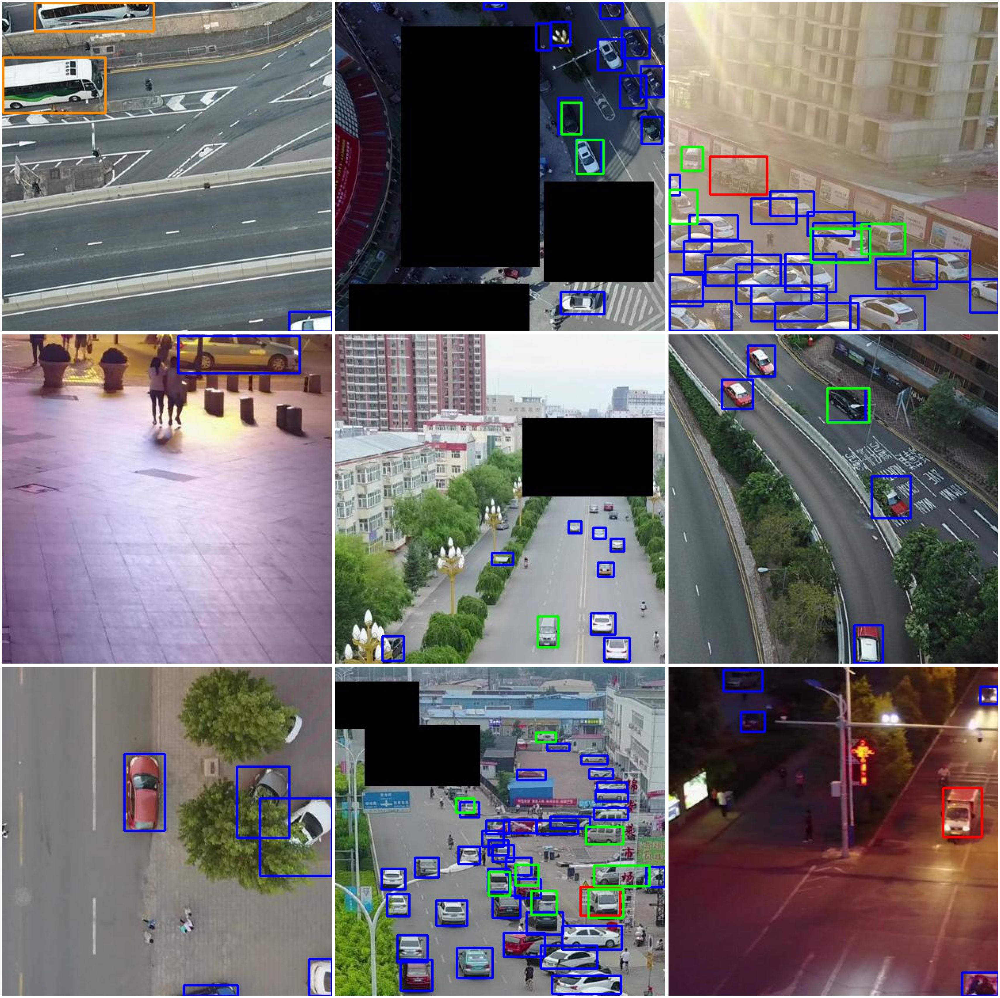

In [5]:
# plot detections
outname, detection_thresh = 'yolt2_ave_26x26_visdrone_v1_4cat', 0.3
rows, cols = 3, 3
figsize = 16
tmp_dir = os.path.join('/local_data/cosmiq/src/avanetten/yoltv4/darknet/results/',
           outname, 'pred_plots_' + str(detection_thresh).replace('.', 'p'))
image_paths_tmp_all = [os.path.join(tmp_dir, z) for z in os.listdir(tmp_dir)]
image_paths_tmp = random.sample(image_paths_tmp_all, rows*cols)

print("image_names:", [os.path.basename(z) for z in image_paths_tmp[:rows*cols]])
fig, axes = plt.subplots(nrows=rows, ncols=cols,  figsize=(figsize*cols, 0.99*figsize*rows))
for i in range(rows*cols):
    ax = axes.flatten()[i]
    im_path_tmp = image_paths_tmp[i] # rand_selection[i]
    im = skimage.io.imread(im_path_tmp)
    ax.imshow(im)
    ax.axis('off')
    #ax.set_title(os.path.basename(im_path_tmp) + '  ' + str(im.shape))
plt.tight_layout()

### Score

In [7]:

results_name, detection_thresh = 'yolt2_ave_26x26_visdrone_v1_4cat', 0.3
proposal_polygons_dir = os.path.join(yoltv4_path, 'darknet', 'results', results_name, 'geojsons_pix_0p35')
gt_polygons_dir = os.path.join(test_root, 'yolt/v1_4cat/gdf_pix')

print("Ground Truth:", gt_polygons_dir)
print("Proposals:", proposal_polygons_dir, "\n")

object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj,\
precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences = \
yolt_eval.mAP_score(proposal_polygons_dir, gt_polygons_dir,
              prediction_cat_attrib="category", gt_cat_attrib='label_str',
              object_subset=[], threshold=0.5, confidence_attrib="prob",
              file_format="geojson")
print("object_subset:", object_subset)
print("f1s_by_class:", f1s_by_class)
print("mF1_score:", mF1_score)

  0%|          | 3/11236 [00:00<08:05, 23.15it/s]

Ground Truth: /local_data/cosmiq/wdata/avanetten/VisDrone/data/VisDrone2019-DET-test-dev/yolt/v1_4cat/gdf_pix
Proposals: /local_data/cosmiq/src/avanetten/yoltv4/darknet/results/yolt2_ave_26x26_visdrone_v1_4cat/geojsons_pix_0p35 

getting unique objects...


  0%|          | 2/11236 [00:00<09:52, 18.97it/s]

calculating recall...


  0%|          | 2/11236 [00:00<10:21, 18.09it/s]

mRecall: 0.5434637384413717
calculating precision...


100%|██████████| 11236/11236 [10:13<00:00, 18.31it/s]


mPrecision: 0.564606090089685
calculating F1 scores...
mF1: 0.5502705900345422
mAP: 0.4627800066732362 @IOU: 0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences
object_subset: ['bus', 'car', 'truck', 'van']
f1s_by_class: [0.5891989231445625, 0.7204086863479194, 0.43384729573432096, 0.4576274549113658]
mF1_score: 0.5502705900345422


In [6]:
# Errors 

results_name, detection_thresh = 'yolt2_ave_26x26_visdrone_v1_4cat', 0.3
proposal_polygons_dir = os.path.join(yoltv4_path, 'darknet', 'results', results_name, 'geojsons_pix_0p35')
gt_polygons_dir = os.path.join(test_root, 'yolt/v1_4cat/gdf_pix')

# reload(eval)
reload(yolt_eval_errors)

N_bootstraps = 50
N_threads = 10
iou_threshold = 0.5
yolt_thresh_str = '_0p3'
prediction_cat_attrib = 'category'
gt_cat_attrib = 'label_str'

print("Ground Truth:", gt_polygons_dir)
print("Proposals:", proposal_polygons_dir, "\n")

# bootstrap scores and stds (multi-threaded)
out_path_scores = os.path.join(yoltv4_path, 'darknet', 'results', results_name, 
                               'scores_stds_bootstrap' + yolt_thresh_str + '.csv')
print("out_path_scores:", out_path_scores)

t0 = time.time()
if not os.path.exists(out_path_scores):
    %timeit
    object_list, df_tot = yolt_eval_errors.mAP_bootstrap(proposal_polygons_dir, gt_polygons_dir,
                  geojson_names_subset=[],
                  prediction_cat_attrib=prediction_cat_attrib, gt_cat_attrib=gt_cat_attrib,
                  object_subset=[], 
                  threshold=iou_threshold, 
                  confidence_attrib='prob',
                  file_format="geojson",
                  N_bootstraps=N_bootstraps,
                  N_threads=N_threads,
                  verbose=True)
    df_tot.to_csv(out_path_scores, index_label='idx')
    print("bootstraps saved to:", out_path_scores)
else:
    print("bootstraps already computed, located at:", out_path_scores)
    !head -1 {out_path_scores}
    !tail -2 {out_path_scores}
print("Execution time:", time.time() - t0, "seconds")

  0%|          | 3/11236 [00:00<06:26, 29.05it/s]

Ground Truth: /local_data/cosmiq/wdata/avanetten/VisDrone/data/VisDrone2019-DET-test-dev/yolt/v1_4cat/gdf_pix
Proposals: /local_data/cosmiq/src/avanetten/yoltv4/darknet/results/yolt2_ave_26x26_visdrone_v1_4cat/geojsons_pix_0p35 

out_path_scores: /local_data/cosmiq/src/avanetten/yoltv4/darknet/results/yolt2_ave_26x26_visdrone_v1_4cat/scores_stds_bootstrap_0p3.csv
getting unique objects...


100%|██████████| 11236/11236 [04:30<00:00, 41.52it/s]


N objects =  4 objects: ['bus', 'car', 'truck', 'van']
Execute...


Iteration=0
calculating recall...

Iteration=2

  0%|          | 0/11236 [00:00<?, ?it/s]


calculating recall...

Iteration=4

  0%|          | 0/11236 [00:00<?, ?it/s]


calculating recall...

Iteration=6


  0%|          | 0/11236 [00:00<?, ?it/s]

calculating recall...

Iteration=8

  0%|          | 0/11236 [00:00<?, ?it/s]


calculating recall...


  0%|          | 0/11236 [00:00<?, ?it/s]


Iteration=10
calculating recall...
Iteration=12



  0%|          | 0/11236 [00:00<?, ?it/s]

calculating recall...


  0%|          | 0/11236 [00:00<?, ?it/s]


Iteration=16

Iteration=14calculating recall...

calculating recall...


  0%|          | 0/11236 [00:00<?, ?it/s]


Iteration=18
calculating recall...


100%|██████████| 11236/11236 [13:09<00:00, 14.24it/s]


mRecall: 0.5510416046551603
calculating precision...


 99%|█████████▊| 11068/11236 [13:13<00:13, 12.78it/s]

mRecall: 0.5497346360509621
calculating precision...


 99%|█████████▉| 11124/11236 [13:22<00:08, 12.72it/s]

mRecall: 0.5427035603229534
calculating precision...


100%|██████████| 11236/11236 [13:25<00:00, 13.94it/s]


mRecall: 

 99%|█████████▉| 11112/11236 [13:25<00:08, 14.29it/s]

0.5451676607112087
calculating precision...

 98%|█████████▊| 11044/11236 [13:25<00:14, 12.85it/s]

 98%|█████████▊| 11032/11236 [13:25<00:13, 14.82it/s]

mRecall: 0.5459020818084738
calculating precision...


  2%|▏         | 280/11236 [00:20<13:07, 13.91it/s]s]

mRecall: 0.5409035084084218
calculating precision...

 99%|█████████▉| 11169/11236 [13:30<00:05, 12.70it/s]

 99%|█████████▉| 11171/11236 [13:35<00:04, 13.29it/s]

mRecall: 0.5424427650637756
calculating precision...


100%|█████████▉| 11222/11236 [13:39<00:00, 14.05it/s]

mRecall: 0.543535300247236
calculating precision...


  1%|          | 59/11236 [00:04<13:28, 13.82it/s]]s]

mRecall: 0.535356209270458
calculating precision...


100%|██████████| 11236/11236 [13:40<00:00, 13.70it/s]


mRecall: 0.5356496269224701


  3%|▎         | 374/11236 [00:26<11:56, 15.16it/s]

calculating precision...


100%|██████████| 11236/11236 [13:53<00:00, 13.49it/s]


mPrecision: 0.5657639657846995
calculating F1 scores...
mF1: 0.5549684777019847


100%|██████████| 11236/11236 [13:49<00:00, 13.55it/s]


mPrecision: 0.5607972250685145
calculating F1 scores...
mF1: 0.5522073360777491


 95%|█████████▍| 10640/11236 [13:28<00:48, 12.26it/s]

mAP: 

 97%|█████████▋| 10933/11236 [13:41<00:18, 16.73it/s]

0.46674114629945684 @IOU: 0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences

 96%|█████████▌| 10755/11236 [13:33<00:39, 12.10it/s]

 94%|█████████▍| 10545/11236 [13:23<00:48, 14.30it/s]


Iteration=19
calculating recall...


 94%|█████████▎| 10526/11236 [13:23<01:05, 10.85it/s]

mAP: 0.46850214334432605

 97%|█████████▋| 10884/11236 [13:38<00:23, 14.94it/s]

 @IOU: 0.5

 97%|█████████▋| 10941/11236 [13:41<00:16, 17.88it/s]

 94%|█████████▍| 10551/11236 [13:23<00:47, 14.29it/s]

returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences

Iteration=15
calculating recall...

 97%|█████████▋| 10953/11236 [13:38<00:19, 14.44it/s]

 96%|█████████▋| 10828/11236 [13:46<00:32, 12.62it/s]

mPrecision: 0.5589450180026951
calculating F1 scores...
mF1: 0.5489229217758488


  3%|▎         | 326/11236 [00:22<12:36, 14.43it/s]s]

mPrecision:

 96%|█████████▋| 10832/11236 [13:45<00:39, 10.27it/s]

 0.5660509986848706
calculating F1 scores...
mF1: 0.5506039031003149


 96%|█████████▋| 10842/11236 [13:46<00:31, 12.57it/s]

mAP: 0.4641499297737046 

  3%|▎         | 314/11236 [00:22<16:24, 11.10it/s]

@IOU: 0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences


100%|█████████▉| 11180/11236 [14:00<00:04, 13.37it/s]


Iteration=1
calculating recall...


  3%|▎         | 342/11236 [00:23<11:54, 15.24it/s]s]

mAP: 0.464398531361485

100%|█████████▉| 11182/11236 [14:00<00:04, 11.21it/s]

 @IOU: 0.5

 97%|█████████▋| 10849/11236 [13:47<00:24, 15.71it/s]


returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences

Iteration=7
calculating recall...


 97%|█████████▋| 10901/11236 [13:50<00:28, 11.81it/s]

mPrecision: 0.5677691947720178
calculating F1 scores...
mF1: 0.552666788775173

  1%|          | 60/11236 [00:04<13:37, 13.66it/s]

 97%|█████████▋| 10914/11236 [13:52<00:26, 11.98it/s]

mAP: 0.4628711602484952 @IOU: 0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences

Iteration=13
calculating recall...


  5%|▍         | 517/11236 [00:36<11:20, 15.76it/s]s]

mPrecision: 0.5601452657045434
calculating F1 scores...
mF1: 0.5467806670248211


 98%|█████████▊| 11042/11236 [14:02<00:16, 12.08it/s]

mAP:

  2%|▏         | 203/11236 [00:14<11:00, 16.70it/s]

 0.4621062873778373 @IOU: 0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences


  2%|▏         | 196/11236 [00:15<12:21, 14.89it/s]


Iteration=9
calculating recall...


  6%|▌         | 684/11236 [00:46<10:48, 16.26it/s]s]

mPrecision: 0.5641852812634779
calculating F1 scores...
 

  1%|          | 119/11236 [00:07<12:09, 15.23it/s]

mF1:0.5494788910706768


  3%|▎         | 320/11236 [00:24<11:42, 15.54it/s]s]

mAP: 0.4614736900509418 @IOU: 

  6%|▌         | 664/11236 [00:46<11:04, 15.91it/s]

0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences

Iteration=11
calculating recall...


100%|██████████| 11236/11236 [14:16<00:00, 13.12it/s]


mPrecision: 0.5703200368170125
calculating F1 scores...
mF1: 0.5524906273703939

  7%|▋         | 772/11236 [00:52<12:02, 14.49it/s]

  1%|          | 74/11236 [00:05<13:10, 14.12it/s]]

mPrecision: 0.5681794115189363
calculating F1 scores...
mF1:

  7%|▋         | 737/11236 [00:52<12:31, 13.98it/s]

 0.547502920468689


  4%|▎         | 415/11236 [00:30<13:19, 13.53it/s]

mPrecision: 0.5717927232629221
calculating F1 scores...
mF1: 0.5483181084464601


  1%|          | 84/11236 [00:06<17:27, 10.65it/s]]

mAP: 0.46722902534612837

  3%|▎         | 334/11236 [00:25<15:02, 12.08it/s]

 @IOU: 

  4%|▎         | 418/11236 [00:30<11:48, 15.27it/s]

0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences


  7%|▋         | 749/11236 [00:53<14:14, 12.28it/s]


Iteration=17
calculating recall...


  4%|▍         | 428/11236 [00:30<12:40, 14.20it/s]

mAP: 0.4585658994495522 @IOU: 0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences

Iteration=5
calculating recall...


  7%|▋         | 803/11236 [00:54<12:34, 13.82it/s]

mAP: 0.4605218624845726 @IOU: 

  0%|          | 15/11236 [00:00<11:50, 15.79it/s]

0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences

Iteration=3
calculating recall...

  7%|▋         | 762/11236 [00:54<13:08, 13.28it/s]

100%|██████████| 11236/11236 [13:08<00:00, 14.25it/s]


mRecall: 0.5323761056424704

 99%|█████████▉| 11119/11236 [13:07<00:07, 15.35it/s]


calculating precision...


 92%|█████████▏| 10297/11236 [12:29<01:08, 13.63it/s]

mRecall: 

 93%|█████████▎| 10421/11236 [12:38<00:56, 14.45it/s]

0.5442665064544304
calculating precision...


 94%|█████████▎| 10518/11236 [12:58<00:55, 12.94it/s]

mRecall: 

  4%|▍         | 488/11236 [00:35<12:36, 14.21it/s]

0.5421466197583632

 96%|█████████▌| 10786/11236 [13:04<00:35, 12.85it/s]


calculating precision...


  0%|          | 47/11236 [00:03<16:21, 11.40it/s]]

mRecall: 0.5451970529261915
calculating precision...


 96%|█████████▌| 10748/11236 [13:05<00:29, 16.58it/s]

mRecall: 0.5483570045737688
calculating precision...


 99%|█████████▉| 11141/11236 [13:30<00:06, 15.50it/s]

mRecall: 0.5502415261887421
calculating precision...


 99%|█████████▉| 11097/11236 [13:30<00:11, 12.35it/s]

mRecall: 0.5422910508408396
calculating precision...


  5%|▌         | 568/11236 [00:42<11:00, 16.14it/s]]]

mRecall: 0.540584050005649
calculating precision...


  5%|▍         | 530/11236 [00:39<18:17,  9.75it/s]

mRecall: 0.5459880768521697
calculating precision...


100%|██████████| 11236/11236 [13:52<00:00, 13.50it/s]


mRecall: 0.5439271009883566
calculating precision...


 91%|█████████ | 10171/11236 [12:52<01:21, 13.11it/s]

mPrecision: 0.5645355157707852

 93%|█████████▎| 10466/11236 [12:59<01:02, 12.41it/s]


calculating F1 scores...
mF1: 0.5439716533654212


 92%|█████████▏| 10320/11236 [12:56<01:39,  9.19it/s]

mAP: 0.45186439474032464 @IOU: 0.5

 87%|████████▋ | 9735/11236 [12:17<02:25, 10.30it/s]

 93%|█████████▎| 10484/11236 [13:00<00:49, 15.15it/s]

returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences


 99%|█████████▉| 11113/11236 [13:35<00:10, 11.73it/s]


Iteration=20
calculating recall...


 87%|████████▋ | 9809/11236 [12:27<01:33, 15.29it/s]

mPrecision:

 84%|████████▍ | 9465/11236 [12:16<01:50, 16.09it/s]

 0.5625945120663538
calculating F1 scores...
mF1: 0.5497034700902756


 93%|█████████▎| 10461/11236 [13:07<00:53, 14.36it/s]

mAP: 0.458337020824642 

 92%|█████████▏| 10324/11236 [13:04<01:15, 12.05it/s]

@IOU: 0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences

Iteration=22
calculating recall...


 97%|█████████▋| 10890/11236 [13:48<00:24, 14.29it/s]

mPrecision:

 94%|█████████▍| 10553/11236 [13:29<00:54, 12.46it/s]

 0.5607518334129628
calculating F1 scores...
mF1: 0.5478830593923529


 93%|█████████▎| 10422/11236 [13:14<00:56, 14.33it/s]

mAP: 0.45969268237250677 @IOU:

 97%|█████████▋| 10906/11236 [13:49<00:26, 12.23it/s]

 0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences

Iteration=24


  6%|▌         | 651/11236 [00:45<13:01, 13.54it/s]

calculating recall...


 95%|█████████▍| 10650/11236 [13:26<00:48, 12.05it/s]

mPrecision: 0.5692348294207592
calculating F1 scores...
mF1: 0.55318877293494


 94%|█████████▍| 10613/11236 [13:28<00:39, 15.65it/s]

mAP: 0.46314235206363885 @IOU: 0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences


  2%|▏         | 184/11236 [00:14<12:57, 14.21it/s]


Iteration=26

  8%|▊         | 865/11236 [00:59<11:01, 15.69it/s]

 99%|█████████▊| 11095/11236 [14:03<00:11, 12.52it/s]

calculating recall...


 10%|█         | 1156/11236 [01:20<12:23, 13.57it/s]]

mPrecision: 0.5720179872822456
calculating F1 scores...
mF1: 0.5563528287560453


 97%|█████████▋| 10891/11236 [13:56<00:24, 14.07it/s]

mAP: 

  9%|▉         | 1030/11236 [01:11<12:11, 13.96it/s]

0.47078205760475966 

  1%|▏         | 156/11236 [00:11<12:55, 14.29it/s]

@IOU: 0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences

Iteration=28


 96%|█████████▌| 10762/11236 [13:40<00:36, 12.87it/s]

calculating recall...


  6%|▌         | 652/11236 [00:45<11:25, 15.44it/s]]

mPrecision: 0.5671054712935032
calculating F1 scores...

  2%|▏         | 269/11236 [00:20<14:44, 12.40it/s]


mF1: 0.5505867897155988


  3%|▎         | 287/11236 [00:21<10:21, 17.62it/s]s]

mAP: 0.4588335974793633 @IOU:

 13%|█▎        | 1482/11236 [01:43<11:34, 14.04it/s]

 0.5


 95%|█████████▍| 10634/11236 [13:49<00:51, 11.67it/s]

returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences

Iteration=30
calculating recall...


  1%|          | 84/11236 [00:05<13:35, 13.67it/s]]

mPrecision: 0.567954727445541
calculating F1 scores...
mF1: 0.5553155302389916


 95%|█████████▌| 10718/11236 [13:57<00:37, 13.94it/s]

mAP: 0.46918482062423095 @IOU: 0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences


  7%|▋         | 767/11236 [00:54<12:34, 13.88it/s]


Iteration=32
calculating recall...


100%|██████████| 11236/11236 [14:12<00:00, 13.18it/s]


mPrecision: 0.5712888596042249
calculating F1 scores...
mF1: 0.5547522069570803


  6%|▌         | 632/11236 [00:45<15:28, 11.42it/s]s]

mAP: 0.46970875261091843 @IOU: 0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences

Iteration=34
calculating recall...

  1%|          | 76/11236 [00:05<16:57, 10.97it/s]

 96%|█████████▋| 10838/11236 [14:05<00:26, 14.79it/s]

mPrecision: 0.5694645683119547
calculating F1 scores...
mF1: 0.5506817544369982


  5%|▍         | 526/11236 [00:38<13:17, 13.43it/s]]]

mAP:

 97%|█████████▋| 10852/11236 [14:07<00:33, 11.33it/s]

  6%|▌         | 699/11236 [00:49<11:10, 15.72it/s]

0.4650086277964858 @IOU: 

  2%|▏         | 242/11236 [00:17<13:12, 13.87it/s]

0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences

Iteration=36


  1%|          | 136/11236 [00:10<14:59, 12.34it/s]

calculating recall...


100%|██████████| 11236/11236 [14:36<00:00, 12.82it/s]


mPrecision: 0.5680662046347115

 18%|█▊        | 1984/11236 [02:19<10:16, 15.01it/s]

  4%|▎         | 402/11236 [00:29<14:27, 12.49it/s]

calculating F1 scores...
mF1: 0.551904628828965


  6%|▌         | 656/11236 [00:47<13:37, 12.94it/s]]

mAP: 0.4665910295661626

 19%|█▉        | 2166/11236 [02:30<10:20, 14.61it/s]

 @IOU: 0.5


  9%|▊         | 956/11236 [01:08<12:01, 14.24it/s]

returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences


 10%|█         | 1133/11236 [01:20<14:33, 11.57it/s]



Iteration=38
calculating recall...

 80%|████████  | 9027/11236 [11:07<02:27, 14.93it/s]

mRecall: 

 75%|███████▍  | 8420/11236 [10:36<03:53, 12.06it/s]

0.5427127300832537
calculating precision...


 82%|████████▏ | 9199/11236 [11:20<02:44, 12.38it/s]

mRecall: 0.5540428799705254
calculating precision...


 97%|█████████▋| 10951/11236 [13:04<00:23, 12.09it/s]

mRecall: 0.5409232477171649
calculating precision...


  2%|▏         | 262/11236 [00:20<15:09, 12.07it/s]s]

mRecall: 0.5490000977525773
calculating precision...

 92%|█████████▏| 10286/11236 [12:45<01:03, 14.88it/s]

100%|██████████| 11236/11236 [13:42<00:00, 13.66it/s]


mRecall: 0.5447432121857214
calculating precision...


 97%|█████████▋| 10851/11236 [13:21<00:25, 15.04it/s]

mRecall: 0.5450388666363642
calculating precision...

 97%|█████████▋| 10913/11236 [13:31<00:25, 12.86it/s]

 98%|█████████▊| 11038/11236 [13:41<00:16, 12.29it/s]

mRecall: 0.5473022056699813
calculating precision...


  8%|▊         | 938/11236 [01:09<11:56, 14.38it/s]]

mRecall: 0.5469901123050144
calculating precision...


 20%|█▉        | 2237/11236 [02:43<10:06, 14.84it/s]

mRecall: 0.5519569895607901
calculating precision...


 15%|█▍        | 1669/11236 [02:05<11:13, 14.20it/s]

mRecall: 0.5502462967832803

 17%|█▋        | 1945/11236 [02:26<10:20, 14.98it/s]


calculating precision...


100%|██████████| 11236/11236 [13:41<00:00, 13.68it/s]


mPrecision: 0.568665515763602
calculating F1 scores...
mF1: 0.5519175463163646


 83%|████████▎ | 9295/11236 [11:45<01:45, 18.35it/s]]

mAP: 0.46391961268912746 @IOU: 0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences

Iteration=21

 98%|█████████▊| 10999/11236 [13:29<00:14, 16.88it/s]


calculating recall...


 80%|███████▉  | 8936/11236 [11:21<02:44, 13.96it/s]

mPrecision: 0.5657989935387026
calculating F1 scores...
mF1: 0.5564091649669987

 71%|███████   | 7948/11236 [10:25<03:36, 15.20it/s]

 80%|███████▉  | 8952/11236 [11:22<02:36, 14.62it/s]]

mAP: 0.47283799247818953 @IOU: 0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences


 93%|█████████▎| 10438/11236 [12:52<00:54, 14.72it/s]


Iteration=23
calculating recall...


 78%|███████▊  | 8715/11236 [11:26<04:07, 10.17it/s]

mPrecision:

 10%|█         | 1158/11236 [01:18<11:30, 14.59it/s]

 0.5683356548377745


 86%|████████▋ | 9716/11236 [12:22<01:41, 14.99it/s]

calculating F1 scores...

 89%|████████▉ | 10048/11236 [12:36<01:36, 12.29it/s]


mF1: 0.5500175635891433


 90%|█████████ | 10148/11236 [12:47<01:26, 12.59it/s]

mAP: 0.46260308756770385 @IOU: 0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences

Iteration=25
calculating recall...

 90%|████████▉ | 10065/11236 [12:37<01:19, 14.80it/s]

 10%|▉         | 1117/11236 [01:21<13:20, 12.64it/s]

mPrecision: 0.5678964174754182
calculating F1 scores...
mF1: 0.5547028002594411


 93%|█████████▎| 10443/11236 [13:09<01:00, 13.18it/s]

mAP: 0.4733516749319936 @IOU: 0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences

Iteration=27
calculating recall...


 95%|█████████▍| 10629/11236 [13:30<00:51, 11.68it/s]

mPrecision: 0.562459407650828
calculating F1 scores...
mF1: 0.5499677815396176


 93%|█████████▎| 10449/11236 [13:26<00:56, 13.98it/s]

mAP: 0.46482211418223285 @IOU:

 98%|█████████▊| 11001/11236 [13:46<00:18, 12.45it/s]

 0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences

Iteration=29
calculating recall...


 87%|████████▋ | 9768/11236 [12:48<01:43, 14.16it/s]]

mPrecision: 0.5669289733653549
calculating F1 scores...
mF1: 0.5522040821025329


 87%|████████▋ | 9780/11236 [12:49<01:56, 12.51it/s]]

mAP: 

100%|█████████▉| 11182/11236 [13:59<00:03, 15.04it/s]

0.4666682897714156 @IOU: 

  2%|▏         | 196/11236 [00:13<11:12, 16.43it/s]

0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences

Iteration=31
calculating recall...


 11%|█         | 1200/11236 [01:25<10:33, 15.84it/s]

mPrecision: 0.5652675738004818

 18%|█▊        | 2024/11236 [02:26<13:57, 11.00it/s]


calculating F1 scores...


  8%|▊         | 864/11236 [01:03<14:07, 12.24it/s]

mF1: 0.5528423126436064


 18%|█▊        | 2038/11236 [02:28<12:29, 12.27it/s]]

mAP: 0.4676186437691105 

 95%|█████████▌| 10700/11236 [13:44<00:38, 13.82it/s]

@IOU: 0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences

Iteration=35
calculating recall...


  6%|▌         | 624/11236 [00:44<12:26, 14.21it/s]

mPrecision: 0.5695732202611801
calculating F1 scores...
mF1: 0.554585170482253


 11%|█         | 1261/11236 [01:32<12:20, 13.46it/s]]

mAP: 0.47216402391114165 

 91%|█████████ | 10213/11236 [13:22<01:11, 14.36it/s]

@IOU: 0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences

 25%|██▍       | 2798/11236 [03:13<10:57, 12.83it/s]

 22%|██▏       | 2420/11236 [02:55<13:03, 11.25it/s]


Iteration=33
calculating recall...


 92%|█████████▏| 10380/11236 [13:36<01:07, 12.61it/s]

mPrecision: 0.5693421952247344
calculating F1 scores...
mF1: 0.5573526658439978


  2%|▏         | 210/11236 [00:16<13:58, 13.16it/s]]]

mAP: 0.47310836155246483 @IOU:

 16%|█▋        | 1828/11236 [02:10<11:30, 13.63it/s]

 0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences

Iteration=37
calculating recall...


 21%|██▏       | 2389/11236 [02:55<10:34, 13.95it/s]

mPrecision: 0.569702096118557

 35%|███▌      | 3970/11236 [04:37<06:25, 18.85it/s]


calculating F1 scores...


  8%|▊         | 911/11236 [01:07<12:27, 13.81it/s]

mF1:

 25%|██▍       | 2799/11236 [03:18<12:13, 11.50it/s]

 0.5564957424982081


 32%|███▏      | 3616/11236 [04:20<08:07, 15.63it/s]

mAP: 0.4662404767612943

 21%|██▏       | 2406/11236 [02:57<09:09, 16.06it/s]

 @IOU: 0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences

 16%|█▌        | 1800/11236 [02:10<09:27, 16.63it/s]



Iteration=39
calculating recall...

 25%|██▌       | 2817/11236 [03:19<08:50, 15.88it/s]

 74%|███████▍  | 8355/11236 [10:02<03:17, 14.60it/s]]

mRecall: 0.541630853387375
calculating precision...


  2%|▏         | 230/11236 [00:16<12:44, 14.39it/s]

mRecall: 0.5411883900404634
calculating precision...


100%|██████████| 11236/11236 [13:17<00:00, 14.09it/s]


mRecall: 0.550810565569666
calculating precision...


 14%|█▍        | 1549/11236 [01:56<13:59, 11.54it/s]

mRecall: 0.5293974935588941


 94%|█████████▍| 10569/11236 [12:43<00:49, 13.49it/s]

calculating precision...


 98%|█████████▊| 11042/11236 [13:31<00:15, 12.77it/s]

mRecall: 0.5404816842174693
calculating precision...


 94%|█████████▎| 10515/11236 [12:47<00:54, 13.19it/s]

mRecall: 0.5483090874869498
calculating precision...


100%|██████████| 11236/11236 [13:45<00:00, 13.61it/s]


mRecall: 0.5445524143108537
calculating precision...


 23%|██▎       | 2571/11236 [03:12<09:15, 15.59it/s]]

mRecall: 0.5458489091407064
calculating precision...


 18%|█▊        | 1986/11236 [02:32<10:59, 14.03it/s]

mRecall: 0.5394973351314206
calculating precision...


 18%|█▊        | 1993/11236 [02:34<15:00, 10.26it/s]

mRecall: 0.5413449497513197
calculating precision...


 76%|███████▋  | 8575/11236 [10:59<03:32, 12.53it/s]

mPrecision:

 99%|█████████▉| 11156/11236 [14:01<00:06, 13.14it/s]

 0.5622577287449032
calculating F1 scores...
mF1: 0.5478435901219523


 77%|███████▋  | 8640/11236 [11:05<03:16, 13.19it/s]]

mAP: 0.4613537559501199 @IOU:

 76%|███████▌  | 8500/11236 [10:52<03:35, 12.72it/s]

 0.5

 71%|███████▏  | 8019/11236 [10:09<03:51, 13.89it/s]


returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences


 82%|████████▏ | 9206/11236 [11:49<02:22, 14.26it/s]


Iteration=40
calculating recall...


 83%|████████▎ | 9273/11236 [11:54<02:31, 12.96it/s]

mPrecision: 0.5595810900085108
calculating F1 scores...
mF1: 0.5466701701749221


 83%|████████▎ | 9289/11236 [11:55<02:08, 15.10it/s]]

mAP: 0.461885691185144 @IOU: 0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences


 76%|███████▋  | 8579/11236 [10:58<02:52, 15.41it/s]


Iteration=42
calculating recall...


 12%|█▏        | 1316/11236 [01:32<10:49, 15.28it/s]]

mPrecision: 0.5673775952579951
calculating F1 scores...
mF1: 

 82%|████████▏ | 9248/11236 [11:42<02:43, 12.17it/s]

0.5558714647435955


 12%|█▏        | 1331/11236 [01:33<11:49, 13.95it/s]]

mAP: 0.4725599543691656 @IOU: 0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences


 87%|████████▋ | 9760/11236 [12:26<01:51, 13.20it/s]


Iteration=44
calculating recall...


 74%|███████▍  | 8330/11236 [10:59<03:21, 14.39it/s]]

mPrecision: 0.5601577951138108
calculating F1 scores...


 18%|█▊        | 2009/11236 [02:26<09:46, 15.73it/s]

mF1: 0.5405140991678454


 94%|█████████▍| 10598/11236 [13:35<00:54, 11.80it/s]

mAP: 0.4539300420347807

 18%|█▊        | 2026/11236 [02:28<13:22, 11.48it/s]

 @IOU: 0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences


 74%|███████▍  | 8342/11236 [11:01<03:50, 12.54it/s]


Iteration=46

  7%|▋         | 814/11236 [01:00<15:31, 11.19it/s]


calculating recall...


 95%|█████████▌| 10706/11236 [13:32<00:49, 10.70it/s]

mPrecision: 0.5705726009667436
calculating F1 scores...
mF1: 0.555424568976197


 80%|███████▉  | 8951/11236 [11:50<02:58, 12.79it/s]]

mPrecision: 

 26%|██▌       | 2908/11236 [03:23<08:37, 16.08it/s]

0.5632289900065444


100%|█████████▉| 11228/11236 [14:29<00:00, 15.76it/s]

calculating F1 scores...
mF1: 0.5499683949867715


 80%|███████▉  | 8960/11236 [11:50<02:25, 15.64it/s]]

mAP: 0.46692745654682005 

 24%|██▍       | 2711/11236 [03:17<09:17, 15.28it/s]

@IOU: 

 97%|█████████▋| 10955/11236 [13:56<00:24, 11.35it/s]

0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences

Iteration=48
calculating recall...


100%|██████████| 11236/11236 [14:29<00:00, 12.92it/s]


mPrecision: 0.5621588446945747
calculating F1 scores...
mF1: 

 98%|█████████▊| 10957/11236 [13:56<00:23, 11.69it/s]

0.5473610336261578


 24%|██▍       | 2715/11236 [03:18<15:53,  8.93it/s]]

mAP: 0.46297998640023663 

 13%|█▎        | 1482/11236 [01:50<09:58, 16.30it/s]

@IOU: 0.5

 98%|█████████▊| 10964/11236 [13:57<00:20, 13.48it/s]


returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences


 96%|█████████▌| 10737/11236 [13:34<00:44, 11.14it/s]

mAP: 

 26%|██▌       | 2930/11236 [03:25<10:56, 12.66it/s]

0.4656688275941242 @IOU: 0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences


 29%|██▊       | 3215/11236 [03:44<09:11, 14.55it/s]

mPrecision: 0.5618989628743896
calculating F1 scores...
mF1: 0.5502968065936306


 16%|█▌        | 1779/11236 [02:12<10:02, 15.69it/s]]

mAP: 0.46266257211794243 @IOU: 

 29%|██▉       | 3234/11236 [03:45<08:16, 16.11it/s]

0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences


 11%|█         | 1227/11236 [01:28<11:40, 14.29it/s]

mPrecision: 0.561809561087244
calculating F1 scores...
mF1: 0.5467984673792067


 18%|█▊        | 2021/11236 [02:30<09:25, 16.31it/s]

mAP: 0.46098654037815157 @IOU: 0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences


100%|██████████| 11236/11236 [14:51<00:00, 12.61it/s]


mPrecision: 0.558721457086144
calculating F1 scores...
mF1: 0.5464291808674588


 22%|██▏       | 2447/11236 [03:01<11:58, 12.23it/s]

mAP: 

 28%|██▊       | 3136/11236 [03:51<10:43, 12.58it/s]

0.4544520795718956 @IOU: 0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences


100%|██████████| 11236/11236 [13:25<00:00, 13.95it/s]


mRecall: 0.5374848792326538
calculating precision...


 87%|████████▋ | 9753/11236 [12:26<01:41, 14.59it/s]

mRecall: 0.5491525326976551
calculating precision...


 17%|█▋        | 1930/11236 [02:28<13:10, 11.77it/s]

mRecall: 0.5499620247118805
calculating precision...


 94%|█████████▍| 10574/11236 [13:21<00:59, 11.20it/s]

mRecall: 0.5470501205763832
calculating precision...


100%|██████████| 11236/11236 [14:13<00:00, 13.17it/s]


mRecall: 0.5473977498879854
calculating precision...


 70%|███████   | 7877/11236 [09:58<04:10, 13.43it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 75%|███████▍  | 8425/11236 [11:21<03:55, 11.91it/s]]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 25%|██▌       | 2816/11236 [03:25<09:44, 14.41it/s]

mPrecision: 0.5645330542189553
calculating F1 scores...
mF1: 0.5539159019360853


 25%|██▌       | 2832/11236 [03:26<08:32, 16.41it/s]]

mAP: 0.4648532926576287 @IOU: 0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences

Iteration=45
calculating recall...


 26%|██▌       | 2871/11236 [03:29<10:37, 13.12it/s]]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 26%|██▋       | 2971/11236 [03:54<11:35, 11.88it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 51%|█████▏    | 5779/11236 [07:30<07:17, 12.48it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.i

mRecall: 0.5465364414386706
calculating precision...


 99%|█████████▉| 11131/11236 [13:52<00:08, 13.05it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 96%|█████████▌| 10805/11236 [13:52<00:32, 13.47it/s]

mRecall: 0.5447070793742519
calculating precision...


 33%|███▎      | 3709/11236 [04:44<09:16, 13.53it/s]]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 19%|█▉        | 2167/11236 [02:53<11:45, 12.85it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 51%|█████     | 5704/11236 [07:45<08:30, 10.84it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.i

mPrecision: 0.5649017795258666
calculating F1 scores...
mF1: 0.5465621400917737


 72%|███████▏  | 8036/11236 [10:58<04:28, 11.91it/s]

mAP: 0.45712213244839006 @IOU: 0.5
returning: object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj, precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences


 73%|███████▎  | 8218/11236 [11:09<03:54, 12.87it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [7]:
# inspect bootstrap dataframes

results_names = ['yolt2_ave_26x26_visdrone_v1_4cat'
                ]
thresh_strs = ['_0p3']

for results_name, thresh_str in zip(results_names, thresh_strs):
    print("\n")
    print(results_name)
    out_path_scores = os.path.join(yoltv4_path, 'darknet', 'results', 
                                   results_name, 'scores_stds_bootstrap' + thresh_str + '.csv')
    if os.path.exists(out_path_scores):
        df_tmp = pd.read_csv(out_path_scores)
        display(df_tmp.tail())
    else:
        print("  No results yet")
    print("\n")



yolt2_ave_26x26_visdrone_v1_4cat


,idx,mAP,mF1,bus_AP,bus_F1,car_AP,car_F1,truck_AP,truck_F1,van_AP,van_F1
47,47,0.464897,0.552800,0.485196,0.581032,0.694377,0.721750,0.348167,0.448337,0.331849,0.460080
48,48,0.471184,0.554884,0.502867,0.587600,0.693515,0.721677,0.349968,0.444600,0.338385,0.465658
49,49,0.464410,0.550635,0.502513,0.589606,0.691568,0.717506,0.338433,0.439113,0.325126,0.456313
50,mean,0.464645,0.551205,0.497359,0.588085,0.694220,0.720768,0.337506,0.436150,0.329496,0.459817
51,std,0.005072,0.003687,0.009741,0.006824,0.004202,0.002304,0.012640,0.009114,0.006478,0.005452
